# Exploratory Data Analysis (EDA)

### Datathon challenge task
Predict the duration of time it takes for patients to receive metastatic cancer diagnosis.

### EDA Techniques
- Analysis
    - Load data
    - Understand the data:
        - Categorize the types of features
        - Data shape, types, missing (null) values, unique values
        - Categorical vs numeric data, and which of the categorical data is ordinal (has an order)
        - Statistical analysis
        - Visualizations
            - Univariate
            - Bivariate
            - Multivariate
    - Feature correlations
- Cleaning
    - Removing features
    - Handling missing data
    - Encoding categorical variables
- Feature engineering


In [32]:
#pip install seaborn

In [19]:
# Import libraries

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, RobustScaler
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(style="whitegrid")

# Analysis

## Load data

In [20]:
# Load .csv data as dataframes and make patient_id the index

df_train = pd.read_csv('data/train.csv', index_col='patient_id')
df_test = pd.read_csv('data/test.csv', index_col='patient_id')

# Look at the first few rows of data
df_train.head()

,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,...,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
patient_id,,,,,,,,,,,,,,,,,,,,,
268700,NaN,COMMERCIAL,AR,724,South,West South Central,39,F,NaN,C50912,...,52.55,74.77,79.96,81.69,78.30,74.56,59.98,42.98,41.18,191
484983,White,NaN,IL,629,Midwest,East North Central,55,F,35.36,C50412,...,49.30,72.87,77.40,77.43,75.83,72.64,58.36,39.68,39.71,33
277055,NaN,COMMERCIAL,CA,925,West,Pacific,59,F,NaN,1749,...,68.50,70.31,78.61,87.24,85.52,80.75,70.81,62.67,55.58,157
320055,Hispanic,MEDICAID,CA,900,West,Pacific,59,F,NaN,C50911,...,63.34,63.10,67.45,75.86,75.24,71.10,68.95,65.46,59.46,146
190386,NaN,COMMERCIAL,CA,934,West,Pacific,71,F,NaN,1748,...,59.45,60.24,64.77,69.81,70.13,68.10,65.38,60.72,54.08,286


## Understand the data

### Categorize the types of features

Read the [data descriptions](https://www.kaggle.com/competitions/widsdatathon2024-challenge2/data) on Kaggle.

**Patient characteristics:** patient_race, payer_type, patient_age, patient_gender, bmi

**Patient location:** patient_state, patient_zip3, region, division

**Breast cancer diagnosis information:** breast_cancer_diagnosis_code, breast_cancer_diagnosis_desc, metastatic_cancer_diagnosis_code, 
    metastatic_first_novel_treatment, metastatic_first_novel_treatment_type

**Geo (zip-code level) demographic data:** Many! (population, income, education, rent, race, poverty etc)

**Climate data:** 72 columns showing the zip 3 Monthly Average Temperature for the patient’s zip 3 and month referenced

**Target variable:** metastatic_diagnosis_period

In [7]:
# Define a function that shows the data dimensions (# rows and columns), total # NA values, and data types, 
# number of distinct NA (null) values for each column (feature)

def initial_eda(df):
    if isinstance(df, pd.DataFrame):
        total_na = df.isna().sum().sum()
        print("Dimensions : %d rows, %d columns" % (df.shape[0], df.shape[1]))
        print("Total NA Values : %d " % (total_na))
        print("%38s %10s     %10s %10s" % ("Column Name", "Data Type", "#Distinct", "NaN Values"))
        col_name = df.columns
        dtyp = df.dtypes
        uniq = df.nunique()
        na_val = df.isna().sum()
        for i in range(len(df.columns)):
            print("%38s %10s   %10s %10s" % (col_name[i], dtyp[i], uniq[i], na_val[i]))
        
    else:
        print("Expect a DataFrame but got a %15s" % (type(df)))

In [8]:
# Call the function on our training data

initial_eda(df_train)

Dimensions : 13173 rows, 151 columns
Total NA Values : 44929 
                           Column Name  Data Type      #Distinct NaN Values
                          patient_race     object            5       6657
                            payer_type     object            3       1765
                         patient_state     object           44          0
                          patient_zip3      int64          751          0
                                Region     object            4          0
                              Division     object            8          0
                           patient_age      int64           67          0
                        patient_gender     object            1          0
                                   bmi    float64         1304       9071
          breast_cancer_diagnosis_code     object           47          0
          breast_cancer_diagnosis_desc     object           47          0
      metastatic_cancer_diagnosis_code     objec

In [9]:
# Call the function on our testing data

initial_eda(df_test)

Dimensions : 5646 rows, 150 columns
Total NA Values : 19247 
                           Column Name  Data Type      #Distinct NaN Values
                          patient_race     object            5       2785
                            payer_type     object            3        785
                         patient_state     object           44          0
                          patient_zip3      int64          669          0
                                Region     object            4          0
                              Division     object            8          0
                           patient_age      int64           67          0
                        patient_gender     object            1          0
                                   bmi    float64          838       3941
          breast_cancer_diagnosis_code     object           41          0
          breast_cancer_diagnosis_desc     object           41          0
      metastatic_cancer_diagnosis_code     object

#### Observations

**Data types**

- 11 object types in train and test - these are categorical features
    - None of these seem to be ordinal

- 3 integer types in train, 2 in test - zip, age, and the target variable (metastatic_diagnosis_period)

- The rest of the features are floats

**# distinct values**

- Only 1 distinct value for patient_gender (female) in train and test data, so we can drop this feature

- Only 1 distinct value for metastatic_first_novel_treatment_type in train and test data, and only 11 rows contain a value in train and 7 in test, so we can drop this feature

- Only 2 distinct values for metastatic_first_novel_treatment in train and test data, and only 11 rows contain a value in train and 7 in test, so we can probably drop this feature, but look for any strong correlation with the target feature

- patient_zip3 and population have the same number of unique values in train (751) and test (669), so do we need them both? 
Population is a size, so it might be important. Is zip random? How strong is the correlation with the target variable?

**NaN values - need to start thinking about how to handle these**

- patient_race: ~half are missing in train and test

- payer_type: 13-14% are missing in train and test

- bmi: 69-70% are missing in train and test

- metastatic_cancer_diagnosis_code and metastatic_first_novel_treatment_type: almost all are missing

- Several features (23) are missing 5 values in the train data but none of those are missing in the test data. Are the 5 missing values for
each feature in the same row? If so, can we just drop those rows? (Yes, all are in the same rows and they are in the same zip, and those
are the only 5 records for that zip, but that zip is not in the test data, so we can probably drop them.)

- Avg temps: Missing 0-180 in train and 0-95 in test. The 180/95 are in Apr-14 and are all in NY (6 zips) or ID (1 zip) in both train
and test


### Drop features and observations that logically add no value

In [21]:
# Drop features

# Only one value for patient_gender
# Only one value for metastatic_first_novel_treatment_type and two values for metastatic_first_novel_treatment, 
# and there are only 11 non-null rows in the train data, and 7 non-null in the test data

drop_features = [
                    'metastatic_first_novel_treatment',         # rarely filled in
                    'metastatic_first_novel_treatment_type',    # rarely filled in
                    'patient_gender',                           # always the same value
                   ]

# Always perform the same actions on train and test data
df_train = df_train.drop(drop_features, axis=1)
df_test = df_test.drop(drop_features, axis=1)


In [22]:
# Drop rows

# Drop the 5 rows that have 23 missing features all from the same zip; that zip is not present in the test set
mask = (df_train['patient_zip3'] == 772)
df_train = df_train.drop(df_train[df_train['patient_zip3'] == 772].index)

# Check the shape (originally we had 13173 rows)
df_train.shape

(13168, 148)

### Statistical summary

In [5]:
# Do not truncate

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [10]:
print(df_train.describe())

       patient_zip3   patient_age          bmi    population       density  \
count  13168.000000  13168.000000  4100.000000  13168.000000  13168.000000   
mean     568.453600     59.271188    29.168134  20657.522308   1776.265136   
std      275.782326     13.220198     5.753867  13839.409209   3876.672464   
min      100.000000     18.000000    15.000000    635.550000      0.920000   
25%      330.000000     50.000000    24.815000   9160.340000    163.150000   
50%      554.000000     59.000000    28.580000  18952.780000    700.340000   
75%      832.000000     67.000000    33.000000  30021.280000   1666.520000   
max      995.000000     91.000000    97.000000  71374.130000  29851.690000   

         age_median  age_under_10  age_10_to_19       age_20s       age_30s  \
count  13168.000000  13168.000000  13168.000000  13168.000000  13168.000000   
mean      40.550248     11.109205     12.849066     13.278844     12.897883   
std        4.013012      1.496247      1.902994      3.25498

In [11]:
print(df_test.describe())

       patient_zip3  patient_age          bmi    population       density  \
count   5646.000000  5646.000000  1705.000000   5646.000000   5646.000000   
mean     569.824655    58.921537    29.142798  20865.277040   1826.421314   
std      276.824893    13.326813     5.612167  14252.666477   3928.358993   
min      100.000000    18.000000    16.000000    829.520000      0.920000   
25%      330.000000    50.000000    24.840000   8893.480000    161.930000   
50%      554.000000    59.000000    28.340000  19154.190000    688.010000   
75%      836.000000    66.000000    33.140000  30145.890000   1686.320000   
max      997.000000    91.000000    43.700000  71374.130000  29851.690000   

        age_median  age_under_10  age_10_to_19      age_20s      age_30s  \
count  5646.000000   5646.000000   5646.000000  5646.000000  5646.000000   
mean     40.509499     11.123819     12.868130    13.291959    12.902175   
std       3.983375      1.498752      1.906942     3.226722     2.395298   
mi

#### Observations

**patient_zip3** max in test is different than train so we know there are values in test that are not in train (and probably vice versa)

**patient_age** range from 18-91

**bmi** max is 97 in train but only 43.7 in test! Looking closer, there is one 90 and one 97 in the train data, which are anomalies,
perhaps we remove those rows

**target variable** min=0, max=365, mean=96.5, std=109, count of 0=3126, count >= 350=224

### Categorical vs numerical features

In [24]:
# Create variables for the categorical and numeric features of df_train (df_test will be the same except the target col)
# Also create a variable for the target column

cat_cols=df_train.select_dtypes(include=['object']).columns
num_cols = df_train.select_dtypes(include=np.number).columns.tolist()
target_col = 'metastatic_diagnosis_period'
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['patient_race', 'payer_type', 'patient_state', 'Region', 'Division',
       'breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc',
       'metastatic_cancer_diagnosis_code'],
      dtype='object')
Numerical Variables:
['patient_zip3', 'patient_age', 'bmi', 'population', 'density', 'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male', 'female', 'married', 'divorced', 'never_married', 'widowed', 'family_size', 'family_dual_income', 'income_household_median', 'income_household_under_5', 'income_household_5_to_10', 'income_household_10_to_15', 'income_household_15_to_20', 'income_household_20_to_25', 'income_household_25_to_35', 'income_household_35_to_50', 'income_household_50_to_75', 'income_household_75_to_100', 'income_household_100_to_150', 'income_household_150_over', 'income_household_six_figure', 'income_individual_median', 'home_ownership', 'housing_units', 'home

### Compare unique values in df_train and df_test

Which features are present in the training data but not in the test data, and vice versa

In [42]:
# Iterate over the columns of df_train
for col in df_train.columns:
    # Check if the column exists in df_test
    if col in df_test.columns:
        # Get the unique values of col in df_train
        unique_values_train = df_train[col].unique()
        # Get the unique values of col in df_test
        unique_values_test = df_test[col].unique()
        # Find the differences between the two sets
        differences = set(unique_values_train) - set(unique_values_test)
        diff_count = len(differences)
        if len(differences) > 0:
            print(f"{col} has the following unique values that are not present in the test dataset: {differences}")
            print(f"{col} has the following number of differences: {diff_count}")

patient_zip3 has the following unique values that are not present in the test dataset: {512, 514, 516, 521, 523, 538, 540, 558, 567, 571, 572, 575, 577, 580, 585, 590, 623, 129, 644, 648, 138, 139, 651, 652, 654, 664, 155, 668, 158, 671, 673, 164, 165, 677, 167, 678, 169, 684, 686, 691, 716, 209, 724, 725, 216, 219, 222, 223, 734, 739, 746, 749, 247, 248, 251, 252, 256, 263, 264, 266, 276, 277, 788, 279, 795, 288, 292, 807, 297, 824, 827, 828, 829, 326, 844, 845, 855, 859, 860, 355, 356, 358, 877, 366, 367, 897, 388, 397, 412, 414, 424, 995, 508}
patient_zip3 has the following number of differences: 93
bmi has the following unique values that are not present in the test dataset: {15.0, 19.85, 20.81, 21.25, 22.5, 23.87, 23.61, 24.75, 24.25, 27.67, 28.3, 27.38, 27.13, 28.38, 29.25, 25.5, 25.25, 26.5, 30.01, 37.05, 38.28, 38.78, 38.53, 37.55, 38.54, 35.36, 36.11, 37.8, 37.39, 38.91, 42.16, 43.93, 43.1, 44.08, 43.89, 54.0, 26.21, 26.96, 90.0, 97.0, 20.78, 20.53, 20.03, 20.72, 21.28, 21.22,

In [43]:
# Iterate over the columns of df_test
for col in df_test.columns:
    # Check if the column exists in df_test
    if col in df_train.columns:
        # Get the unique values of col in df_train
        unique_values_test = df_test[col].unique()
        # Get the unique values of col in df_test
        unique_values_train = df_train[col].unique()
        # Find the differences between the two sets
        differences = set(unique_values_test) - set(unique_values_train)
        diff_count = len(differences)
        if len(differences) > 0:
            print(f"{col} has the following unique values that are not present in the train dataset: {differences}")
            print(f"{col} has the following number of differences: {diff_count}")

patient_zip3 has the following unique values that are not present in the train dataset: {260, 997, 646, 520, 874, 747, 268, 689, 214, 250, 573, 351}
patient_zip3 has the following number of differences: 12
bmi has the following unique values that are not present in the train dataset: {19.75, 19.97, 21.88, 20.22, 23.47, 20.25, 25.21, 26.16, 26.82, 27.56, 27.31, 27.35, 28.66, 28.88, 33.72, 33.59, 28.81, 28.1, 28.07, 29.33, 30.59, 32.33, 32.78, 33.91, 41.96, 42.78, 42.3, 43.32, 39.06, 39.19, 41.34, 41.44, 43.63, 43.7, 31.65, 31.4, 34.12, 30.34, 35.86, 35.61, 19.83, 20.89, 20.71, 21.1, 21.65, 21.33, 21.64, 21.21, 22.79, 22.1, 22.82, 22.89, 22.42, 23.75, 23.5, 23.54, 23.42, 22.43, 24.28, 24.14, 23.68, 24.65, 24.43, 25.04, 25.65, 25.9, 25.43, 26.97, 26.71, 26.42, 27.47, 28.67, 28.14, 29.22, 29.5, 29.85, 29.67, 29.59, 30.22, 30.35, 37.12, 30.57, 31.22, 31.6, 31.61, 31.14, 31.83, 31.36, 32.31, 32.2, 32.39, 32.41, 34.41, 33.26, 33.49, 33.14, 33.17, 32.68, 34.31, 34.76, 34.74, 34.24, 34.26, 35.9

#### Observations

**patient_race, payer_type, patient_state, Region, Division, patient_age** Same values in train and test

**patient_zip3 and population** Train has 93 zips/populations not in test, test has 12 zips/populations not in train

**breast_cancer_diagnosis_code** Train has 7 values not in test (but just 1 or a few occurences of each), test has 1 value not in train (but only 1 occurrence of it)

**metastatic_cancer_diagnosis_code** Train has 7 values not in test (but just 1 or a few occurences of each), test has 2 values not in train (but only 1 occurrence of each)

### Visualizations

Categorical variables can be visualized using a Count plot, Bar Chart, Pie Plot, etc.

Numerical Variables can be visualized using Histogram, Box Plot, Density Plot, etc.

#### Univariate analysis

Looks at each feature individually

patient_zip3
Skew : -0.1


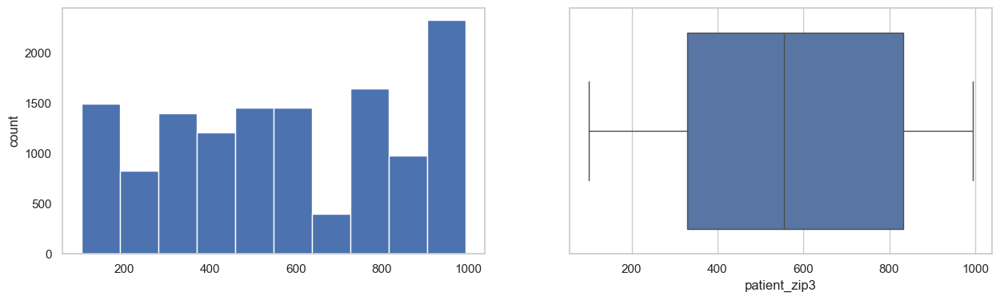

patient_age
Skew : 0.16


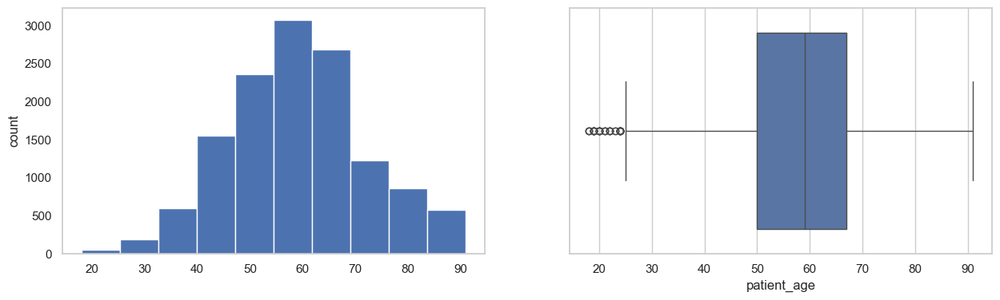

bmi
Skew : 0.99


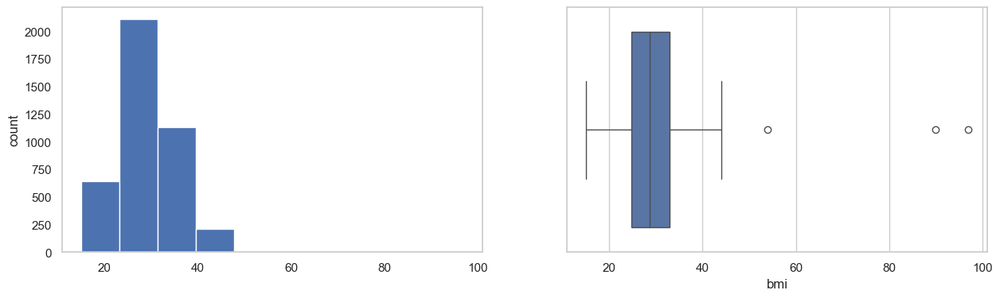

population
Skew : 0.97


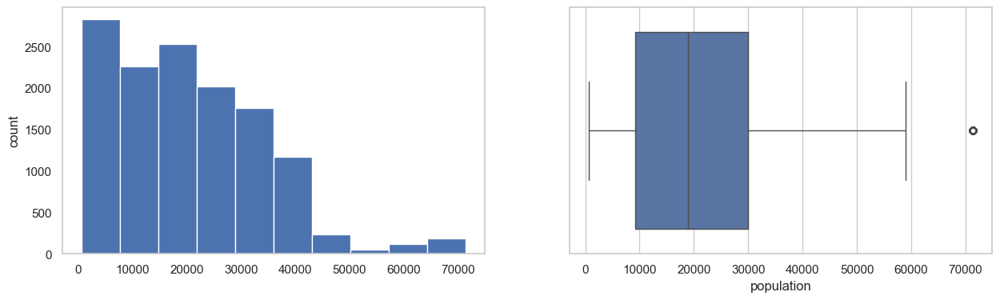

density
Skew : 4.78


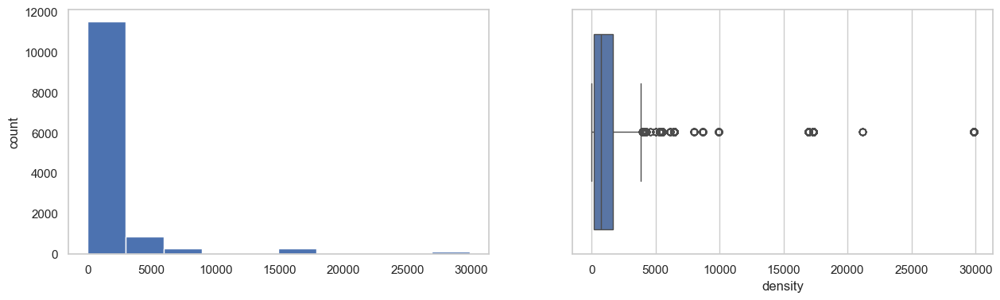

age_median
Skew : 0.3


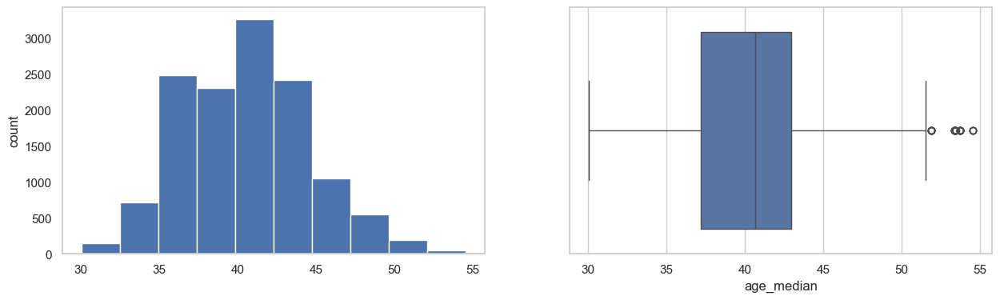

age_under_10
Skew : -0.02


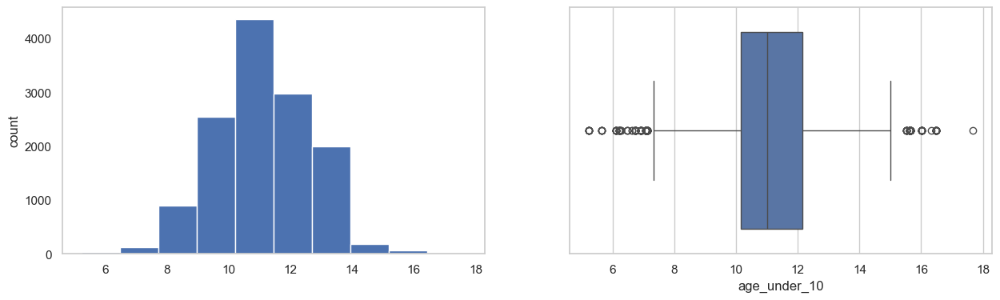

age_10_to_19
Skew : 0.67


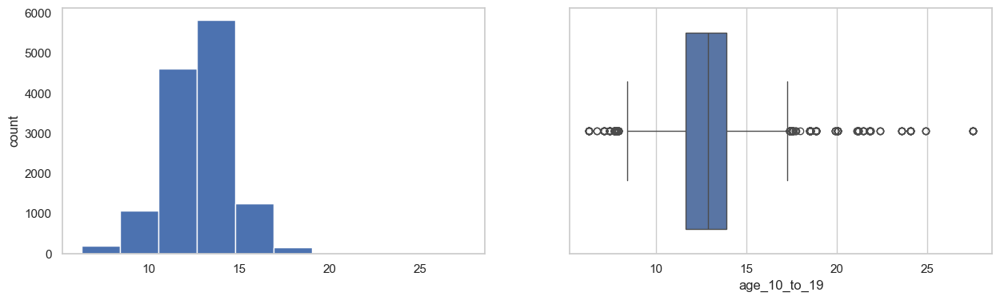

age_20s
Skew : 1.42


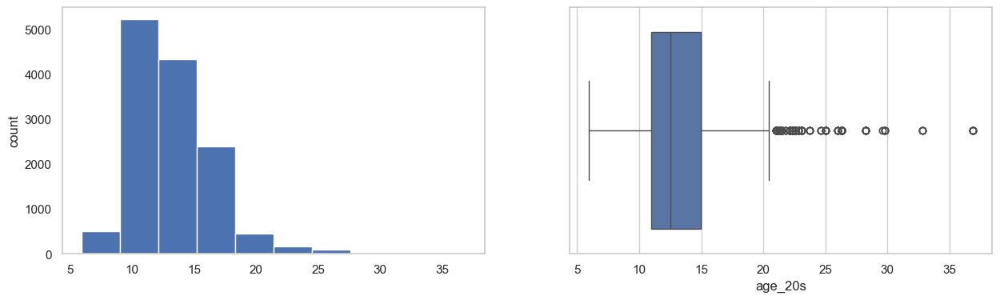

age_30s
Skew : 1.03


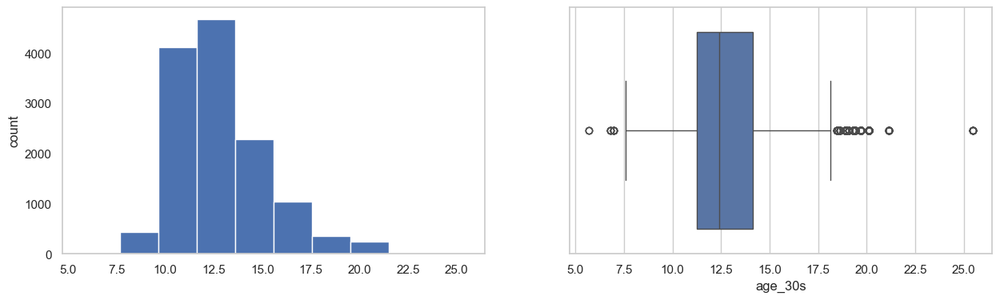

age_40s
Skew : -0.19


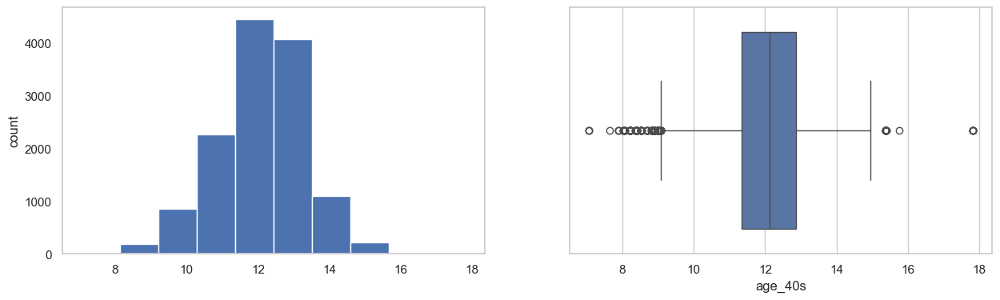

age_50s
Skew : 0.05


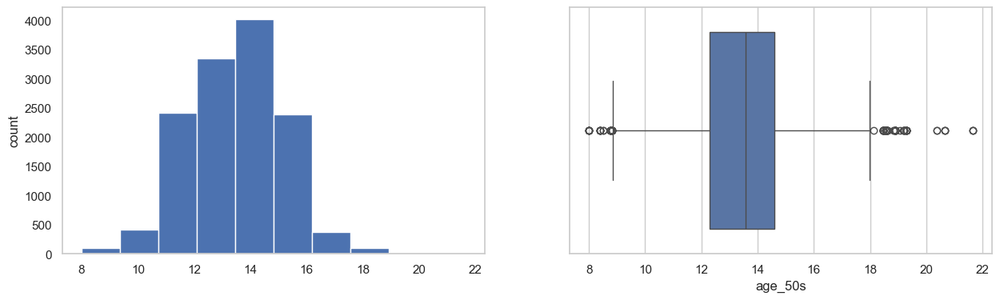

age_60s
Skew : 0.69


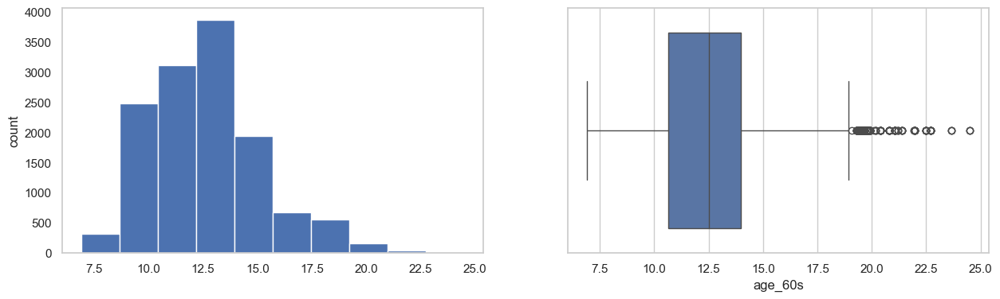

age_70s
Skew : 1.08


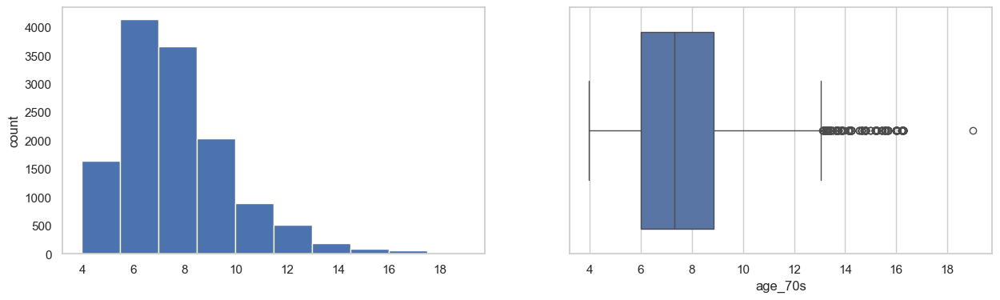

age_over_80
Skew : 2.97


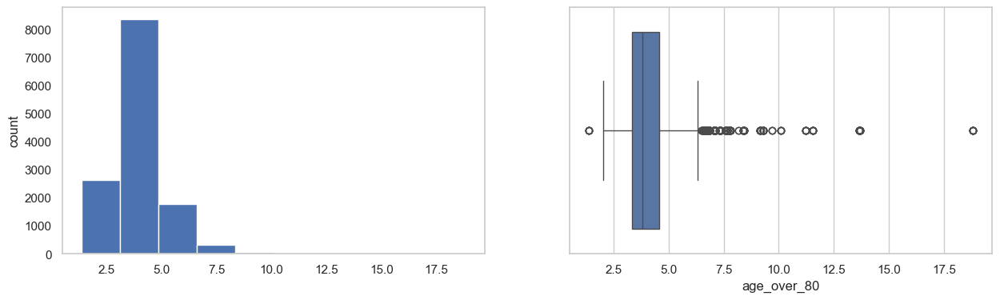

male
Skew : 0.73


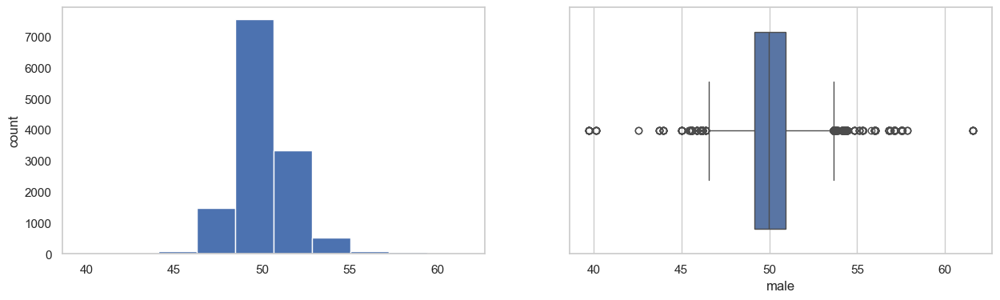

female
Skew : -0.73


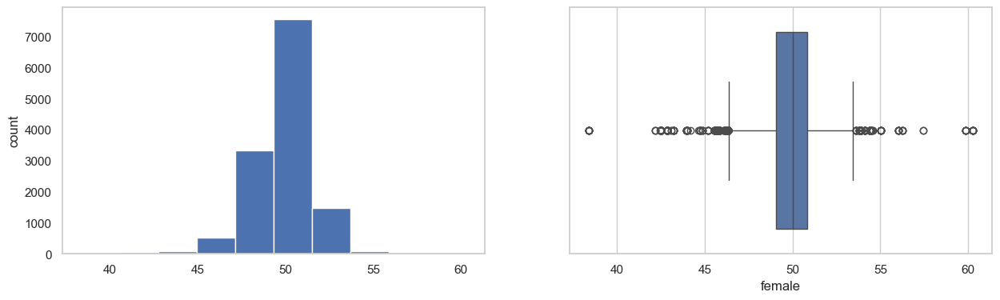

married
Skew : -0.69


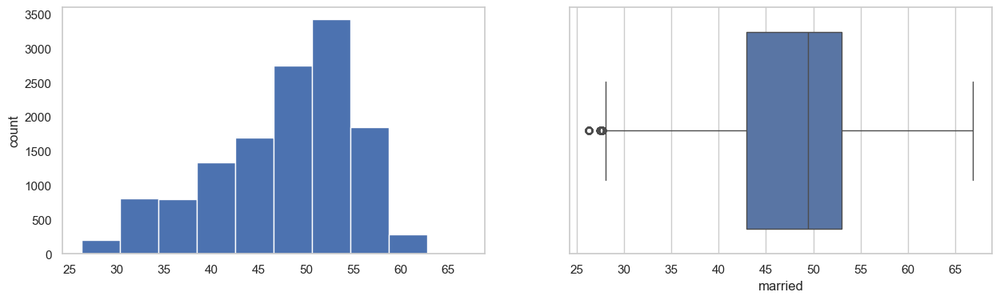

divorced
Skew : 0.14


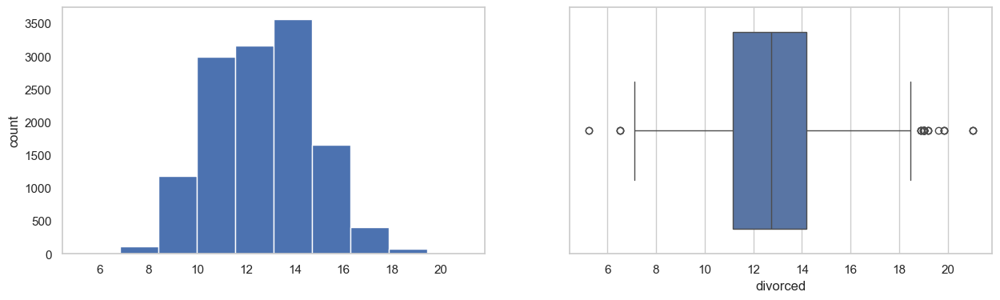

never_married
Skew : 0.71


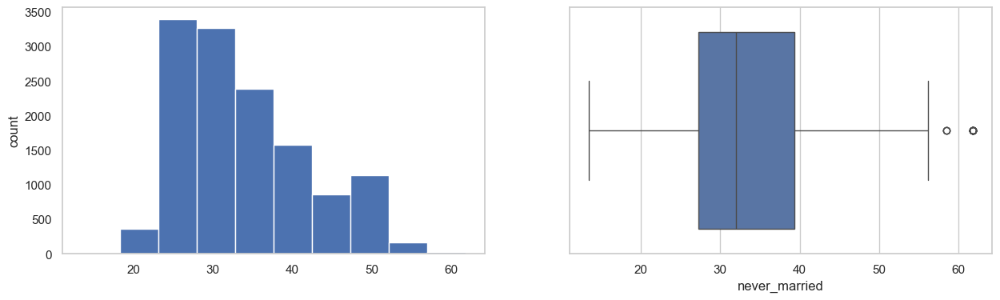

widowed
Skew : 1.63


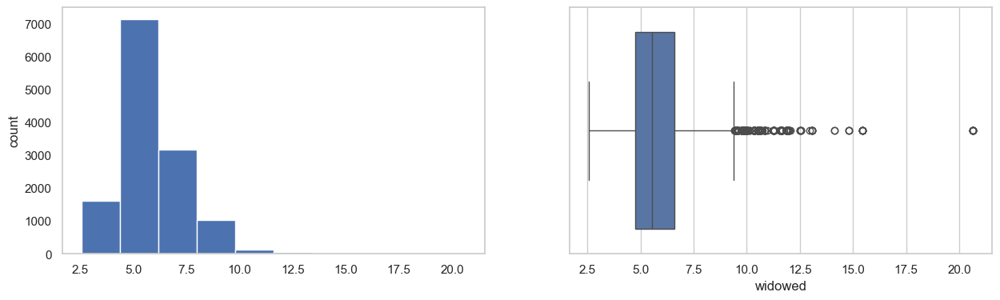

family_size
Skew : 0.79


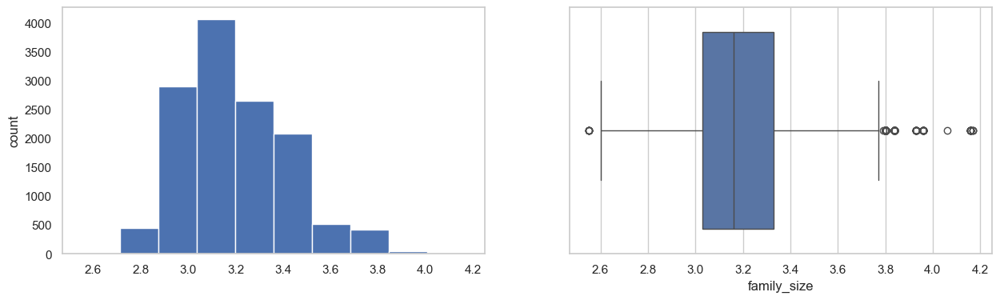

family_dual_income
Skew : -0.52


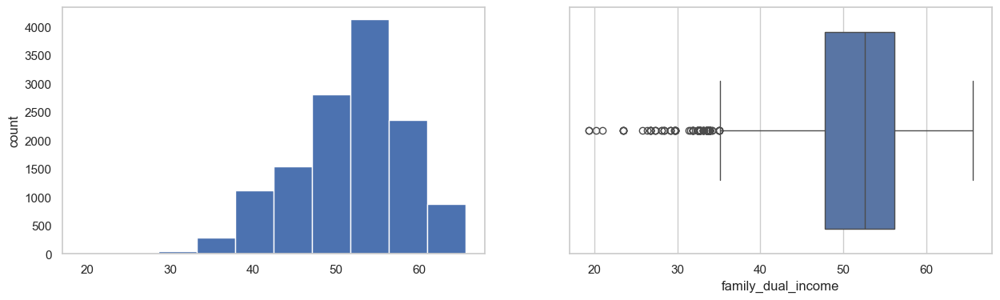

income_household_median
Skew : 1.11


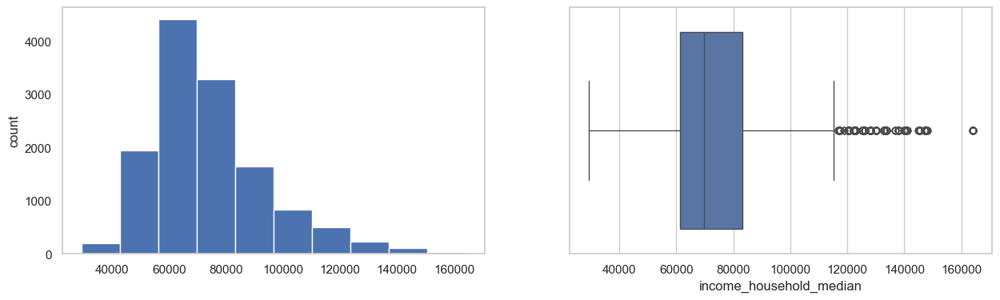

income_household_under_5
Skew : 1.99


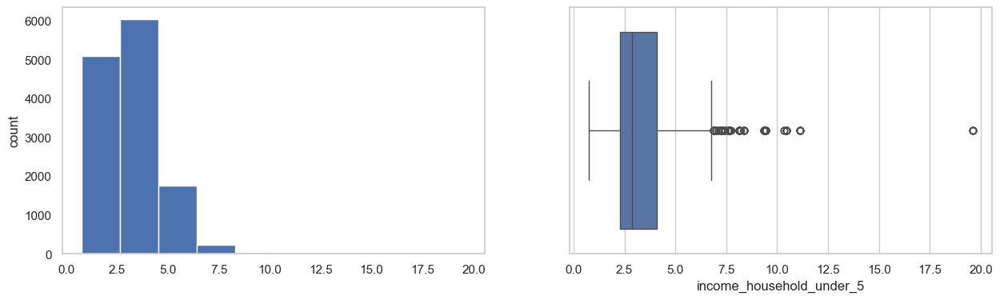

income_household_5_to_10
Skew : 1.58


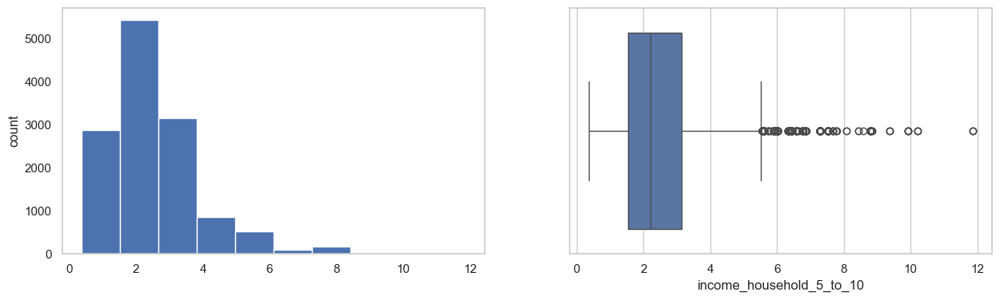

income_household_10_to_15
Skew : 1.01


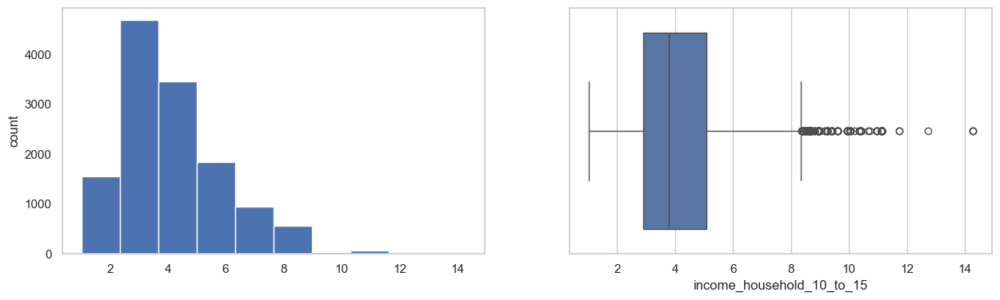

income_household_15_to_20
Skew : 0.81


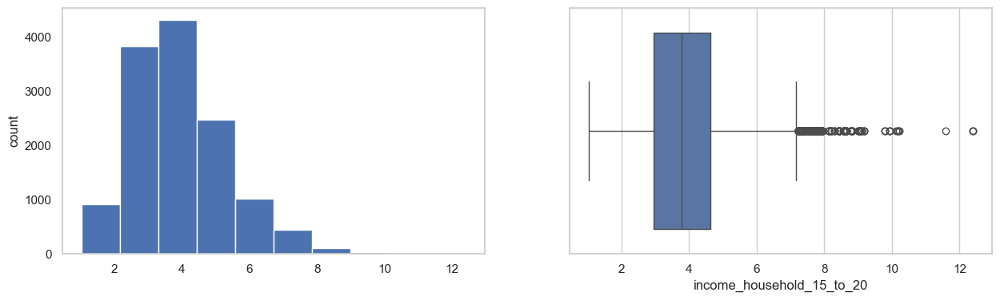

income_household_20_to_25
Skew : 0.71


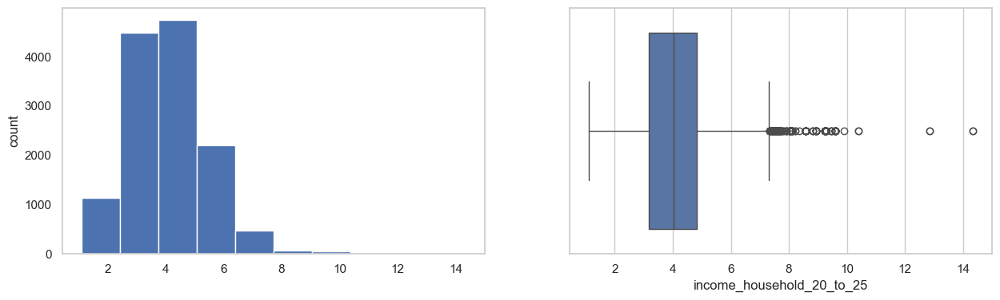

income_household_25_to_35
Skew : 0.22


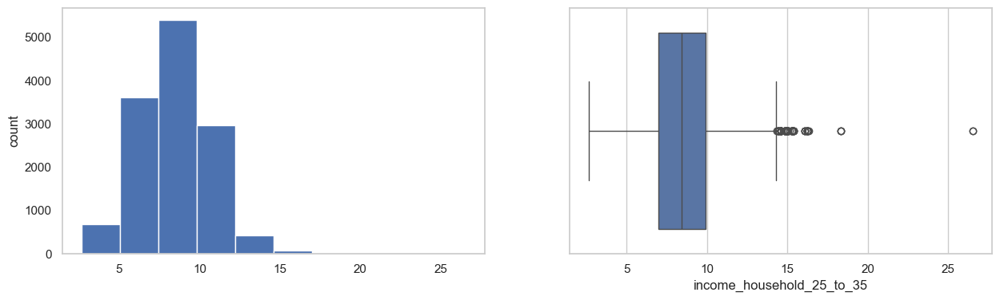

income_household_35_to_50
Skew : -0.12


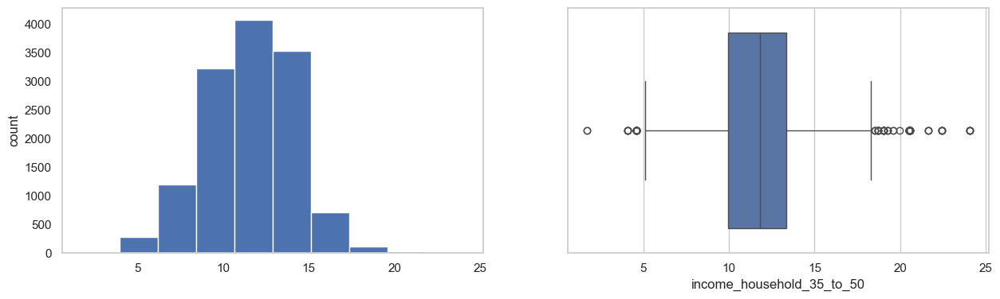

income_household_50_to_75
Skew : -0.23


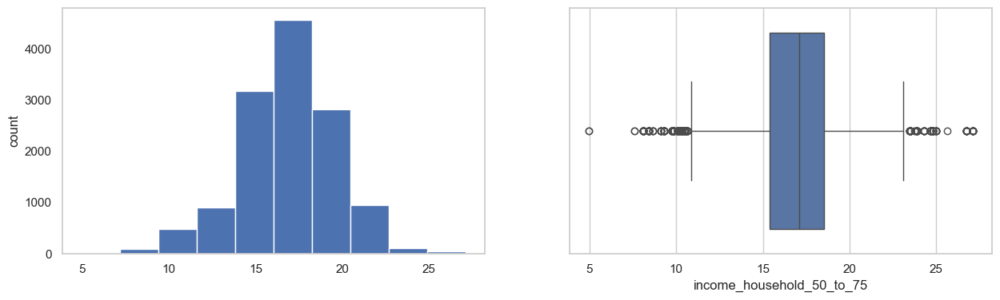

income_household_75_to_100
Skew : 0.03


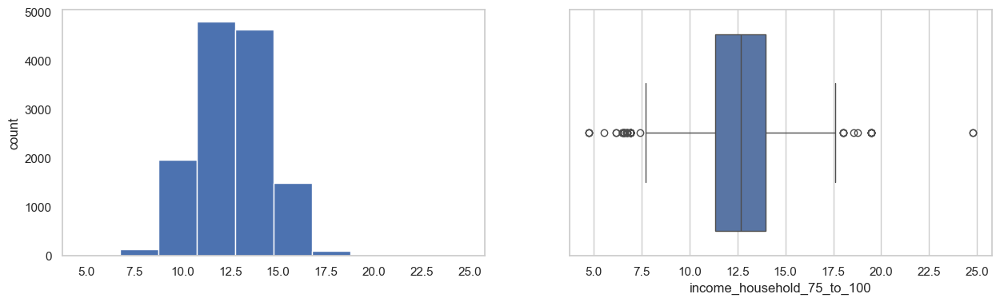

income_household_100_to_150
Skew : -0.19


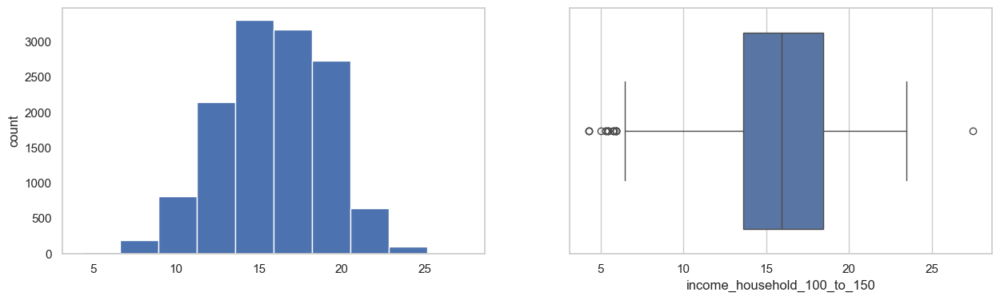

income_household_150_over
Skew : 1.16


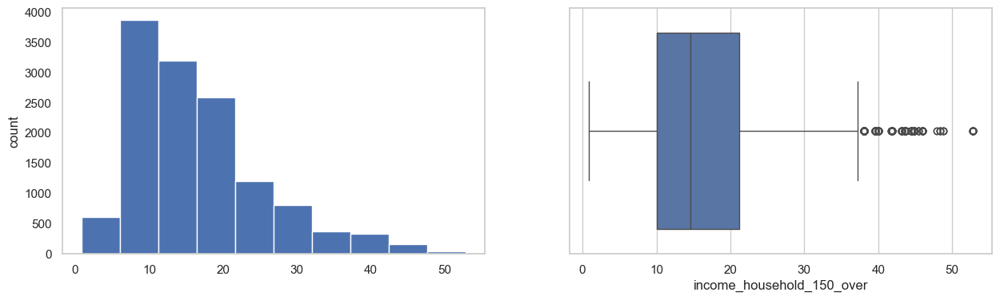

income_household_six_figure
Skew : 0.65


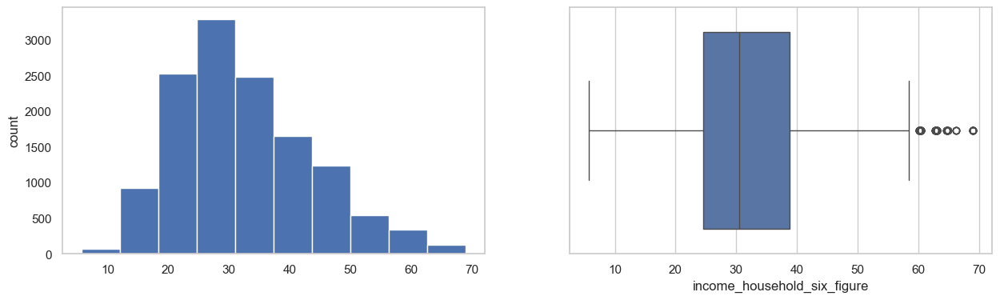

income_individual_median
Skew : 1.29


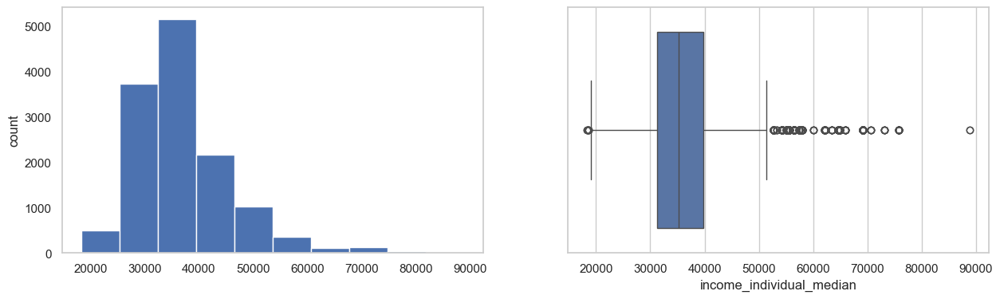

home_ownership
Skew : -0.95


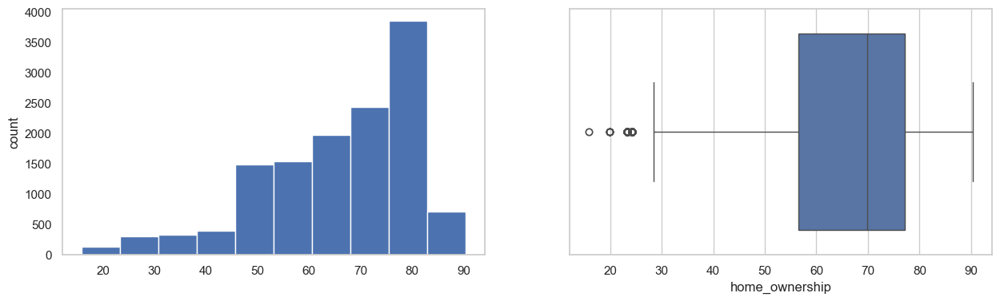

housing_units
Skew : 0.98


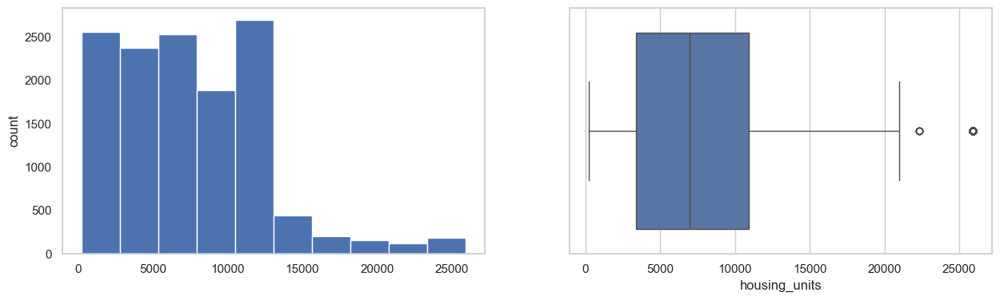

home_value
Skew : 1.66


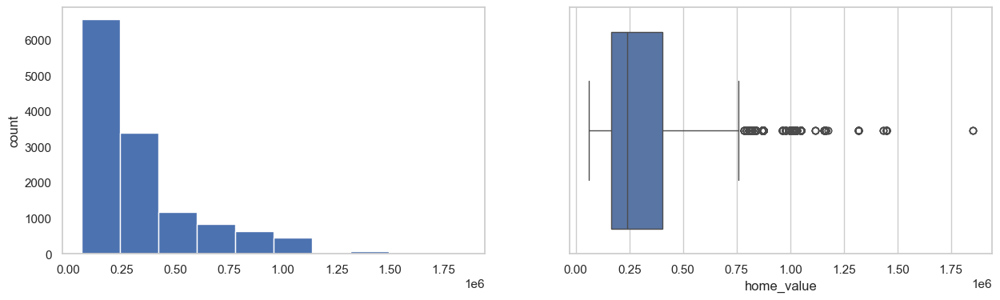

rent_median
Skew : 0.84


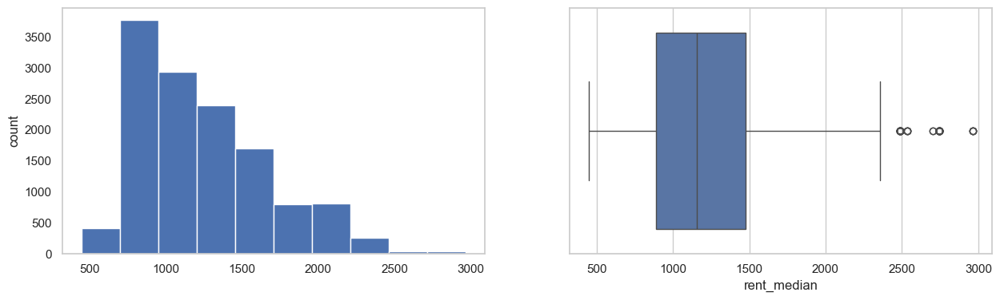

rent_burden
Skew : 1.8


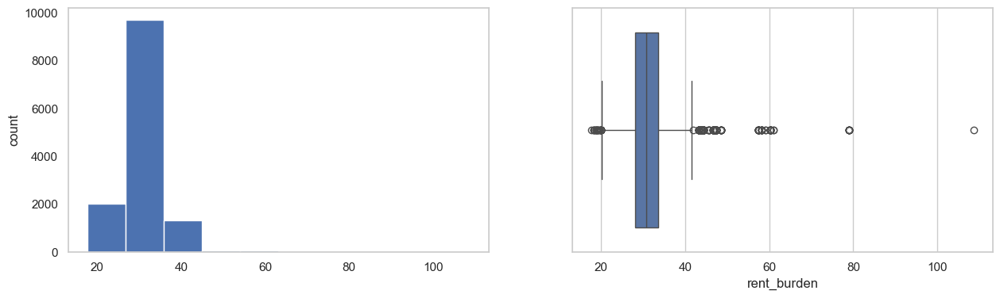

education_less_highschool
Skew : 1.2


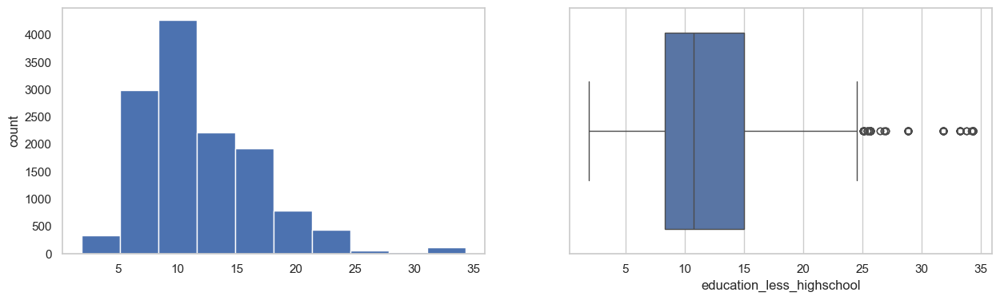

education_highschool
Skew : 0.16


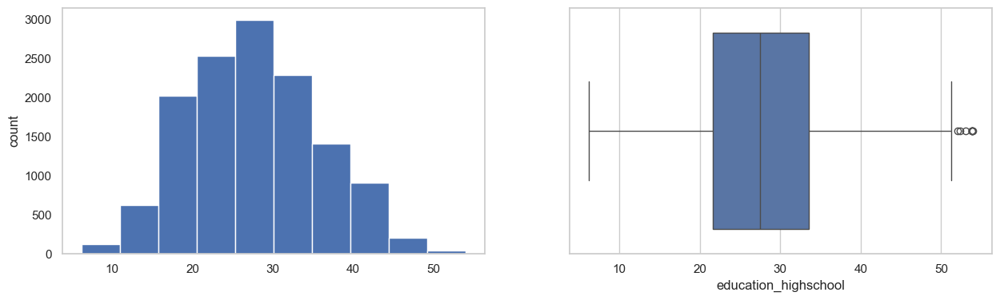

education_some_college
Skew : -0.4


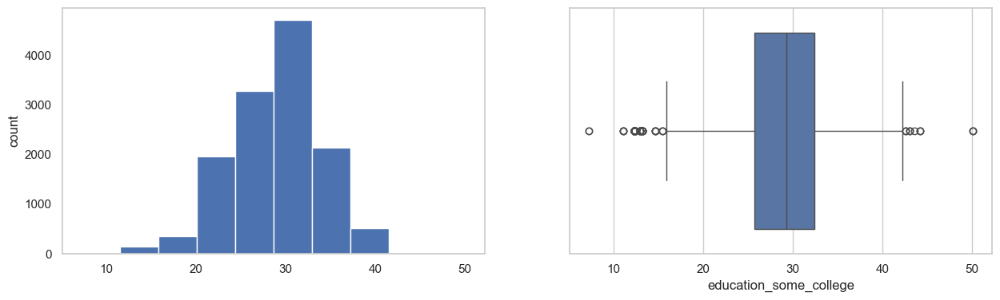

education_bachelors
Skew : 0.39


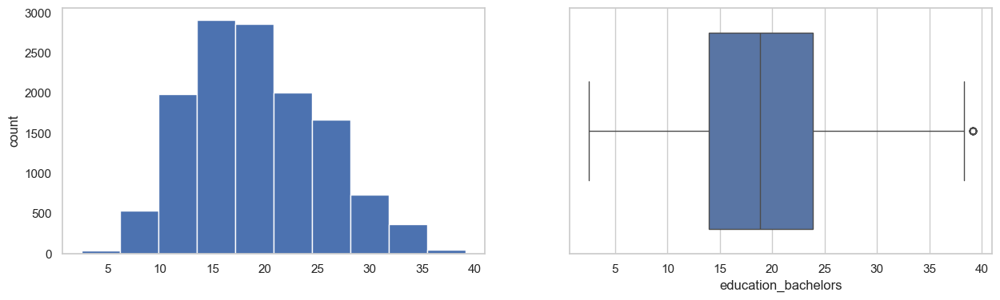

education_graduate
Skew : 1.33


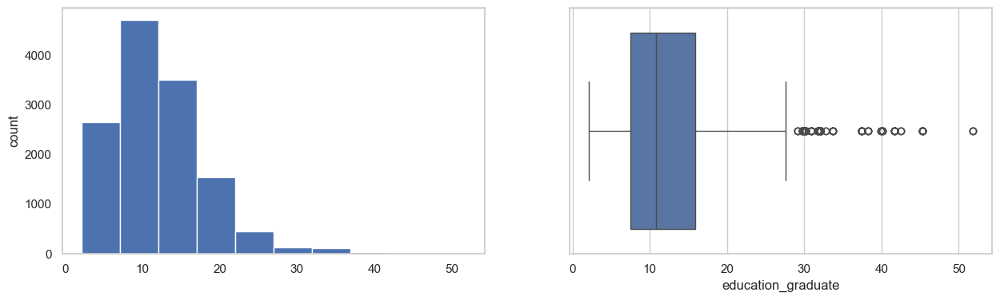

education_college_or_above
Skew : 0.7


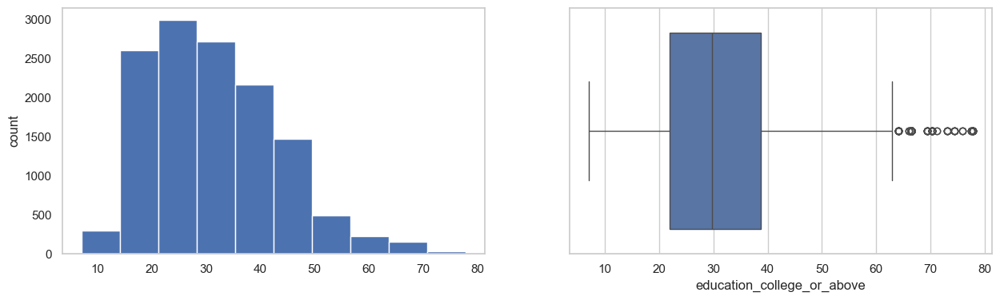

education_stem_degree
Skew : 0.7


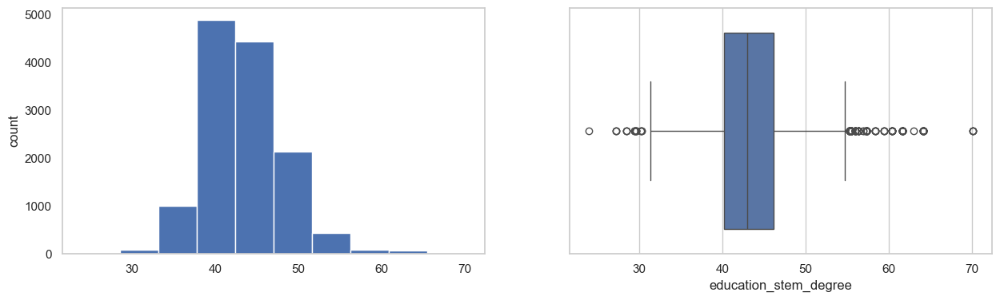

labor_force_participation
Skew : -0.65


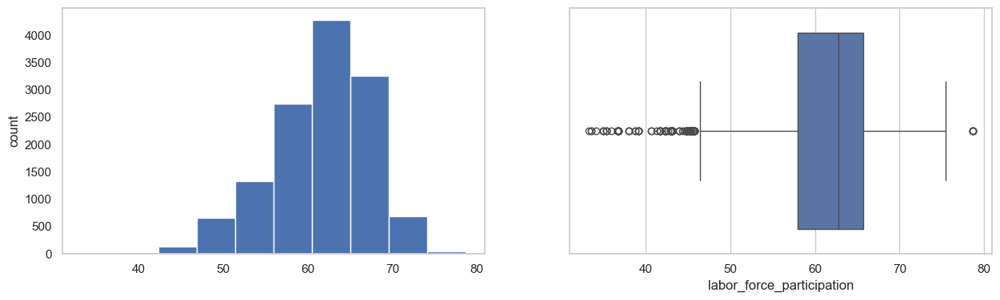

unemployment_rate
Skew : 1.15


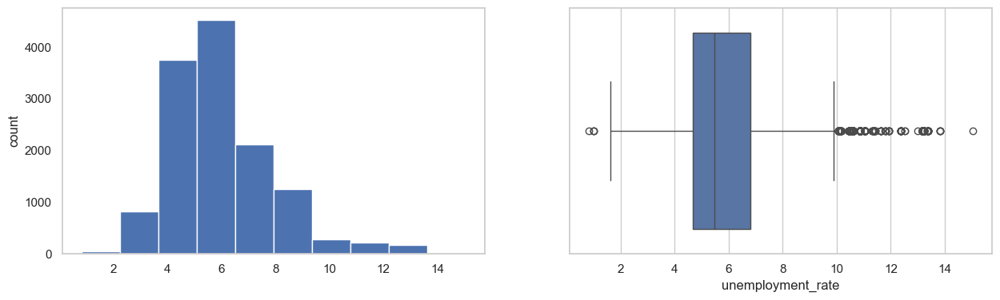

self_employed
Skew : 0.76


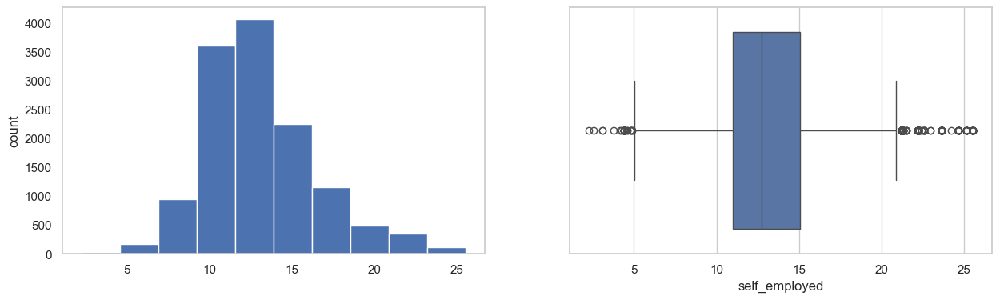

farmer
Skew : 2.68


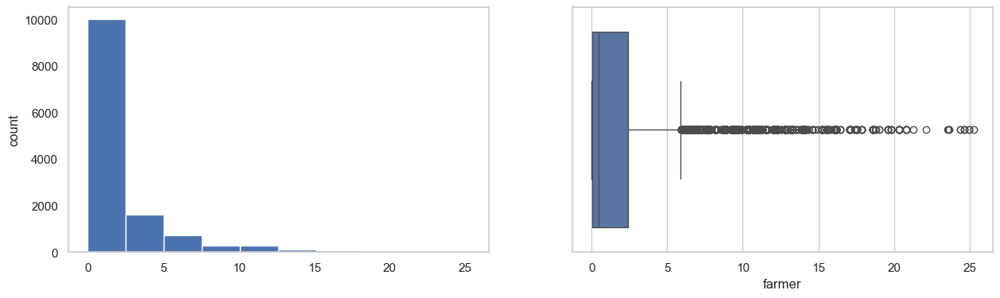

race_white
Skew : -0.41


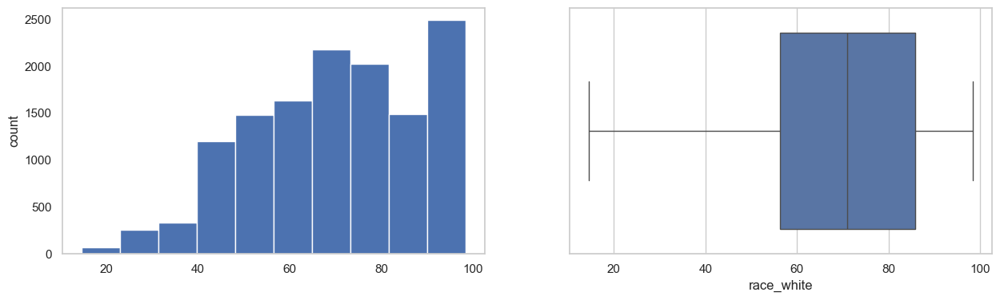

race_black
Skew : 1.59


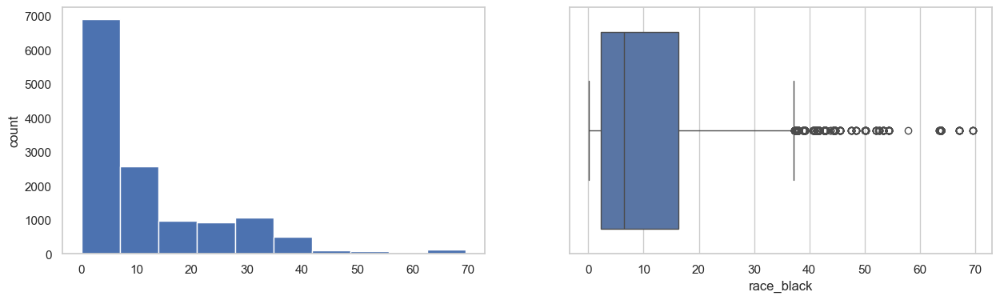

race_asian
Skew : 2.28


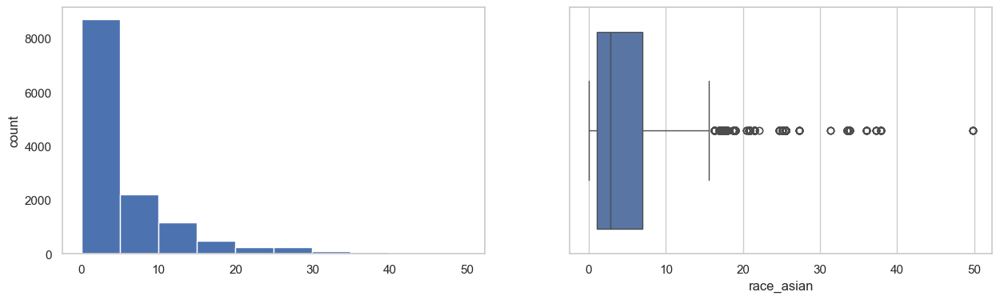

race_native
Skew : 15.79


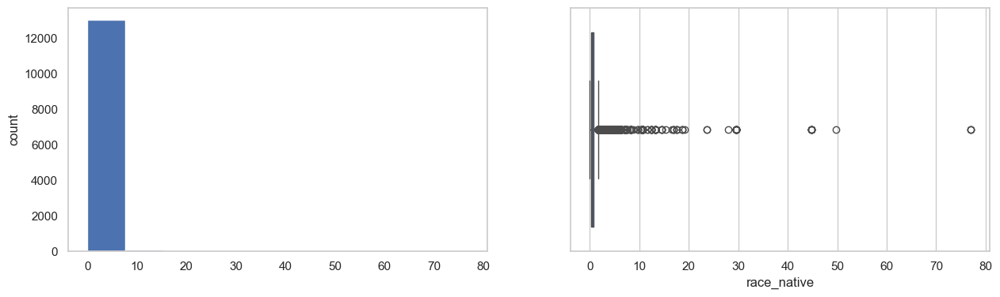

race_pacific
Skew : 23.08


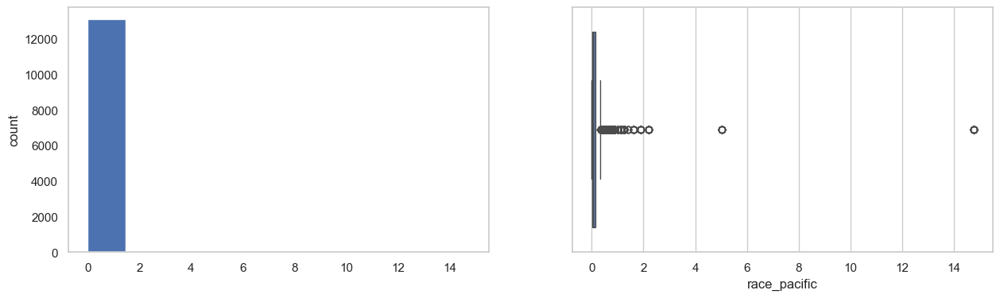

race_other
Skew : 1.91


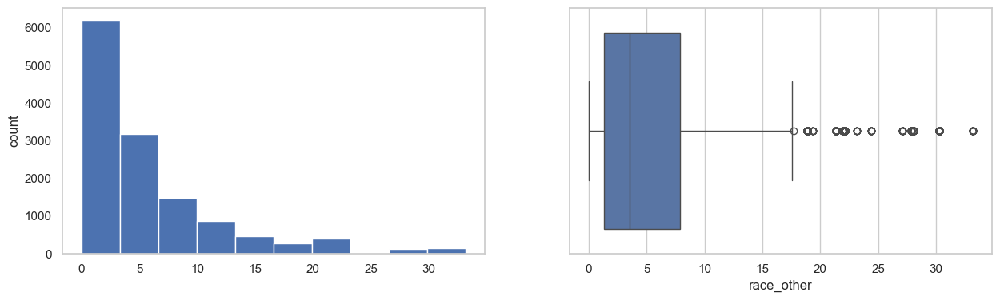

race_multiple
Skew : 1.21


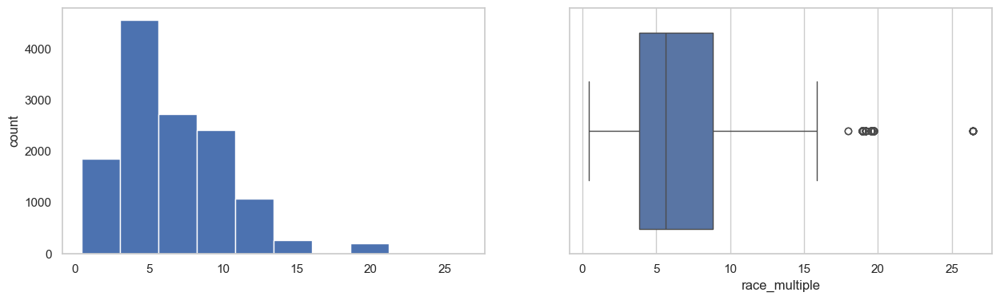

hispanic
Skew : 1.26


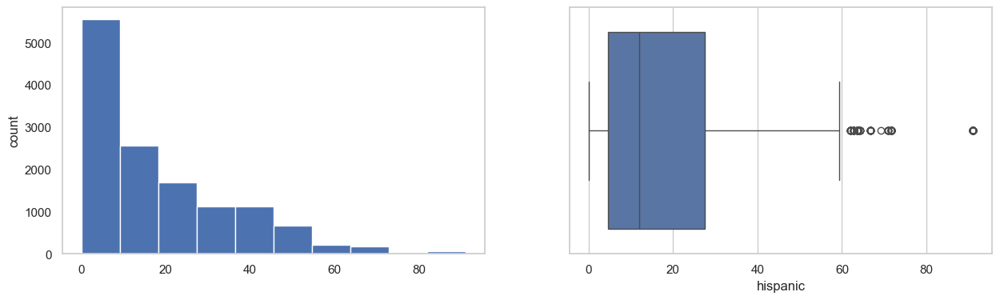

disabled
Skew : 1.01


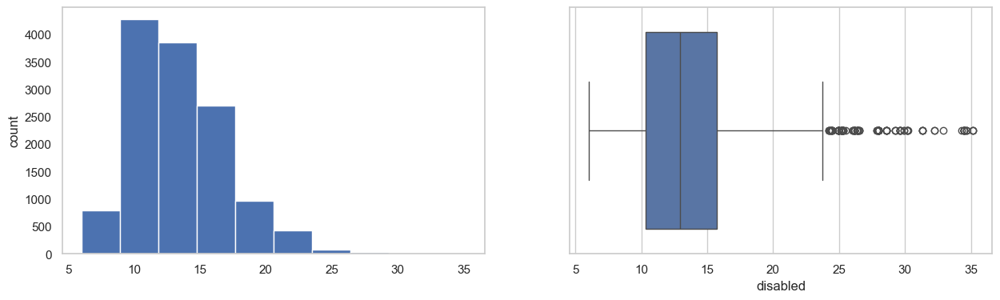

poverty
Skew : 0.93


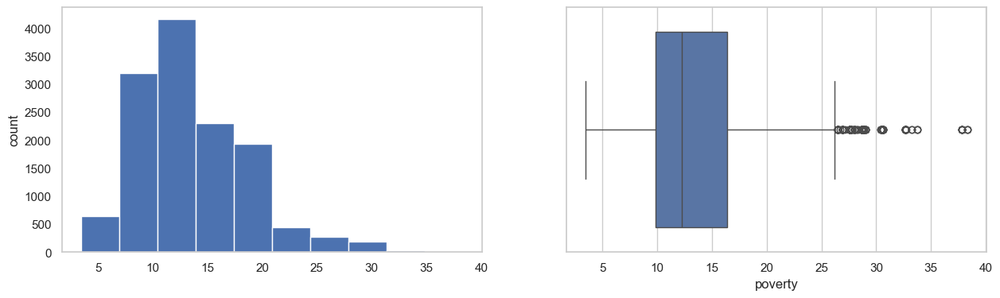

limited_english
Skew : 1.72


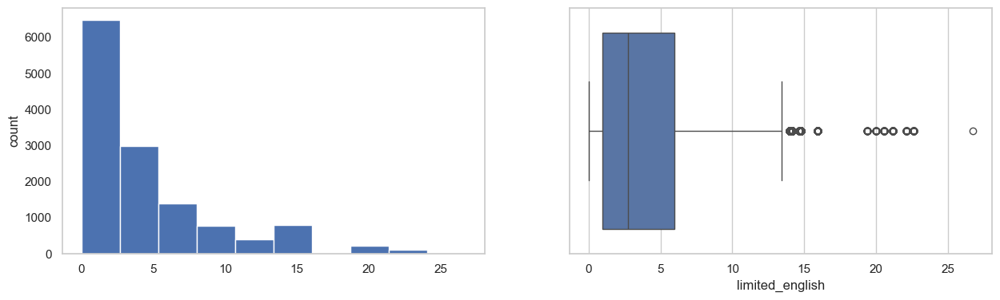

commute_time
Skew : 0.88


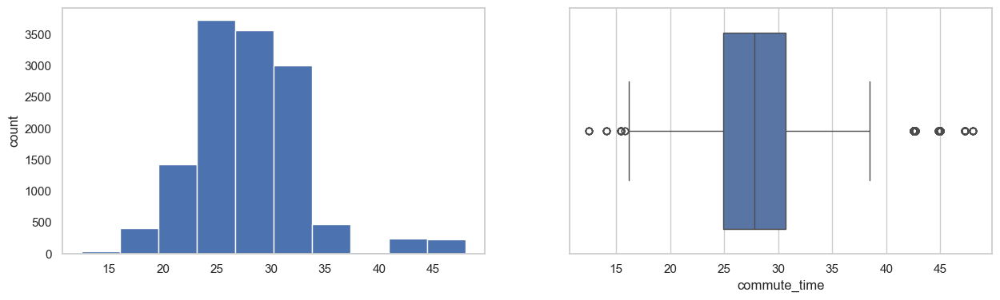

health_uninsured
Skew : 1.43


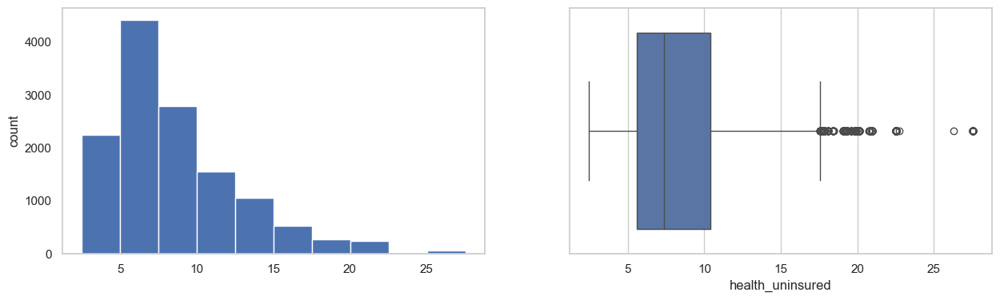

veteran
Skew : 1.06


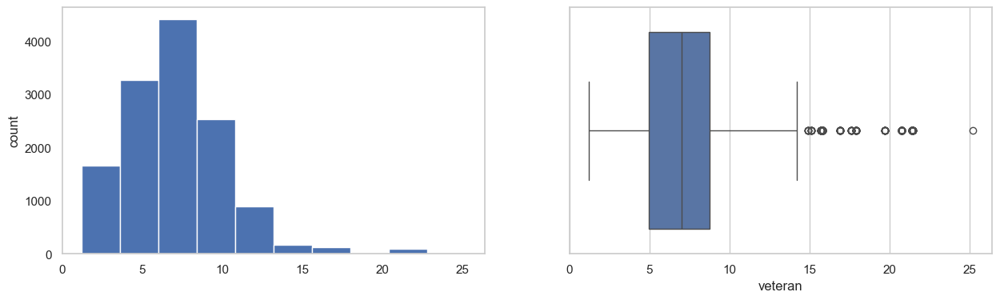

Average of Jan-13
Skew : 0.33


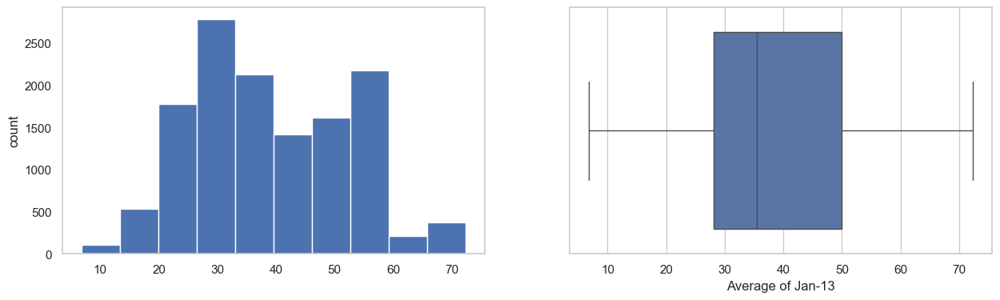

Average of Feb-13
Skew : 0.27


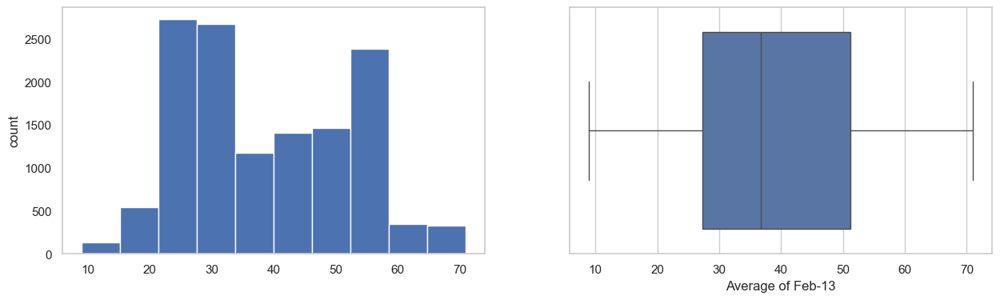

Average of Mar-13
Skew : 0.21


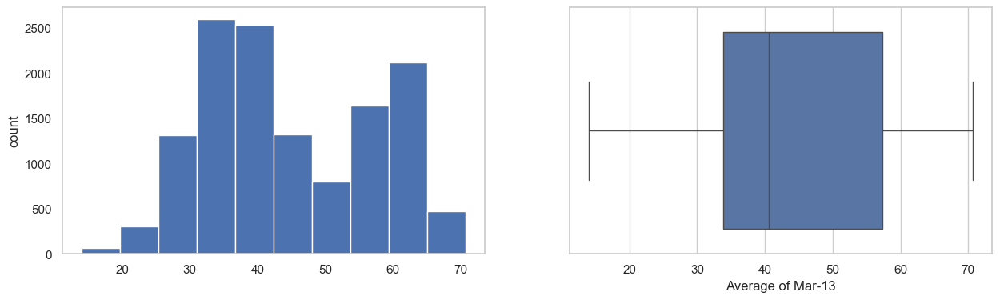

Average of Apr-13
Skew : 0.09


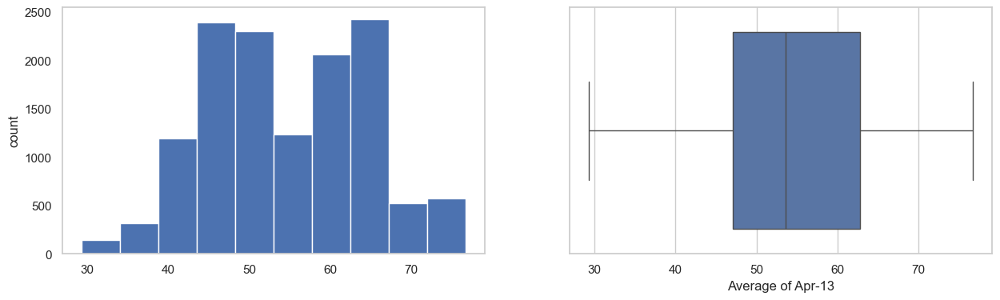

Average of May-13
Skew : 0.35


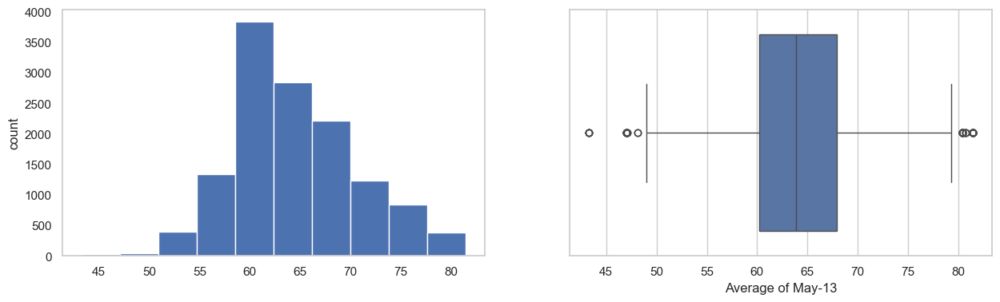

Average of Jun-13
Skew : 0.59


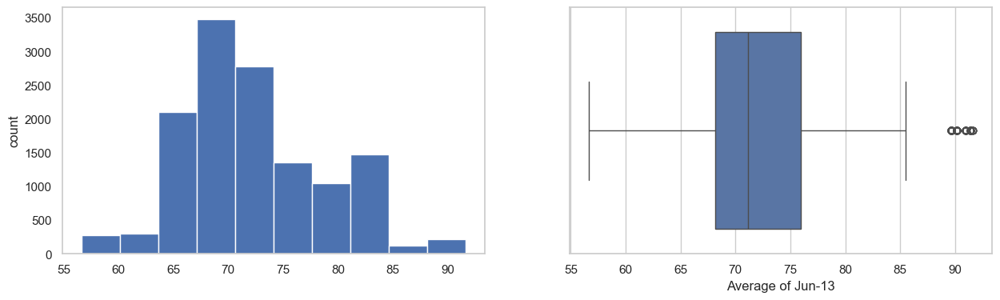

Average of Jul-13
Skew : 0.82


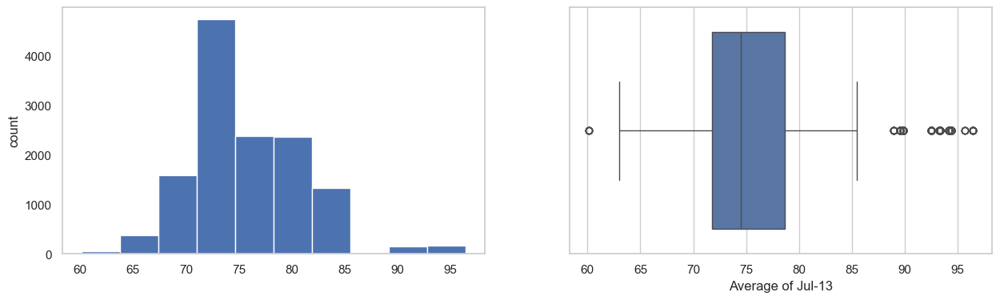

Average of Aug-13
Skew : 0.87


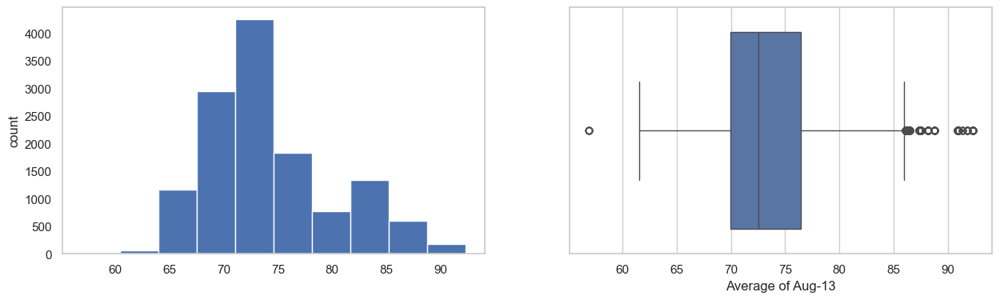

Average of Sep-13
Skew : 0.43


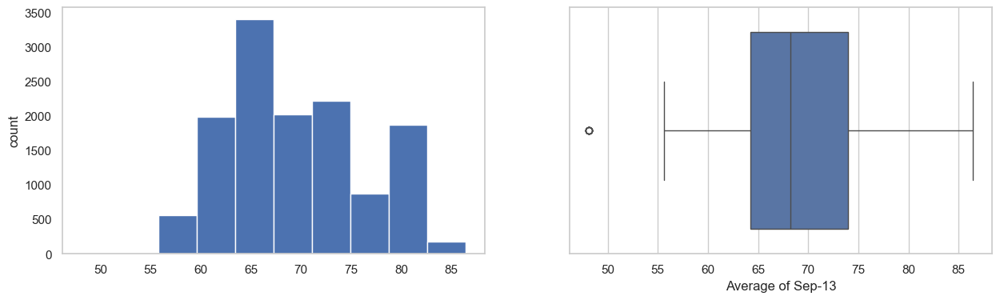

Average of Oct-13
Skew : 0.37


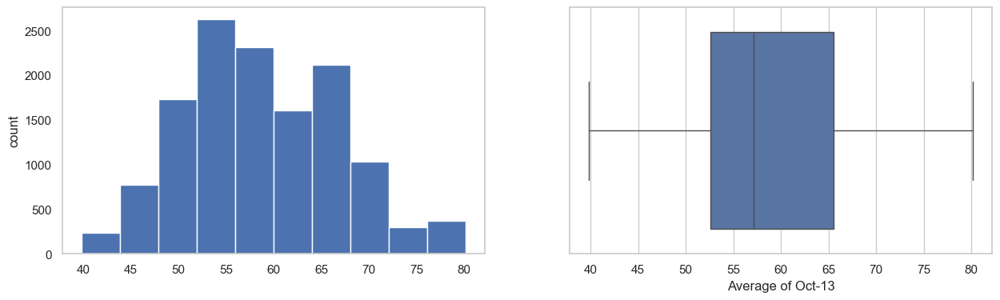

Average of Nov-13
Skew : 0.63


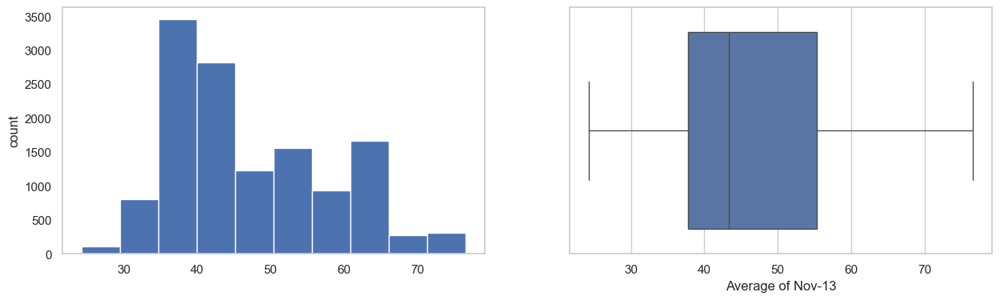

Average of Dec-13
Skew : 0.25


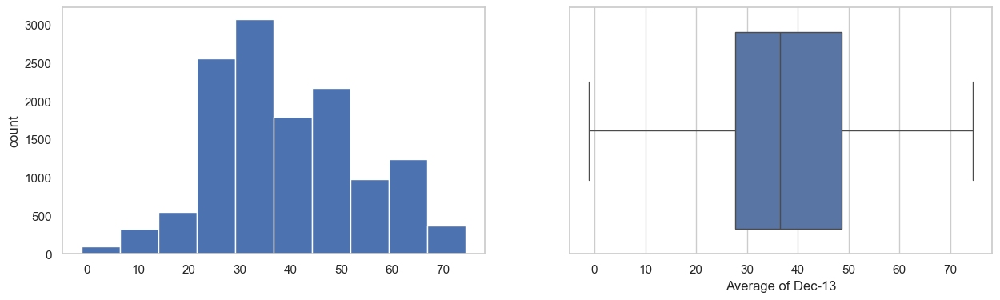

Average of Jan-14
Skew : 0.31


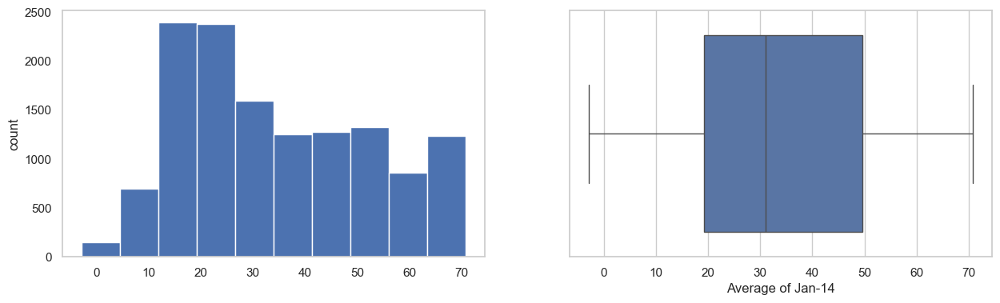

Average of Feb-14
Skew : 0.13


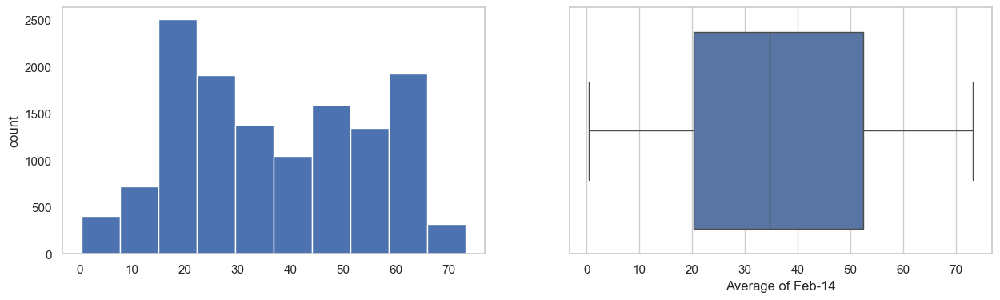

Average of Mar-14
Skew : 0.13


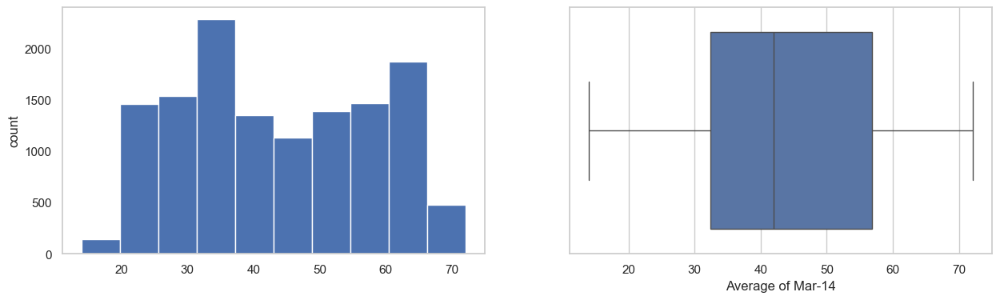

Average of Apr-14
Skew : 0.14


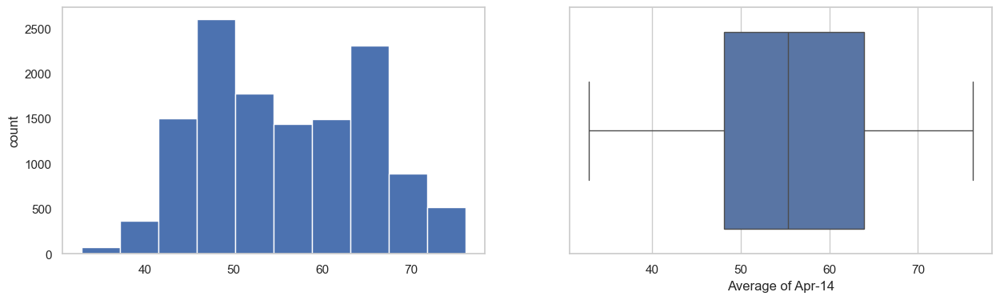

Average of May-14
Skew : 0.2


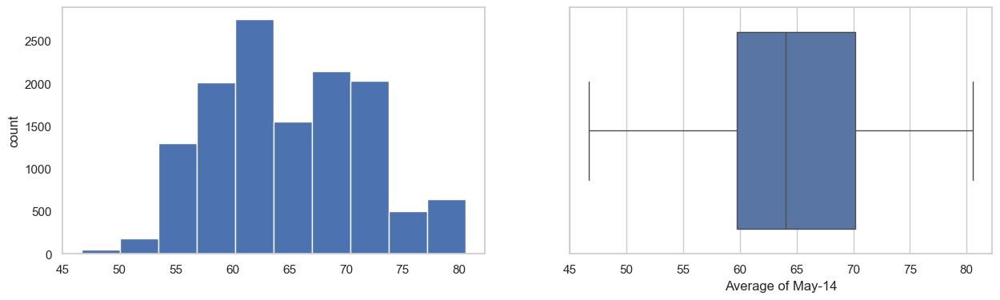

Average of Jun-14
Skew : 0.26


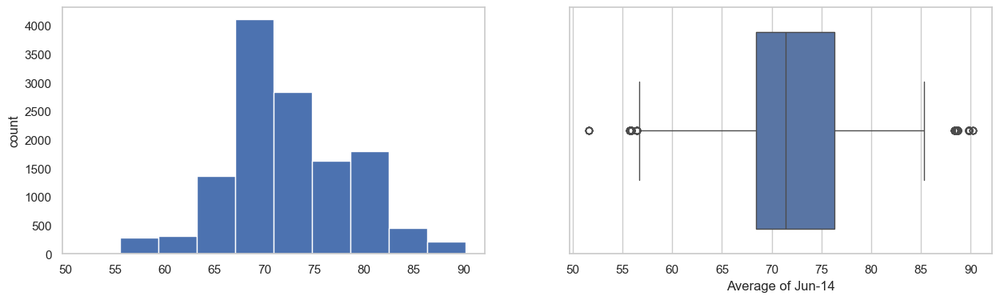

Average of Jul-14
Skew : 0.73


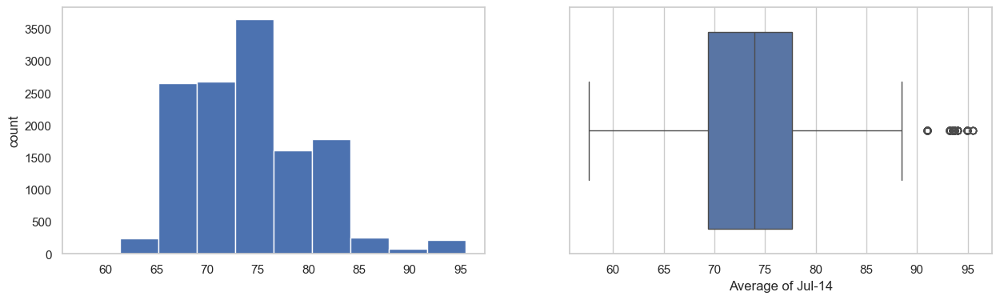

Average of Aug-14
Skew : 0.53


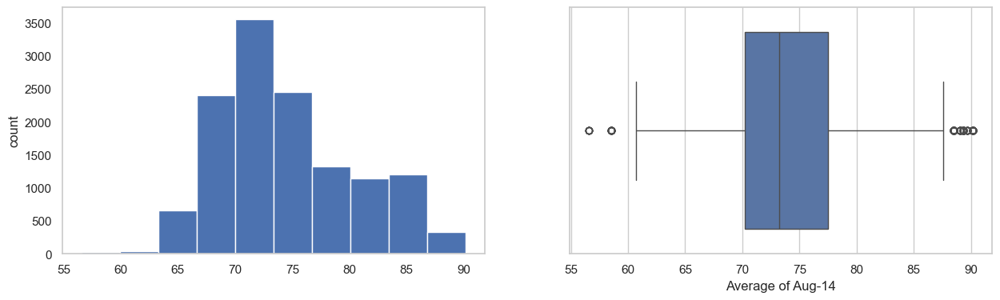

Average of Sep-14
Skew : 0.28


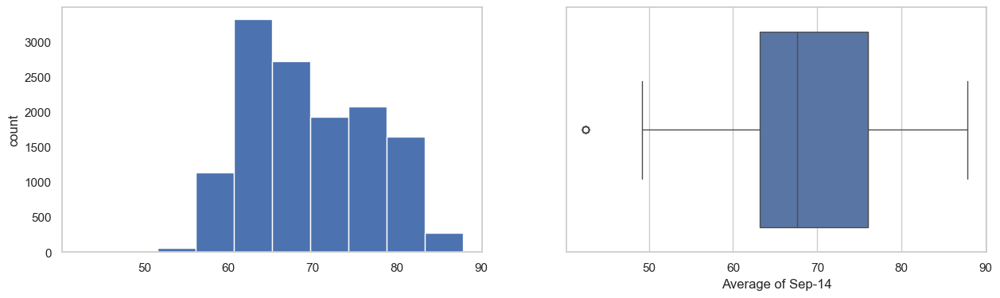

Average of Oct-14
Skew : 0.29


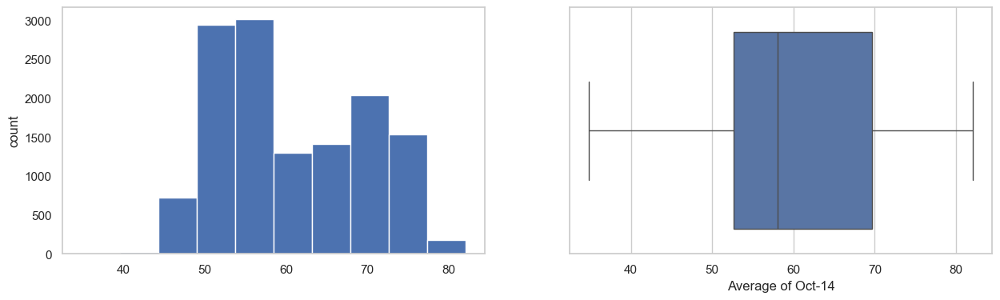

Average of Nov-14
Skew : 0.43


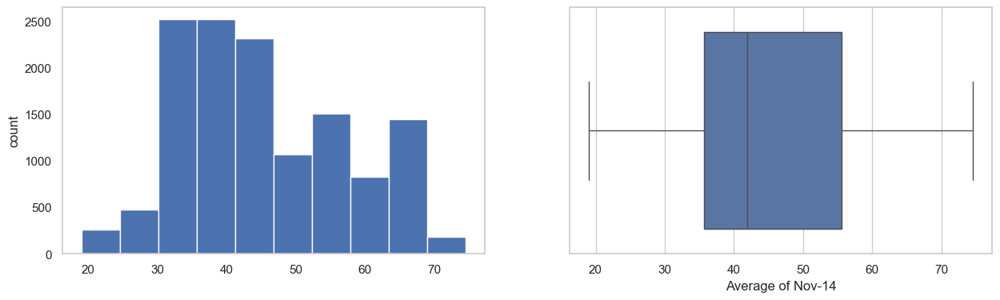

Average of Dec-14
Skew : 0.37


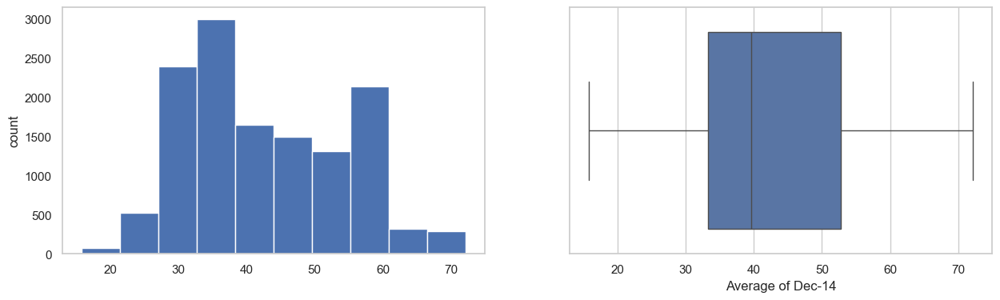

Average of Jan-15
Skew : 0.41


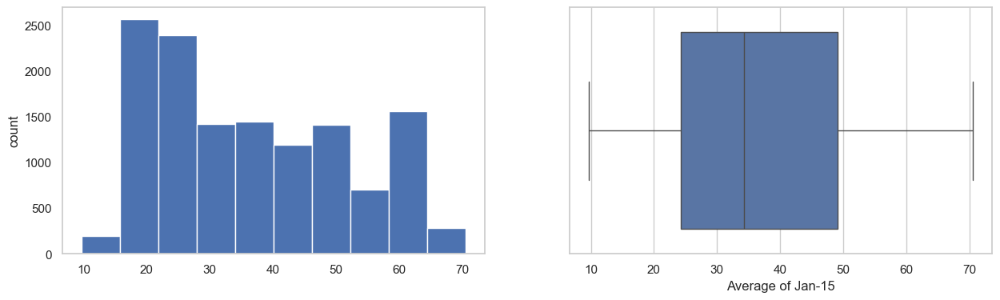

Average of Feb-15
Skew : 0.2


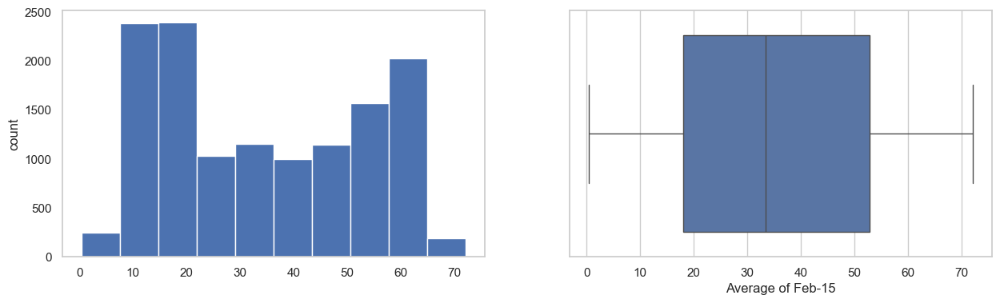

Average of Mar-15
Skew : 0.25


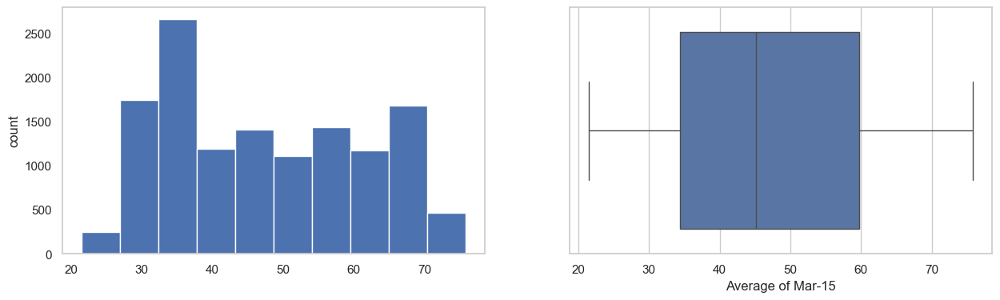

Average of Apr-15
Skew : 0.45


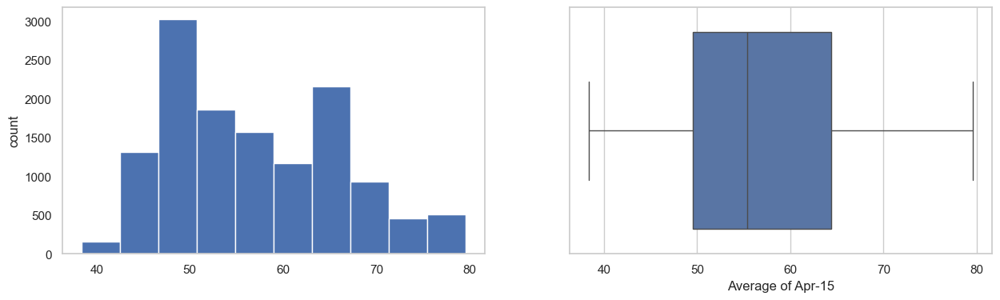

Average of May-15
Skew : 0.17


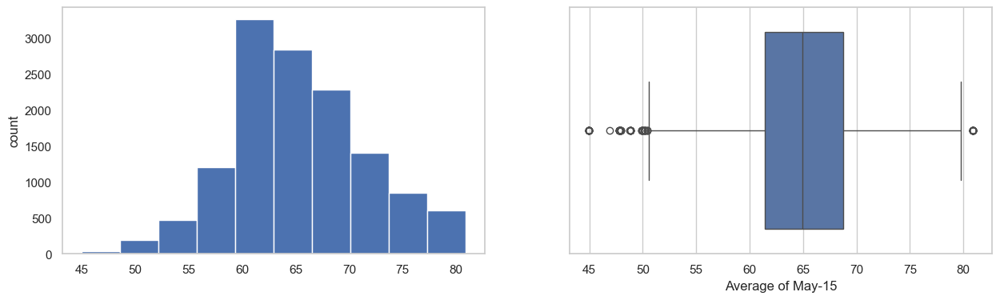

Average of Jun-15
Skew : 0.51


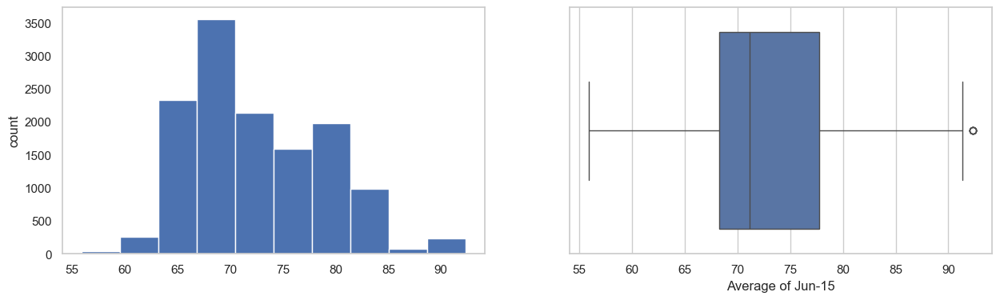

Average of Jul-15
Skew : 0.53


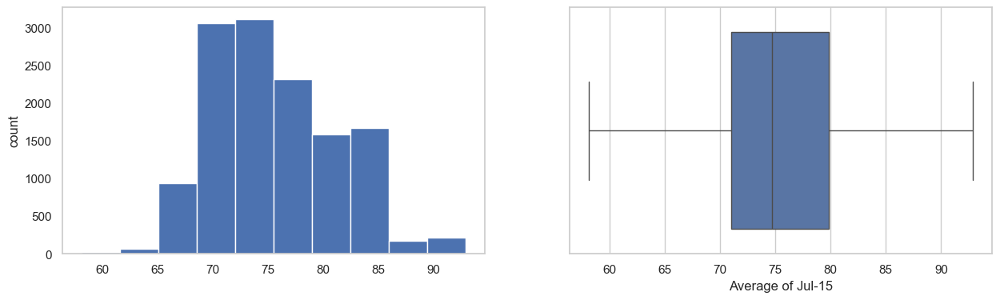

Average of Aug-15
Skew : 0.65


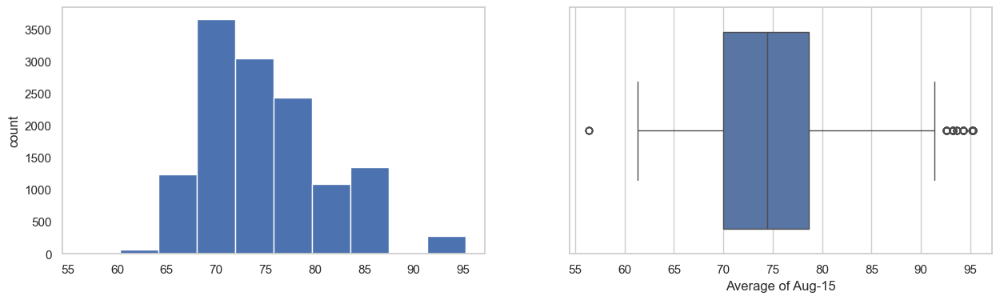

Average of Sep-15
Skew : 0.46


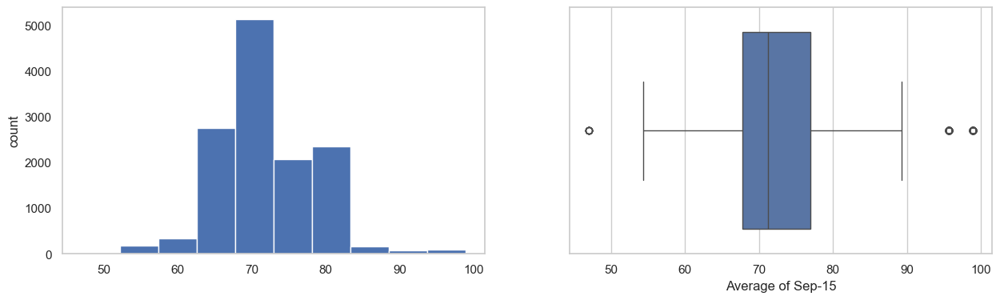

Average of Oct-15
Skew : 0.45


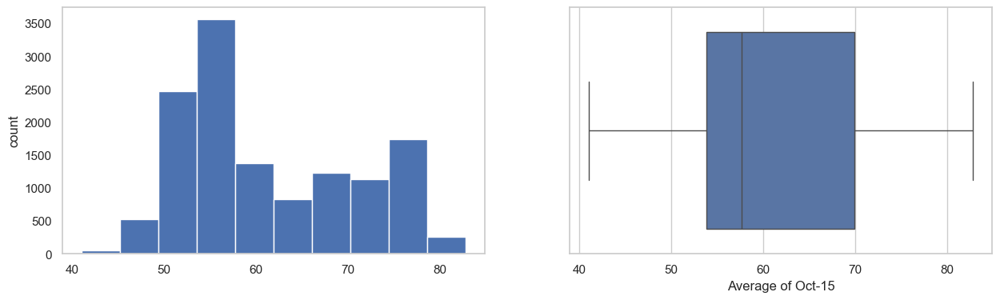

Average of Nov-15
Skew : 0.66


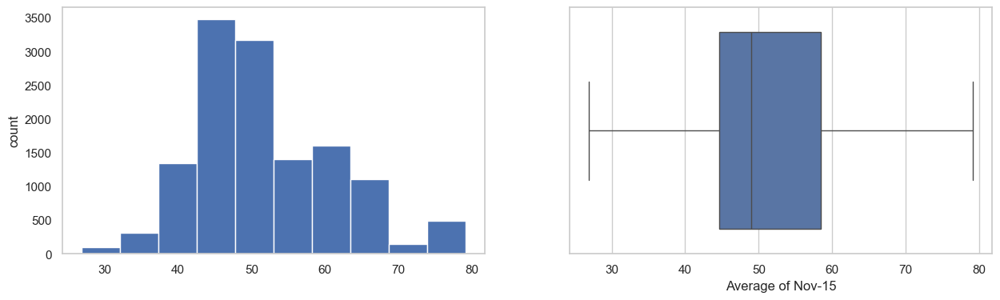

Average of Dec-15
Skew : 0.4


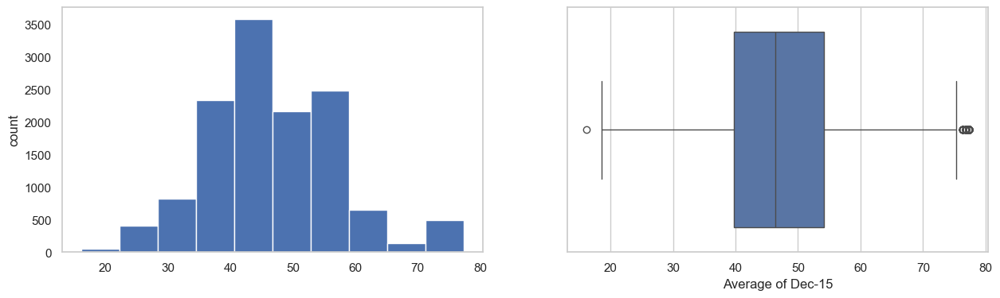

Average of Jan-16
Skew : 0.36


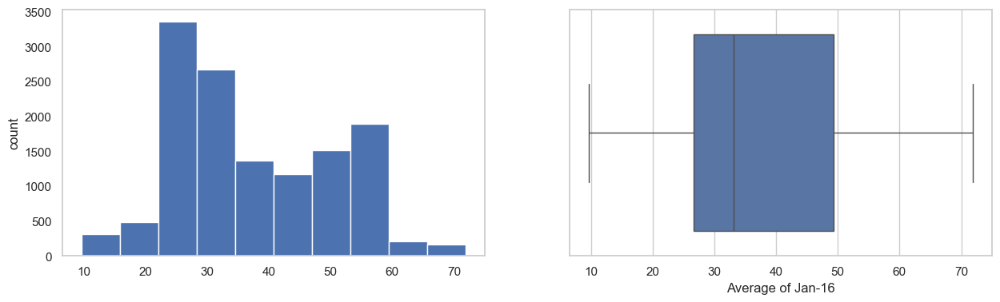

Average of Feb-16
Skew : 0.33


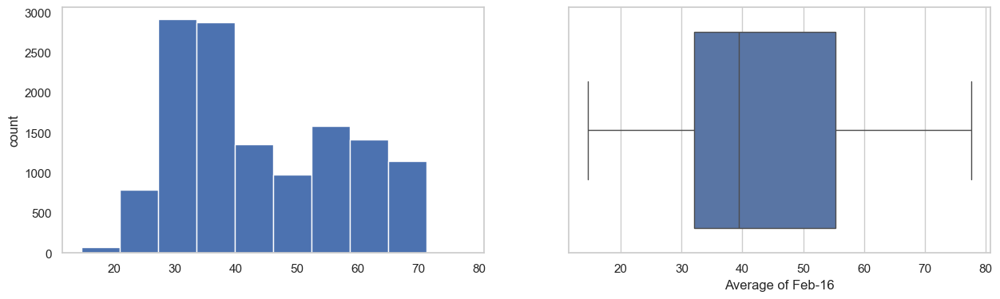

Average of Mar-16
Skew : 0.25


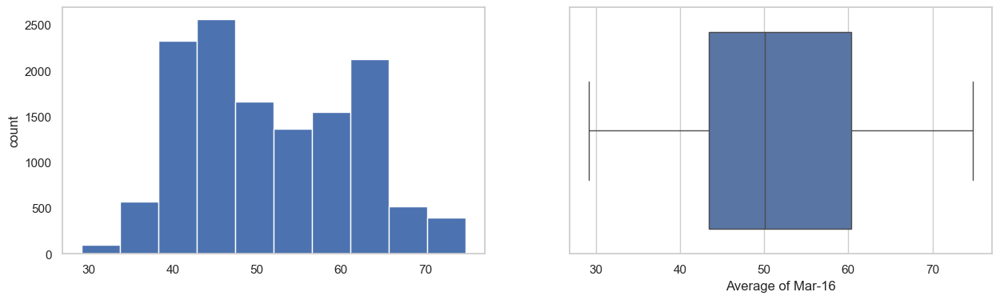

Average of Apr-16
Skew : 0.15


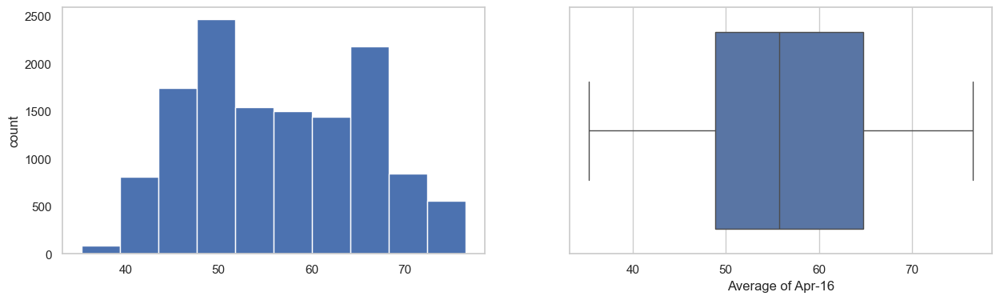

Average of May-16
Skew : 0.7


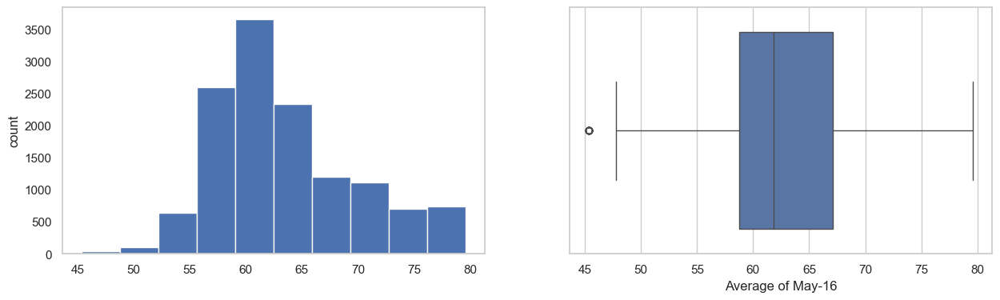

Average of Jun-16
Skew : 0.41


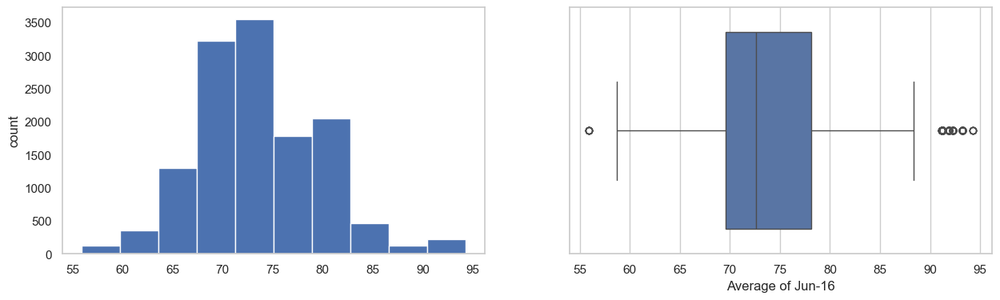

Average of Jul-16
Skew : 0.35


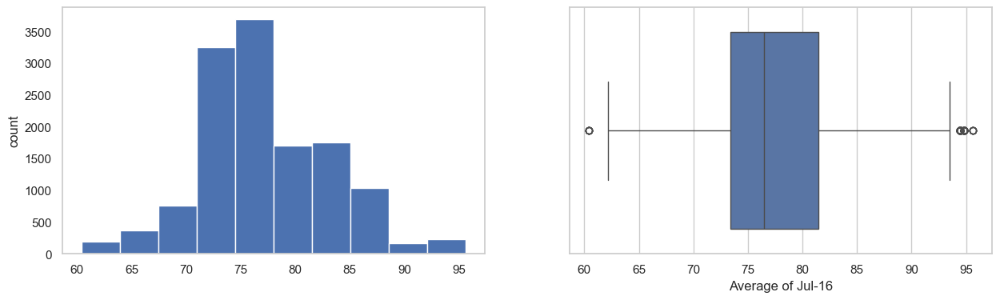

Average of Aug-16
Skew : 0.05


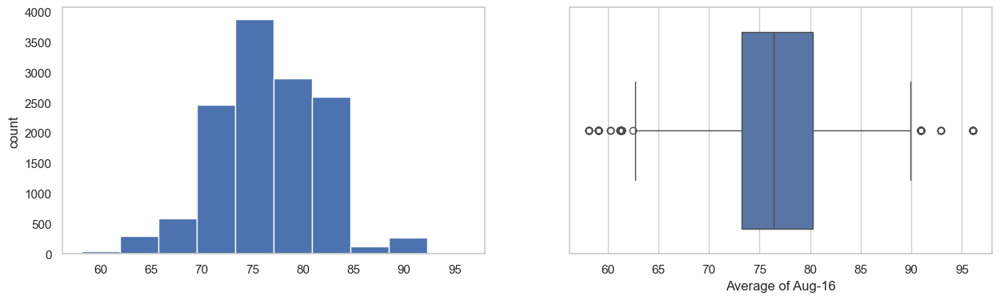

Average of Sep-16
Skew : 0.0


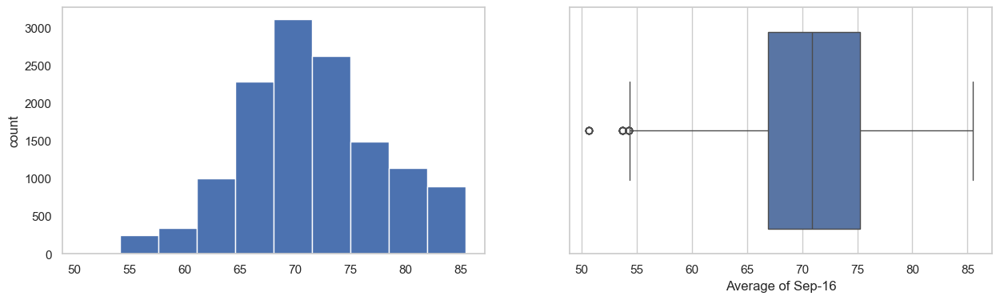

Average of Oct-16
Skew : 0.29


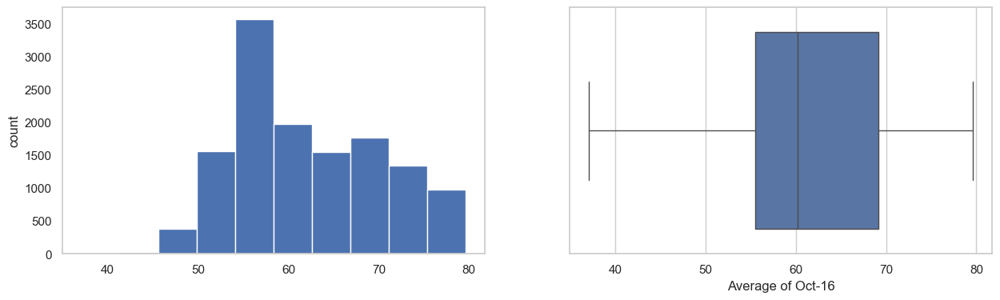

Average of Nov-16
Skew : 0.56


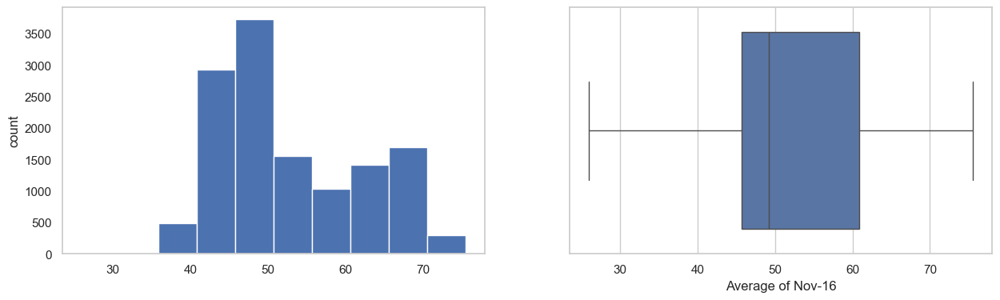

Average of Dec-16
Skew : 0.43


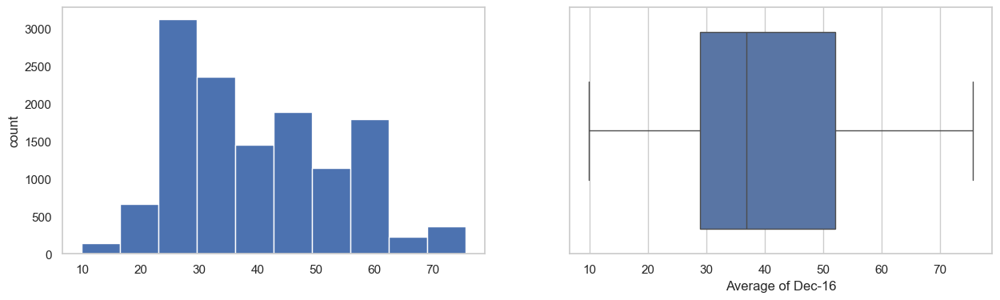

Average of Jan-17
Skew : 0.19


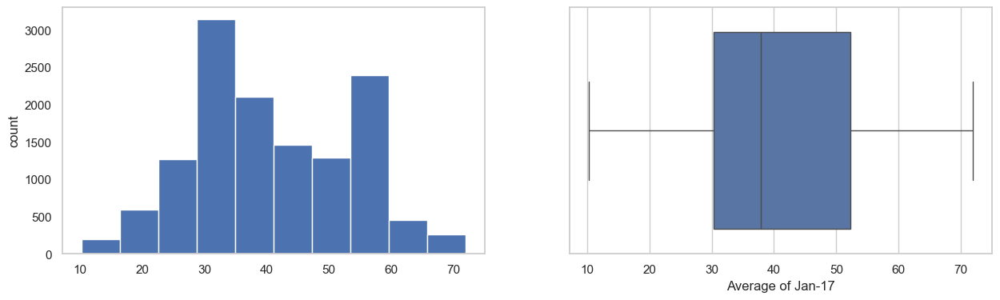

Average of Feb-17
Skew : 0.23


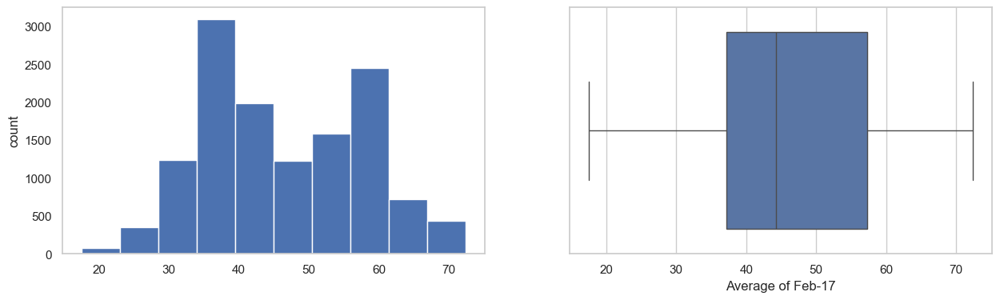

Average of Mar-17
Skew : 0.14


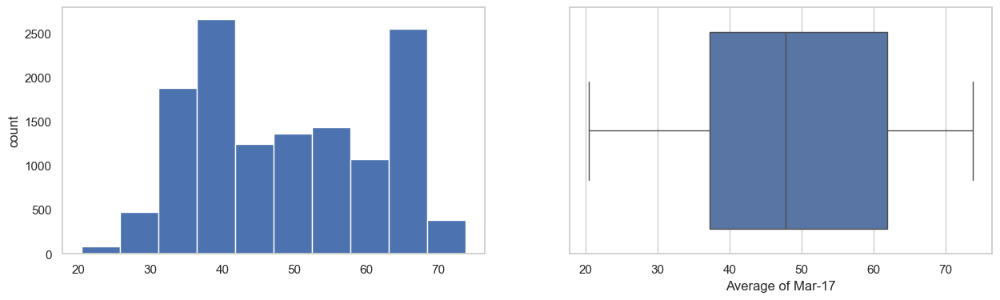

Average of Apr-17
Skew : 0.13


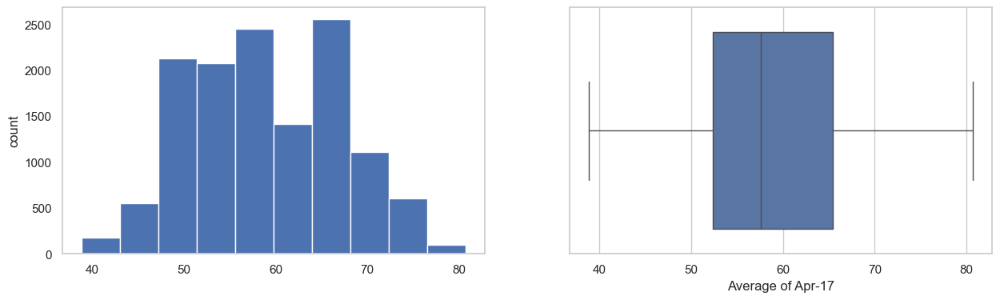

Average of May-17
Skew : 0.5


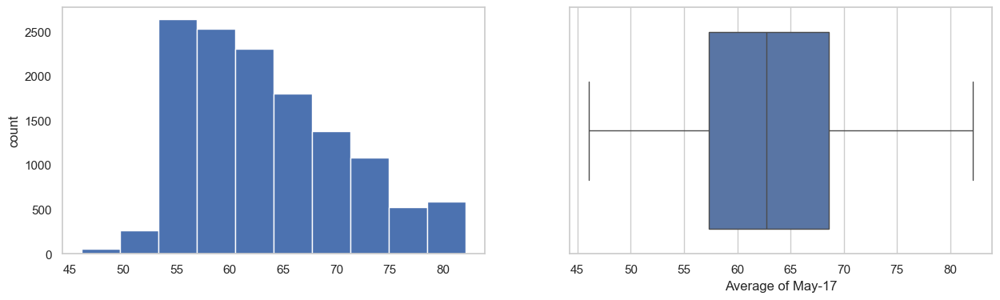

Average of Jun-17
Skew : 0.66


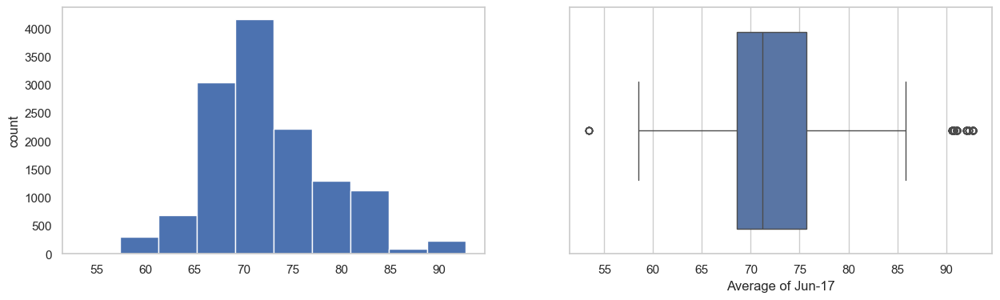

Average of Jul-17
Skew : 0.99


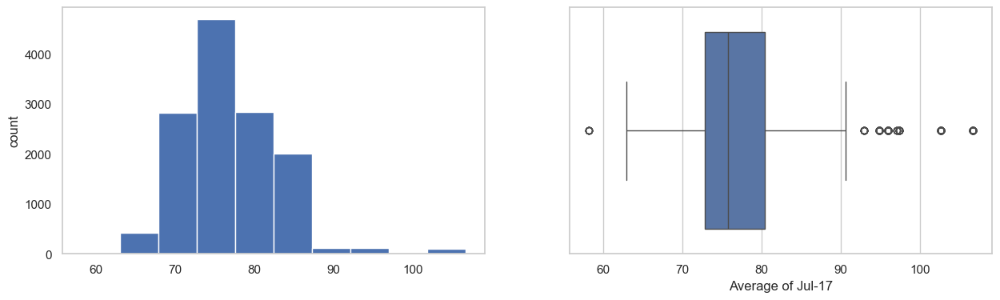

Average of Aug-17
Skew : 0.67


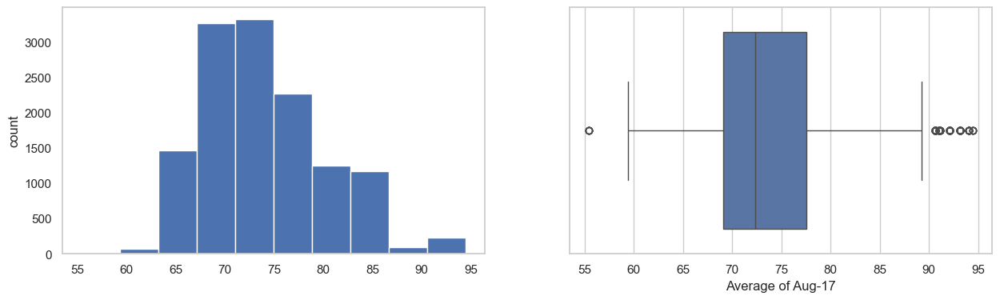

Average of Sep-17
Skew : 0.34


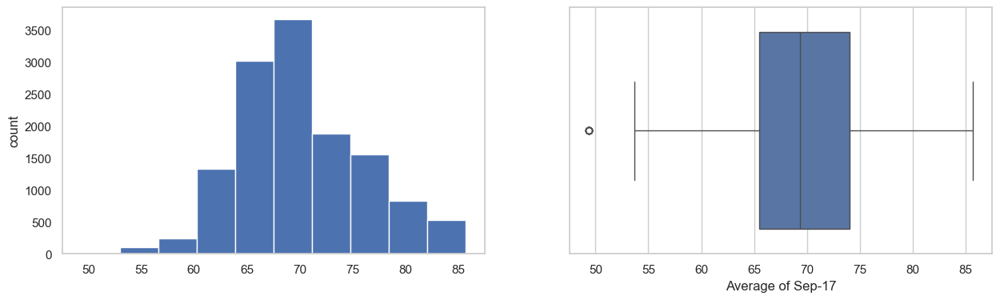

Average of Oct-17
Skew : 0.2


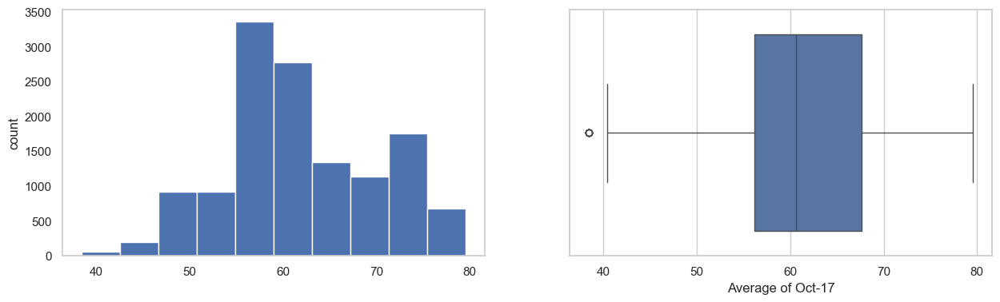

Average of Nov-17
Skew : 0.38


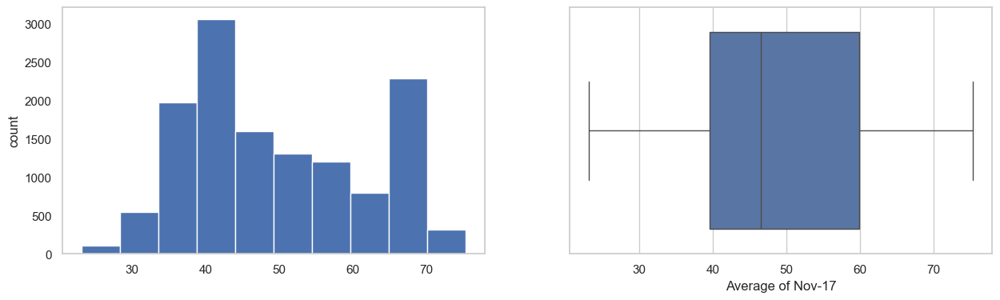

Average of Dec-17
Skew : 0.45


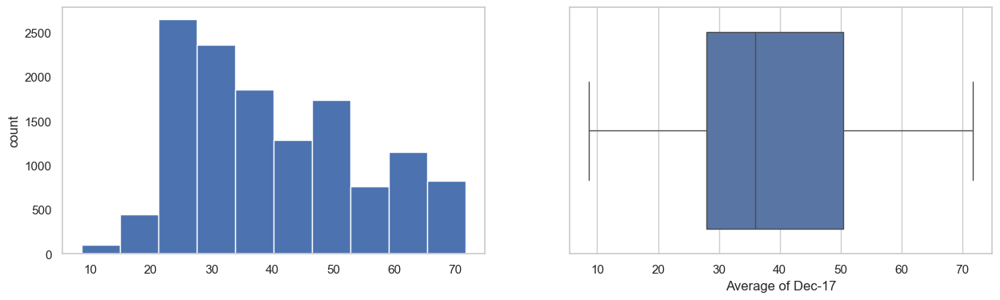

Average of Jan-18
Skew : 0.48


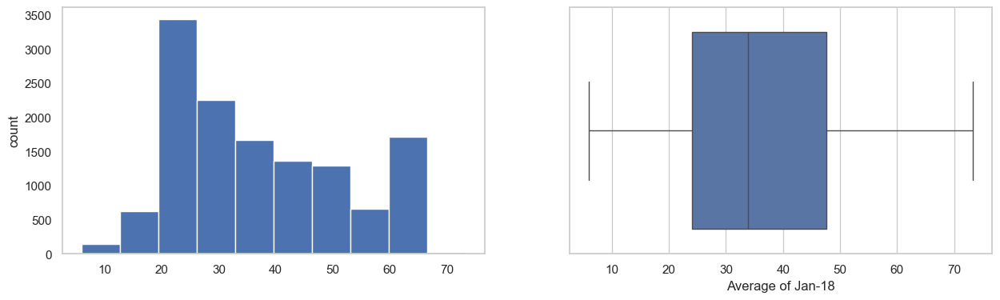

Average of Feb-18
Skew : -0.01


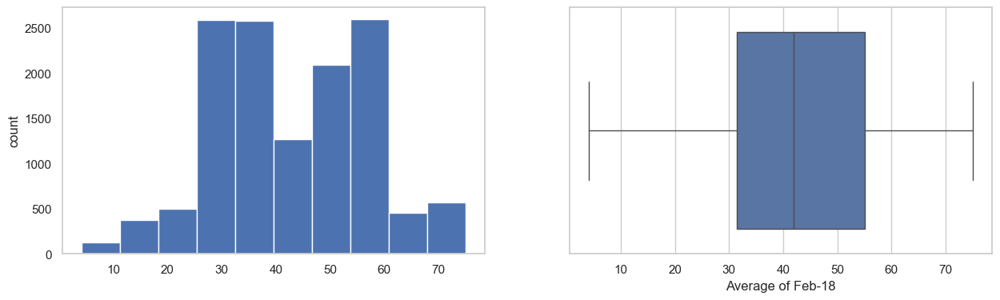

Average of Mar-18
Skew : 0.31


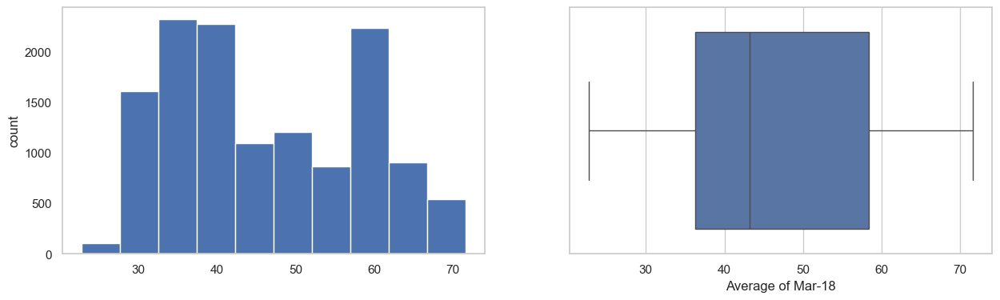

Average of Apr-18
Skew : 0.2


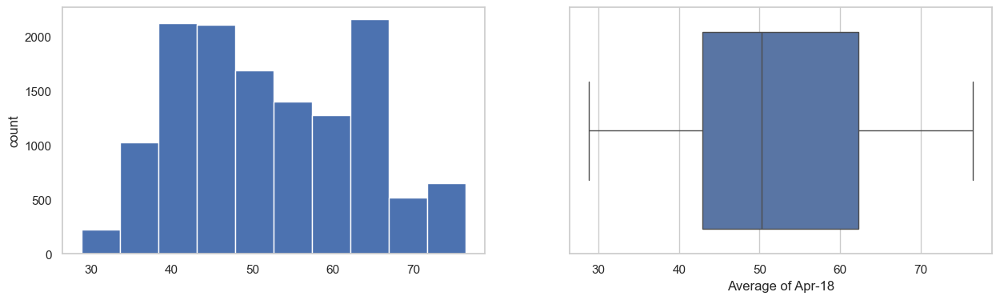

Average of May-18
Skew : 0.37


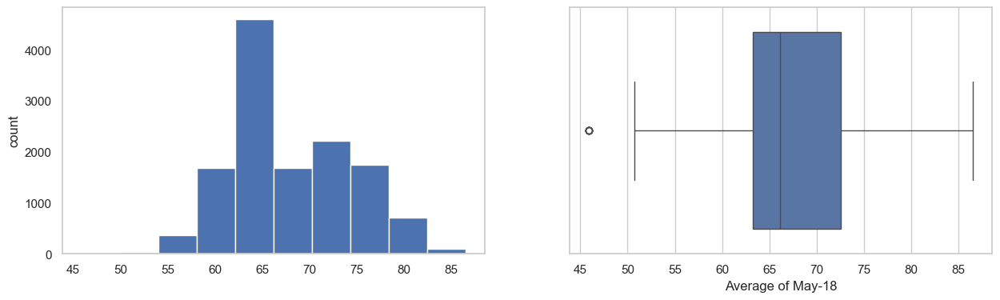

Average of Jun-18
Skew : 0.31


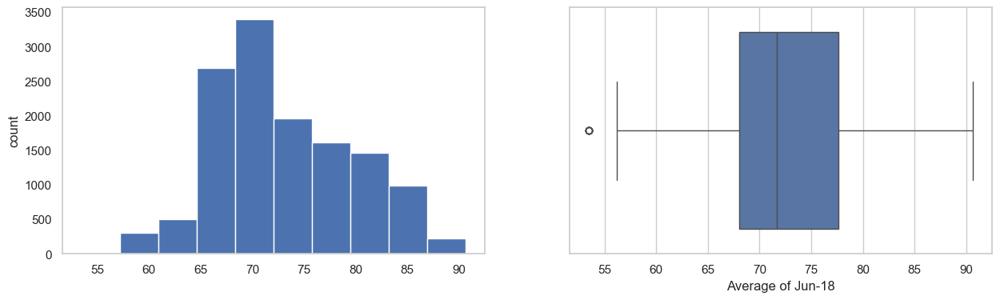

Average of Jul-18
Skew : 0.64


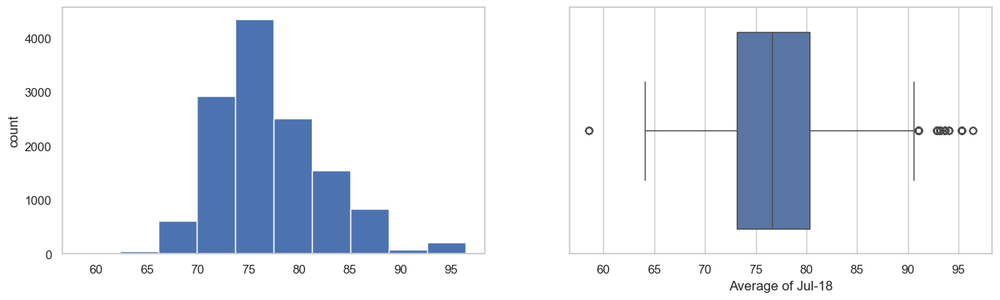

Average of Aug-18
Skew : 0.38


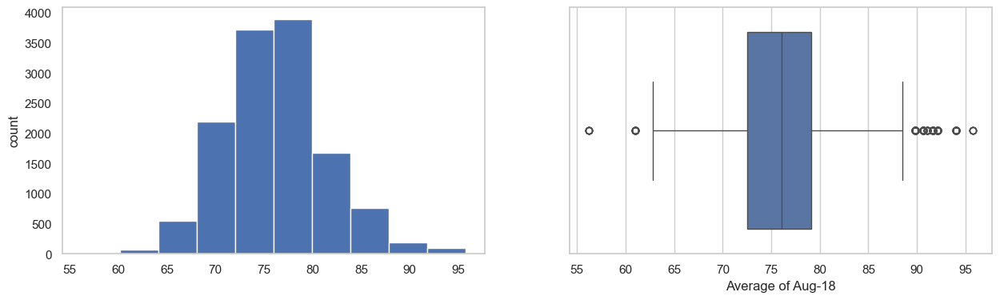

Average of Sep-18
Skew : 0.18


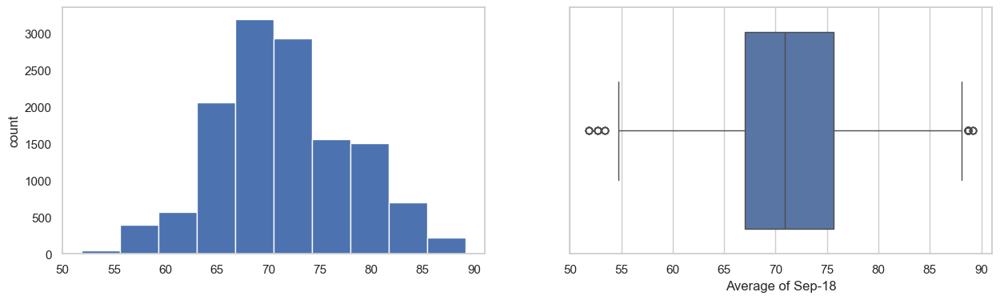

Average of Oct-18
Skew : 0.23


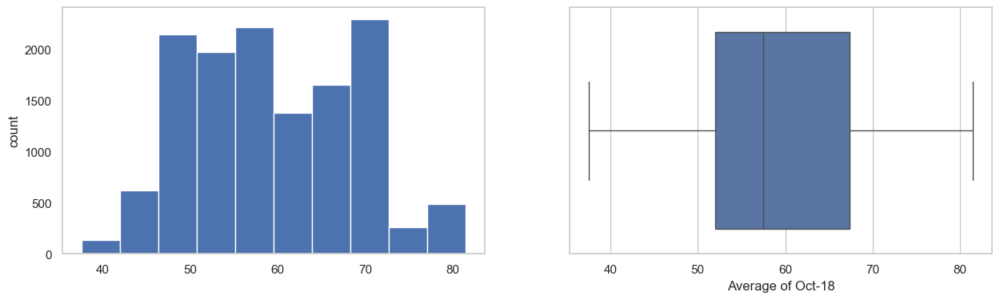

Average of Nov-18
Skew : 0.48


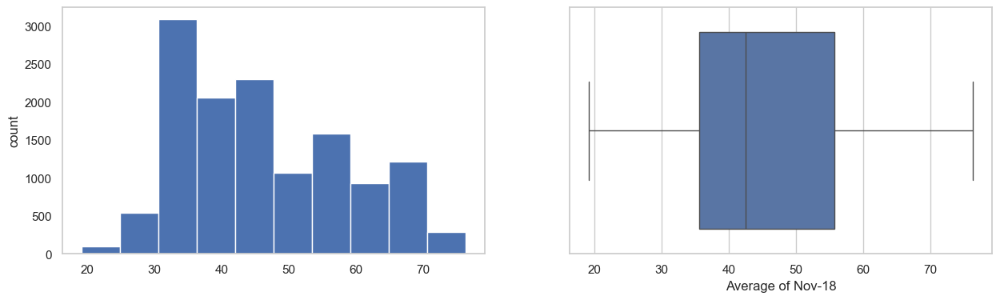

Average of Dec-18
Skew : 0.48


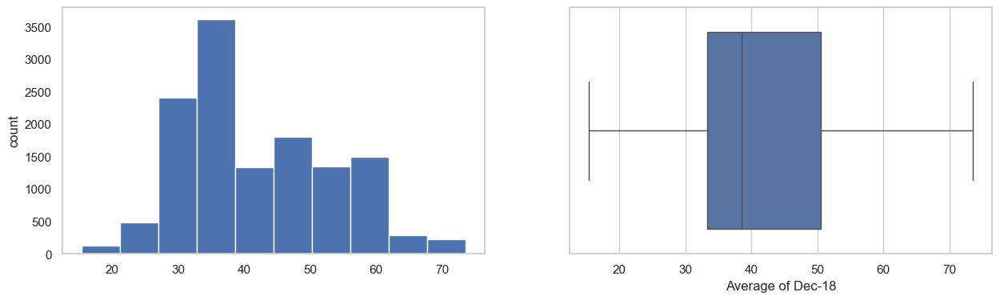

metastatic_diagnosis_period
Skew : 0.92


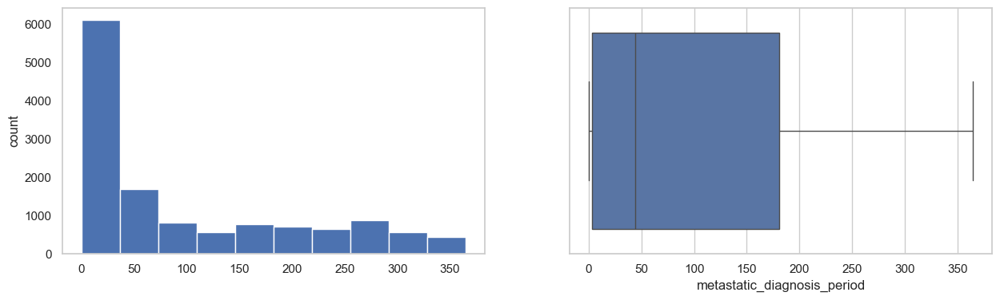

In [44]:
# Histogram and box plot of numerical data for df_train

for col in num_cols:
    print(col)
    print('Skew :', round(df_train[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_train[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_train[col])
    plt.show()

patient_zip3
Skew : -0.1


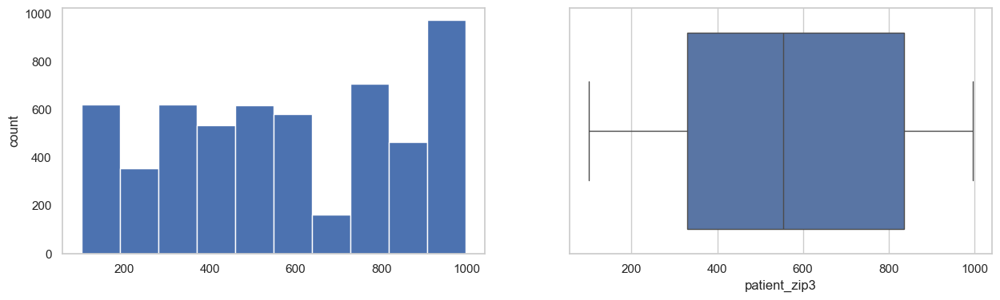

patient_age
Skew : 0.15


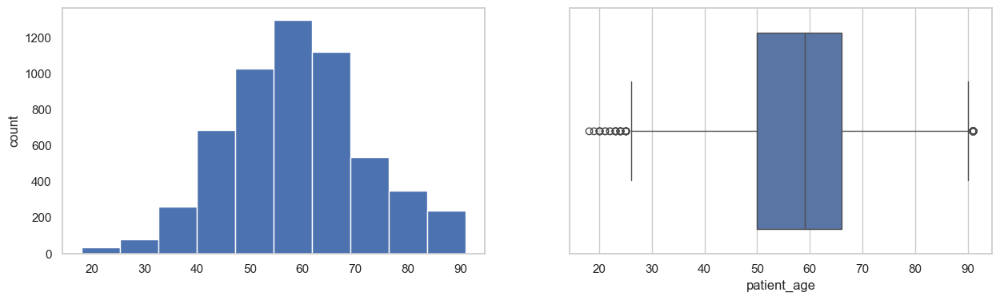

bmi
Skew : 0.38


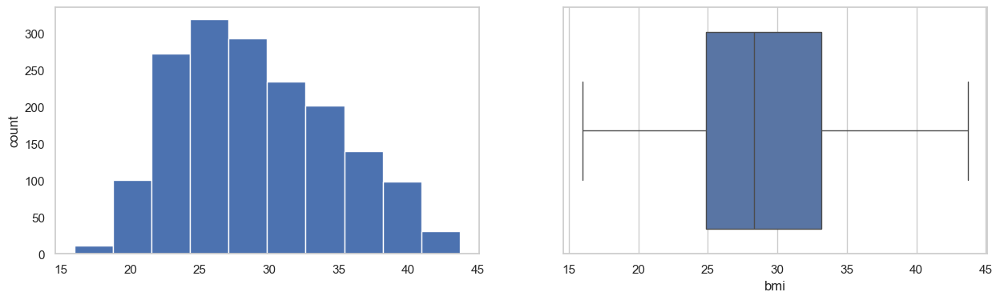

population
Skew : 0.99


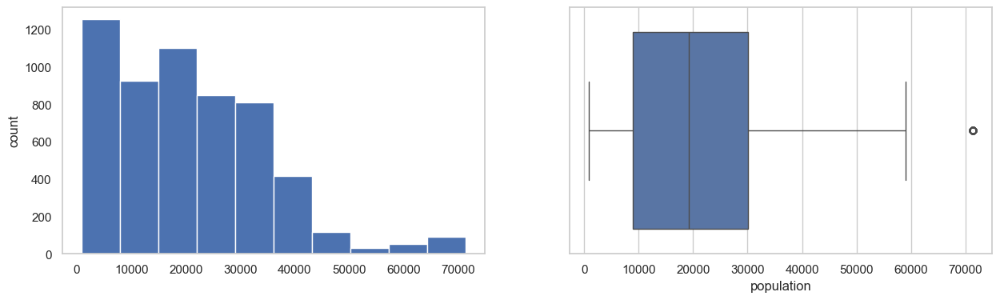

density
Skew : 4.54


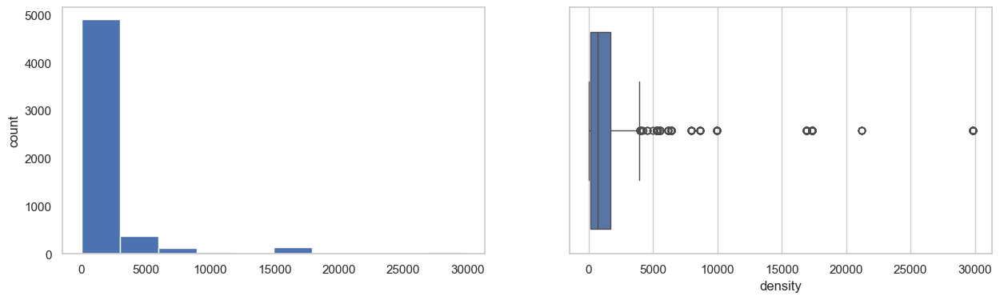

age_median
Skew : 0.29


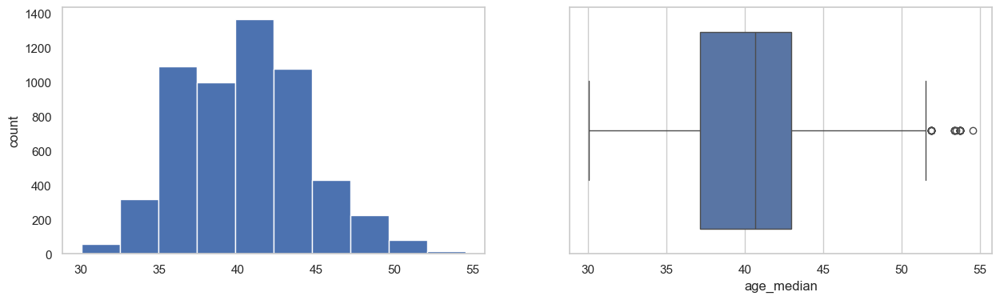

age_under_10
Skew : -0.01


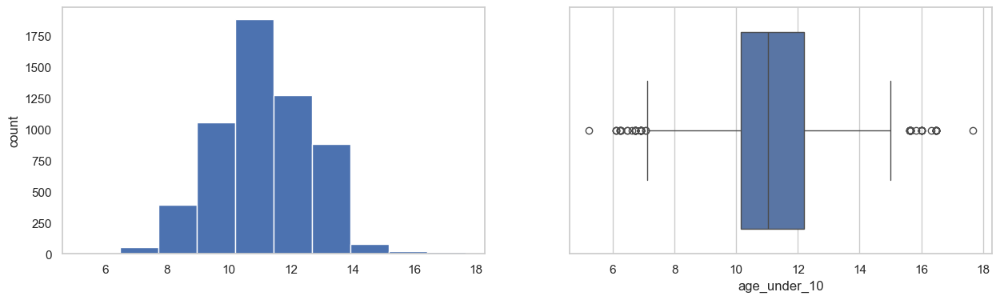

age_10_to_19
Skew : 0.59


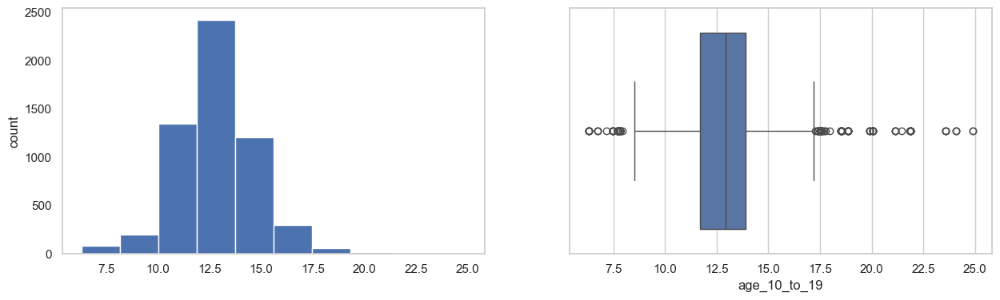

age_20s
Skew : 1.36


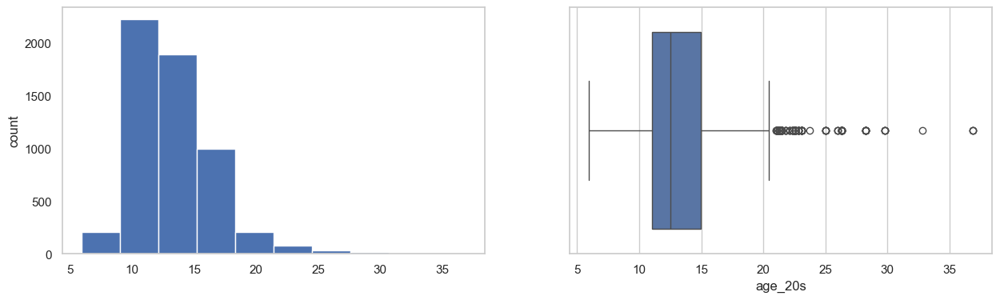

age_30s
Skew : 1.05


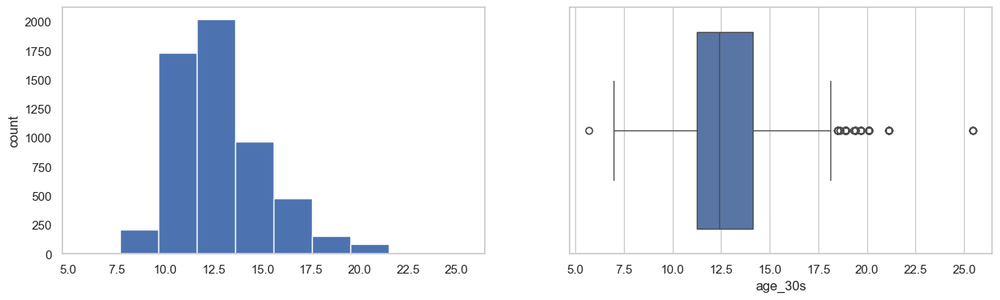

age_40s
Skew : -0.15


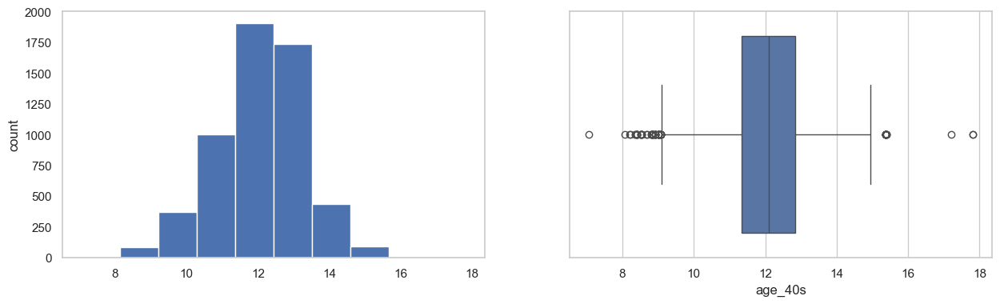

age_50s
Skew : 0.05


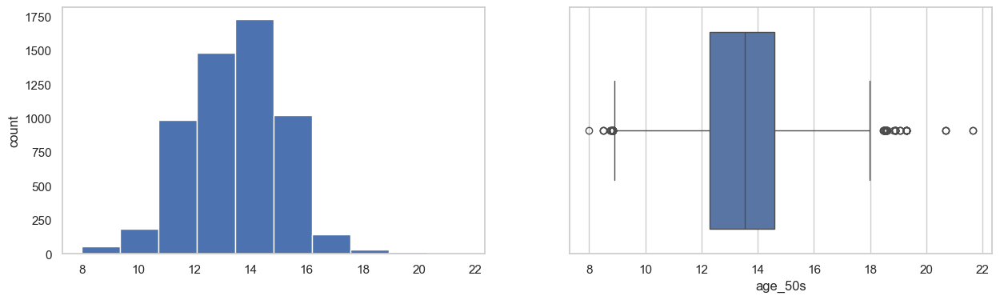

age_60s
Skew : 0.7


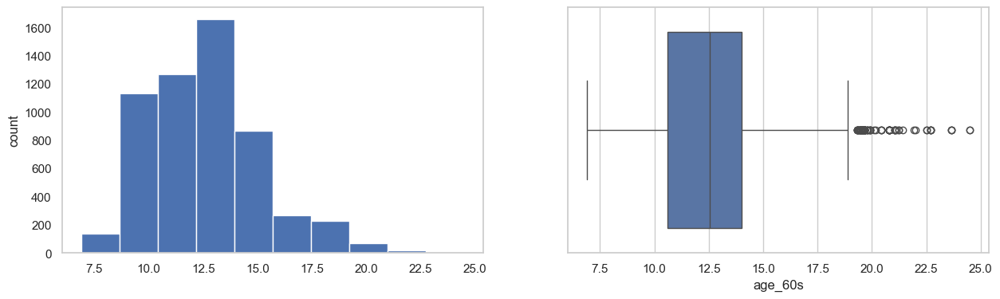

age_70s
Skew : 1.01


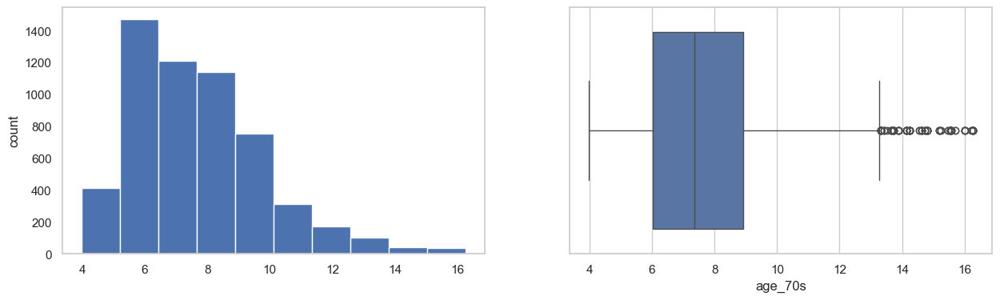

age_over_80
Skew : 3.5


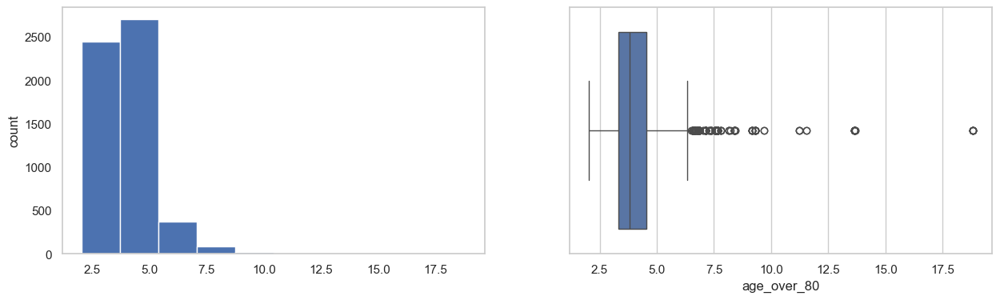

male
Skew : 0.47


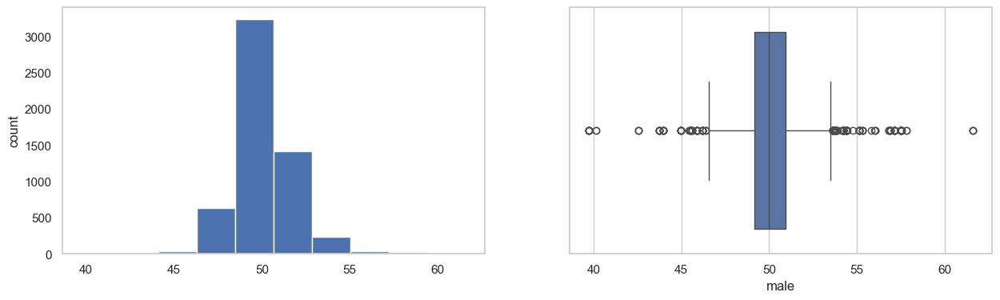

female
Skew : -0.47


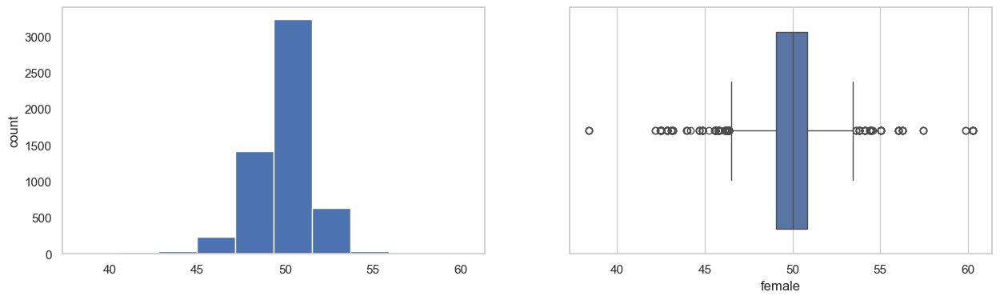

married
Skew : -0.67


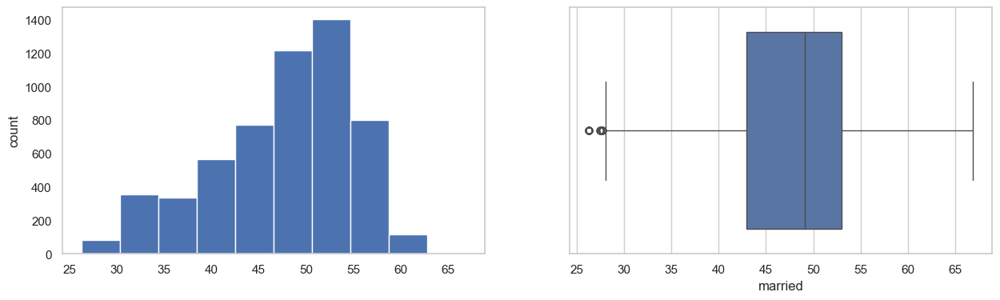

divorced
Skew : 0.15


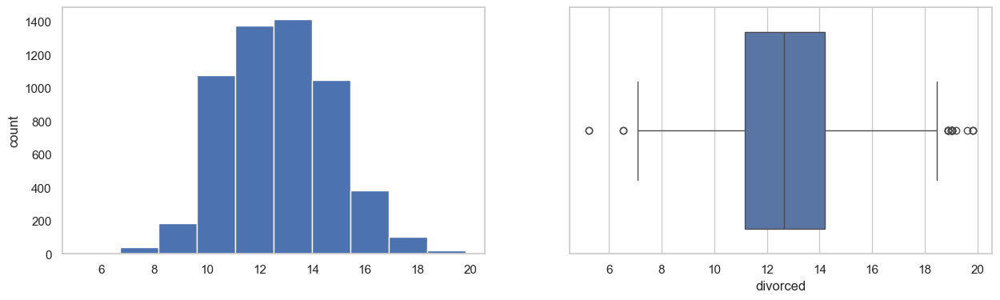

never_married
Skew : 0.73


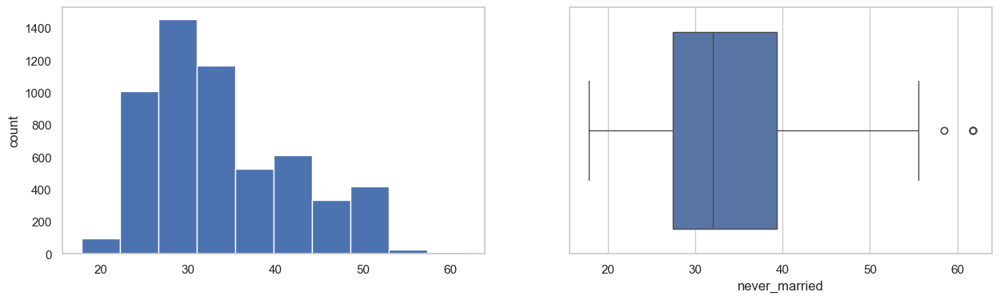

widowed
Skew : 1.91


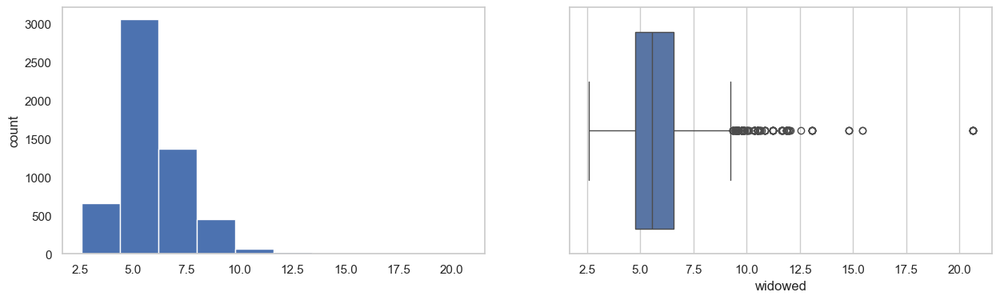

family_size
Skew : 0.76


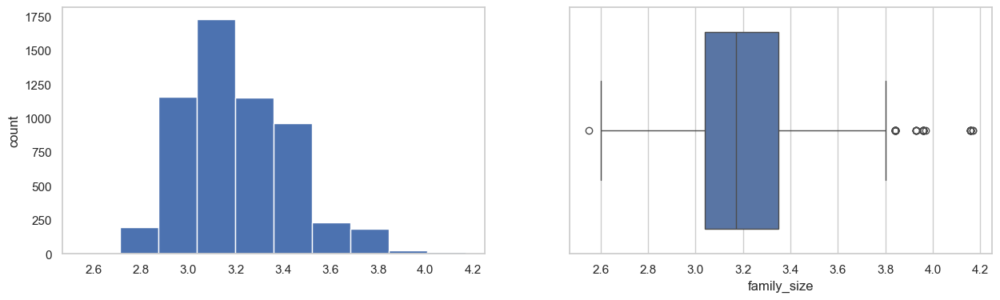

family_dual_income
Skew : -0.56


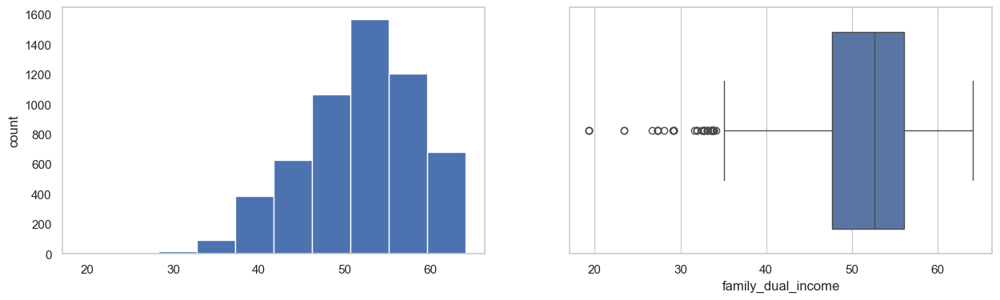

income_household_median
Skew : 1.08


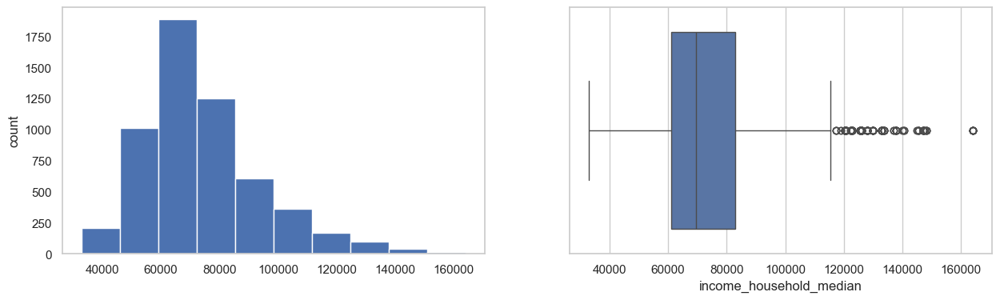

income_household_under_5
Skew : 1.82


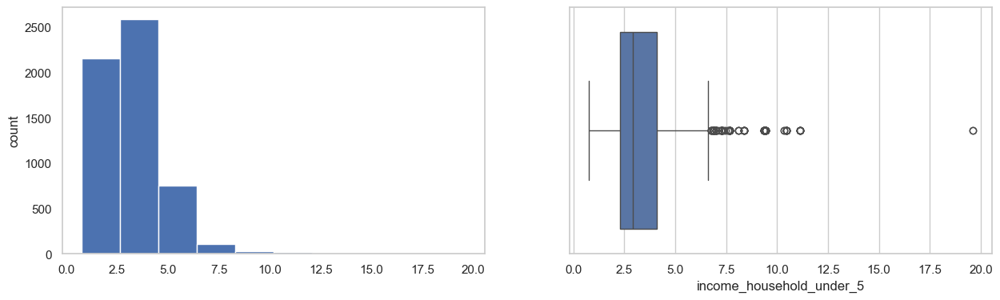

income_household_5_to_10
Skew : 1.62


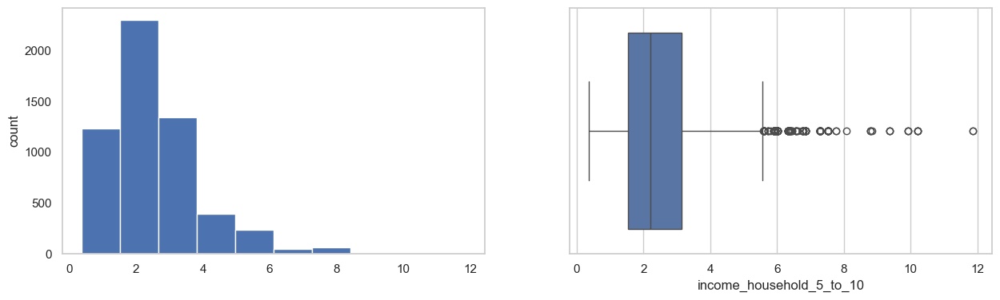

income_household_10_to_15
Skew : 1.01


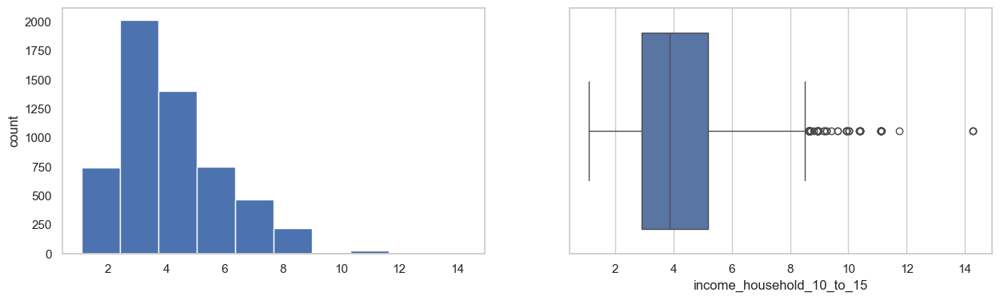

income_household_15_to_20
Skew : 0.9


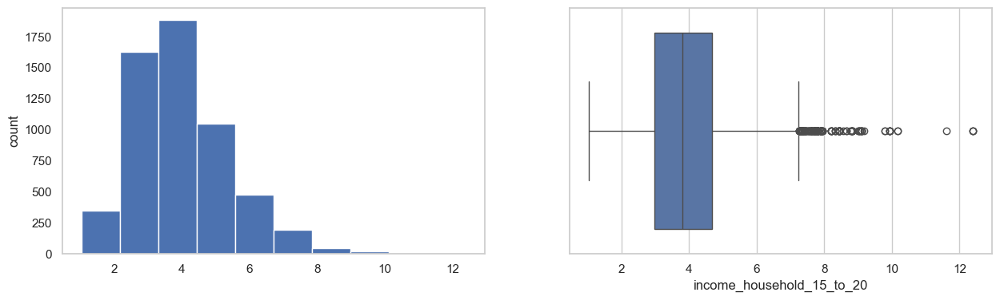

income_household_20_to_25
Skew : 0.78


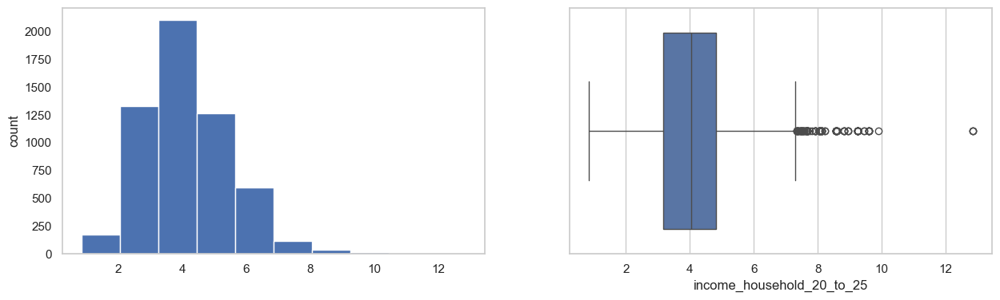

income_household_25_to_35
Skew : 0.23


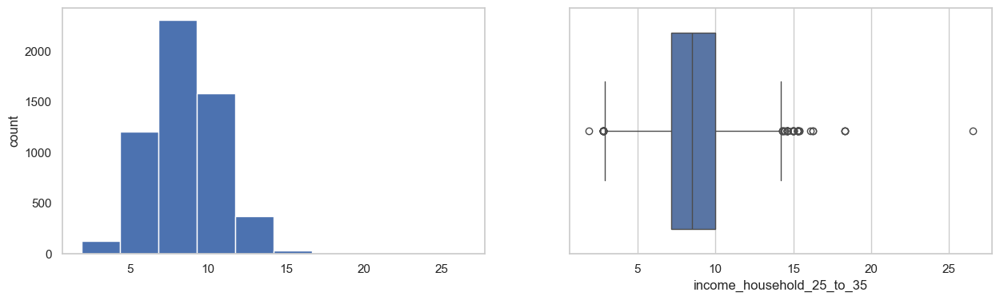

income_household_35_to_50
Skew : -0.03


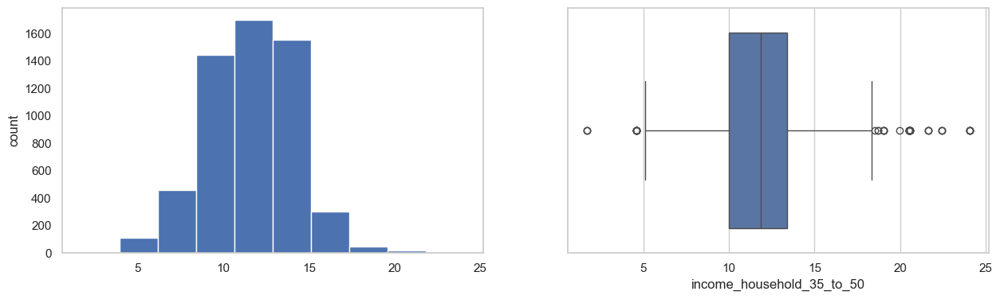

income_household_50_to_75
Skew : -0.26


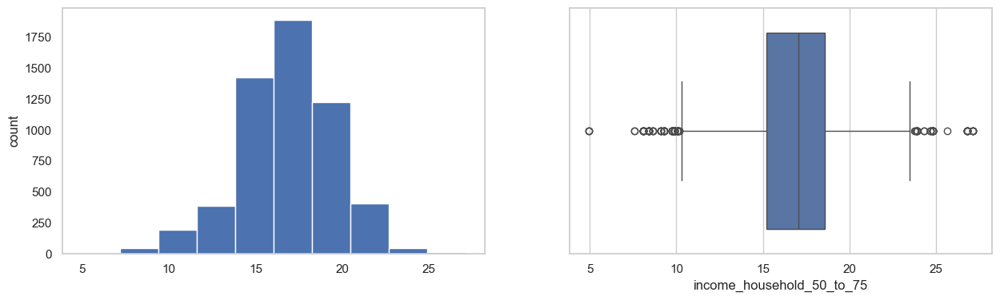

income_household_75_to_100
Skew : 0.08


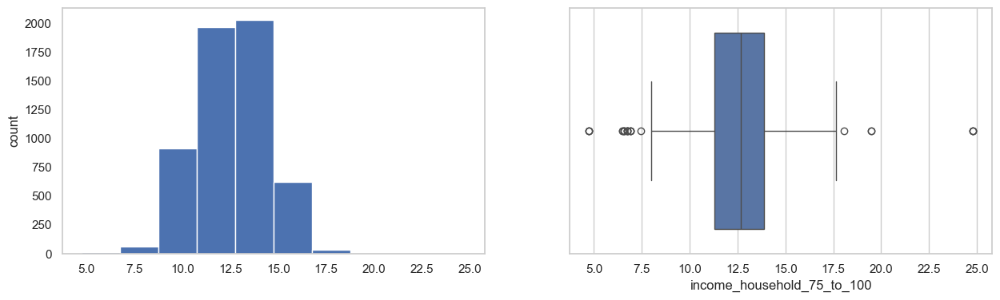

income_household_100_to_150
Skew : -0.19


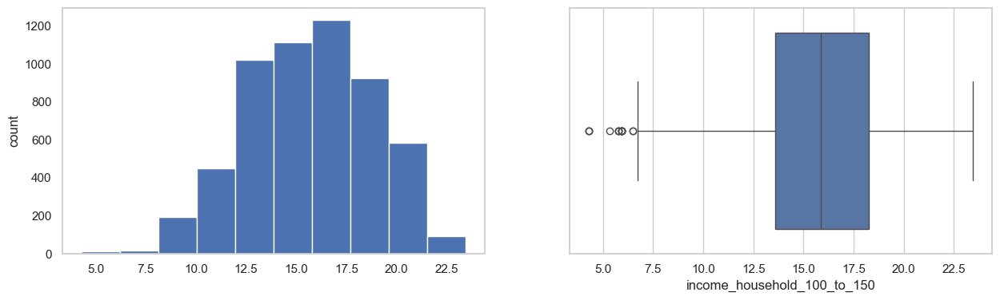

income_household_150_over
Skew : 1.14


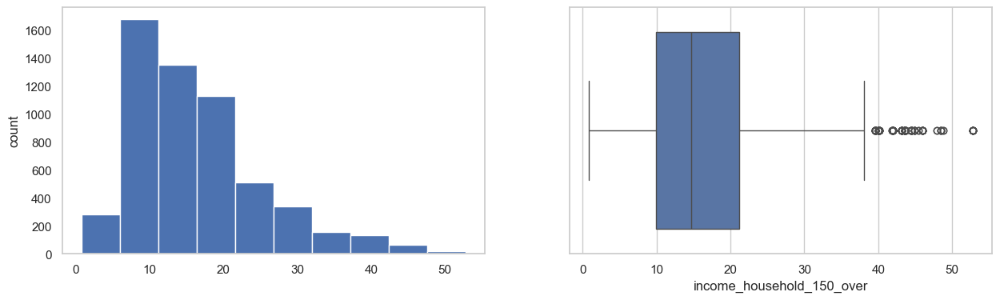

income_household_six_figure
Skew : 0.63


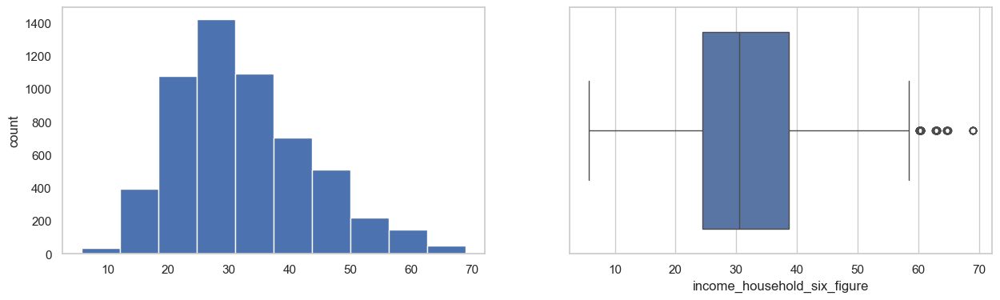

income_individual_median
Skew : 1.33


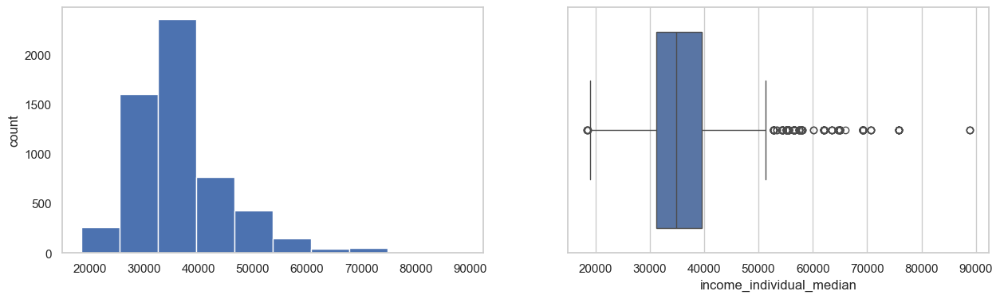

home_ownership
Skew : -0.98


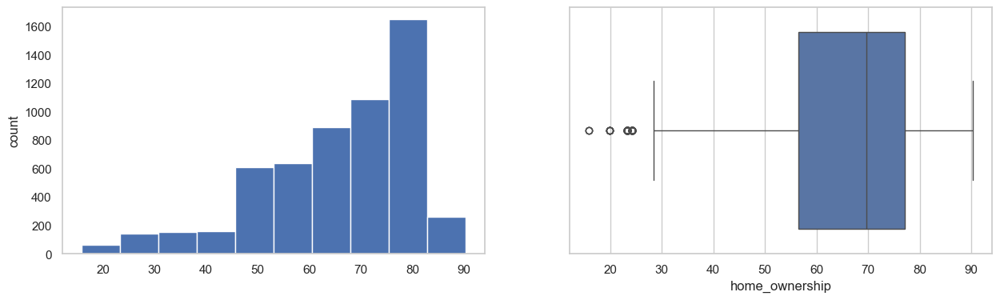

housing_units
Skew : 1.0


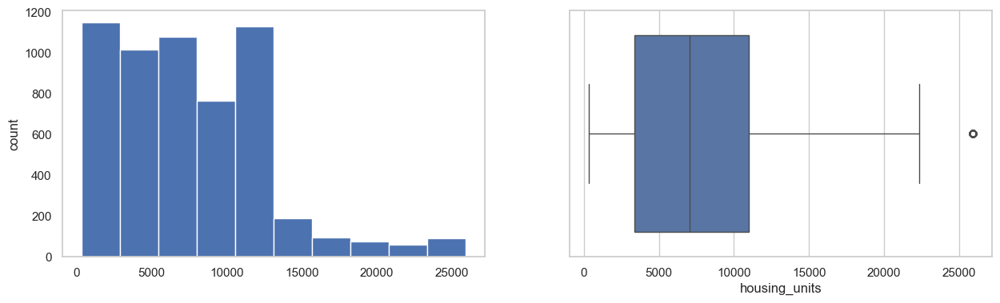

home_value
Skew : 1.64


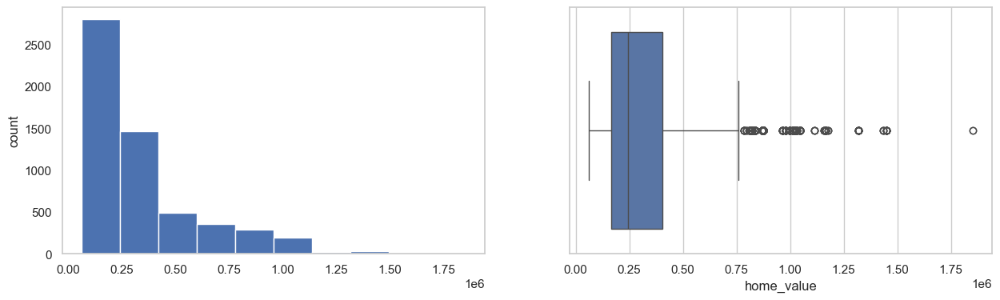

rent_median
Skew : 0.83


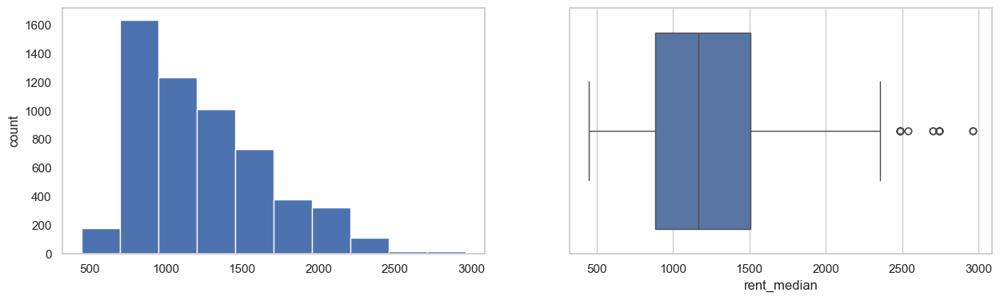

rent_burden
Skew : 1.91


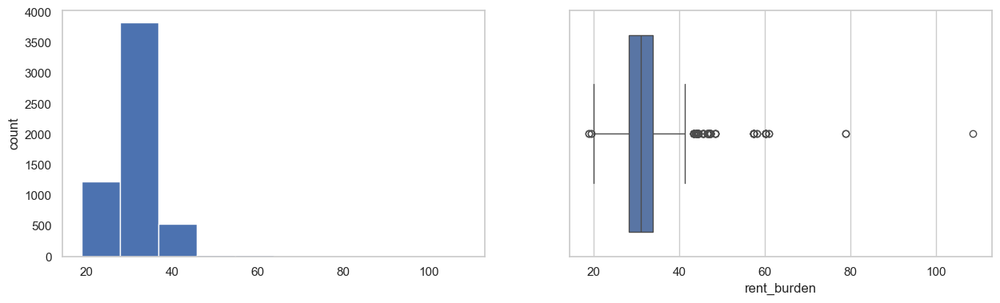

education_less_highschool
Skew : 1.05


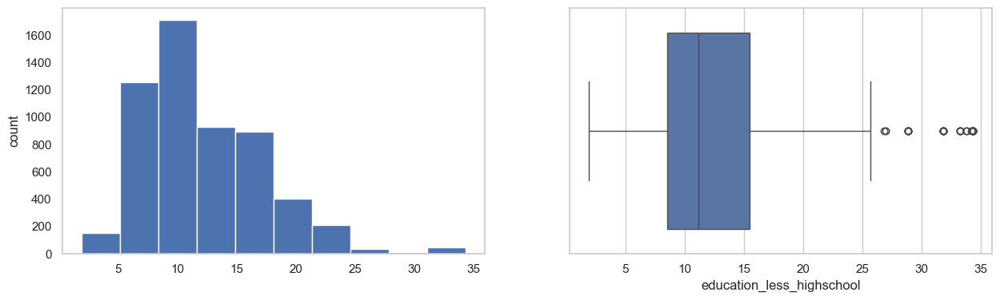

education_highschool
Skew : 0.16


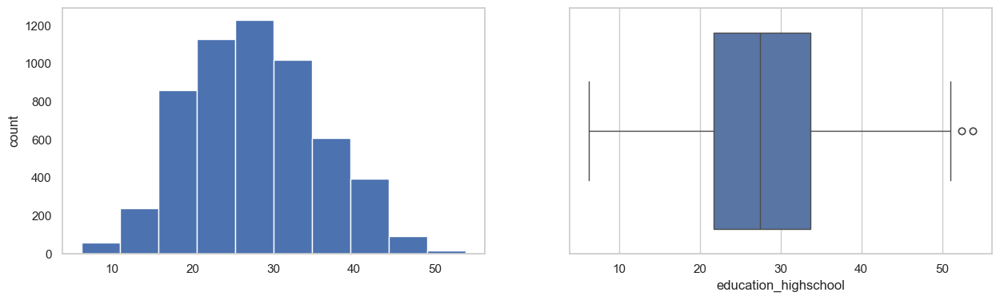

education_some_college
Skew : -0.41


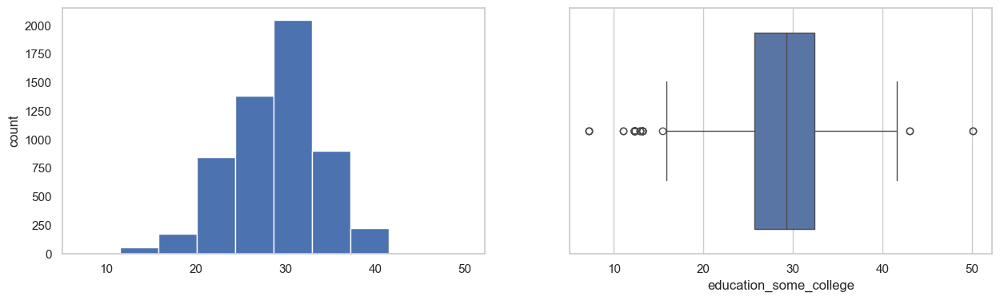

education_bachelors
Skew : 0.36


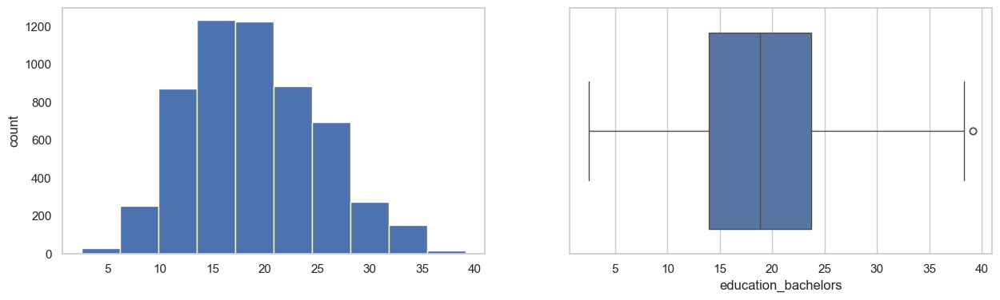

education_graduate
Skew : 1.44


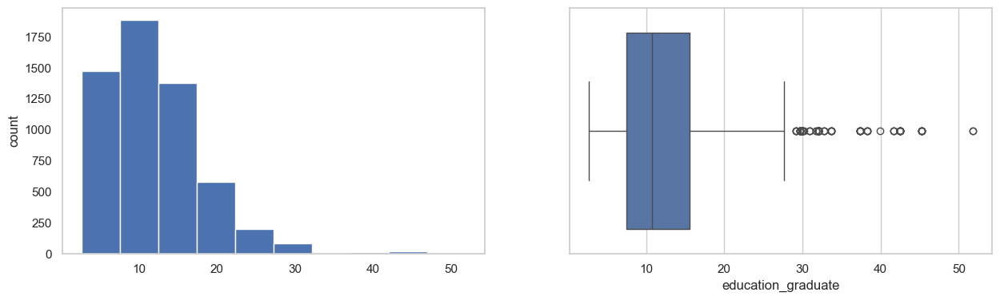

education_college_or_above
Skew : 0.72


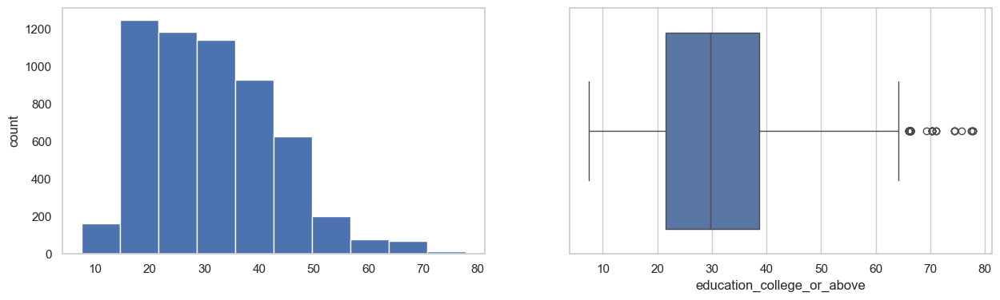

education_stem_degree
Skew : 0.61


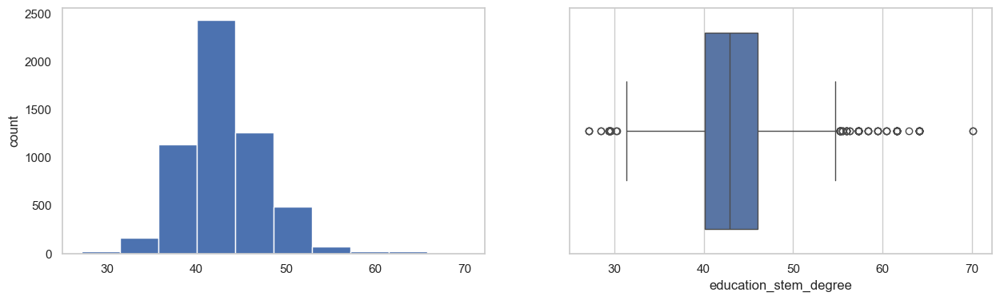

labor_force_participation
Skew : -0.68


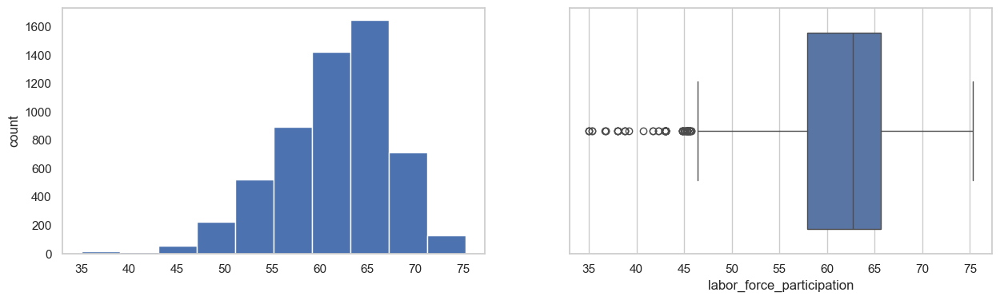

unemployment_rate
Skew : 1.11


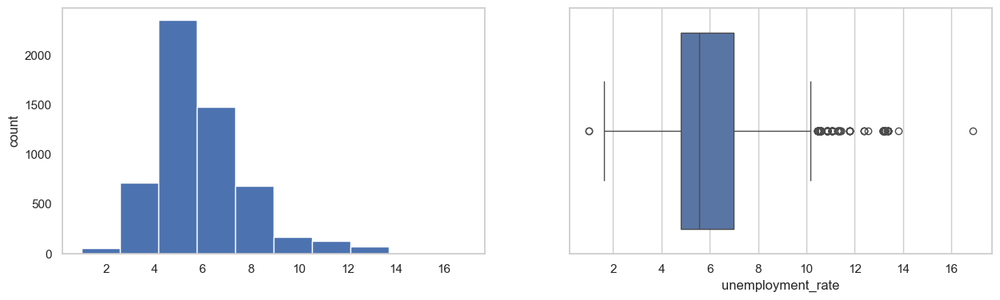

self_employed
Skew : 0.72


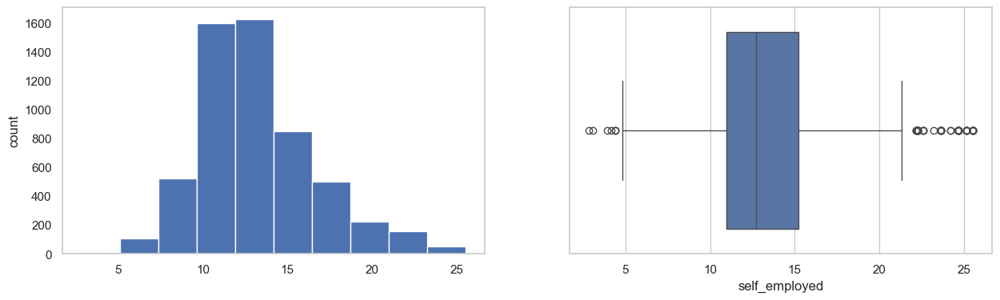

farmer
Skew : 2.64


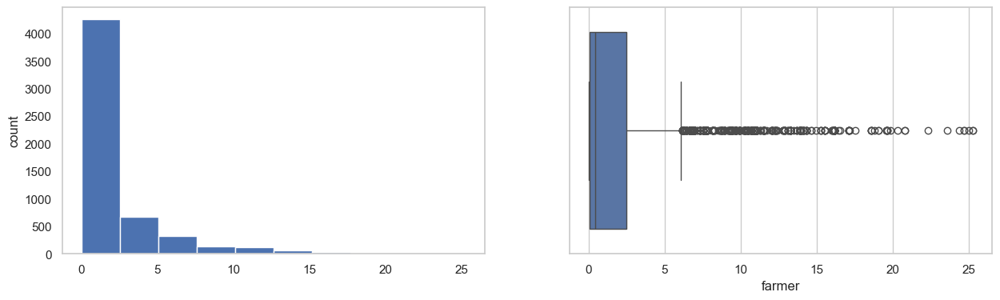

race_white
Skew : -0.38


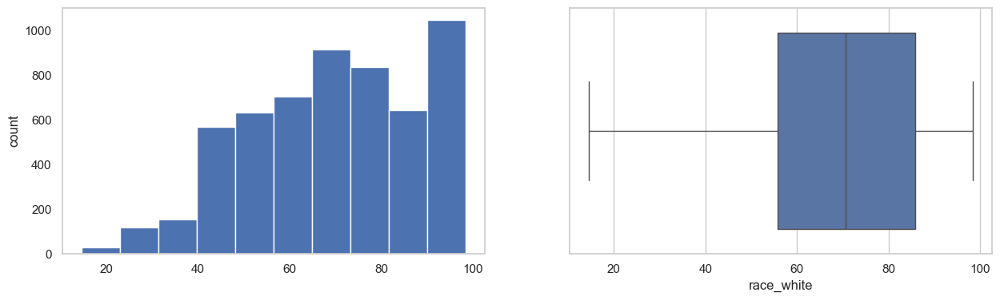

race_black
Skew : 1.61


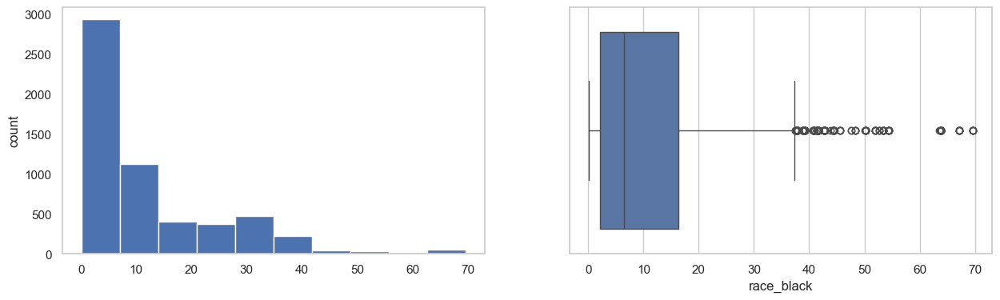

race_asian
Skew : 2.17


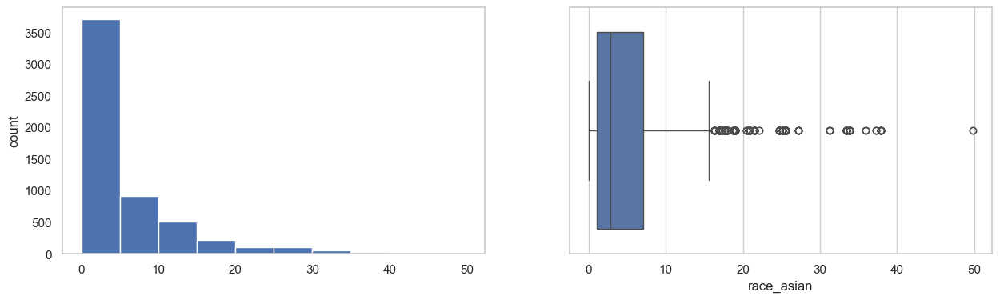

race_native
Skew : 17.5


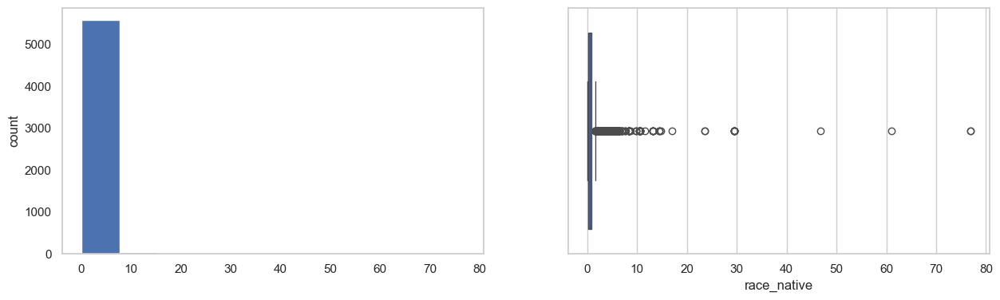

race_pacific
Skew : 23.44


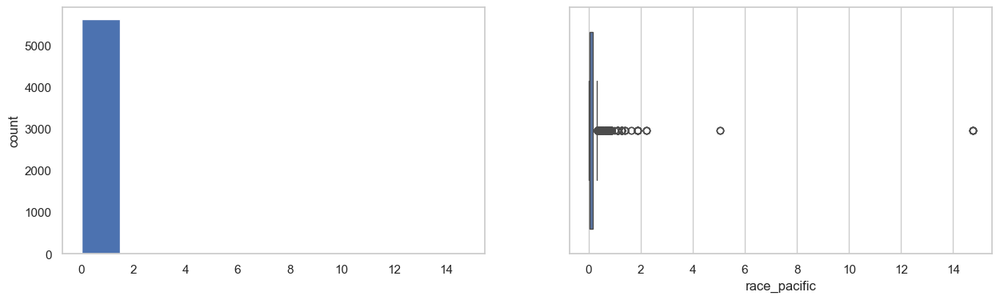

race_other
Skew : 1.87


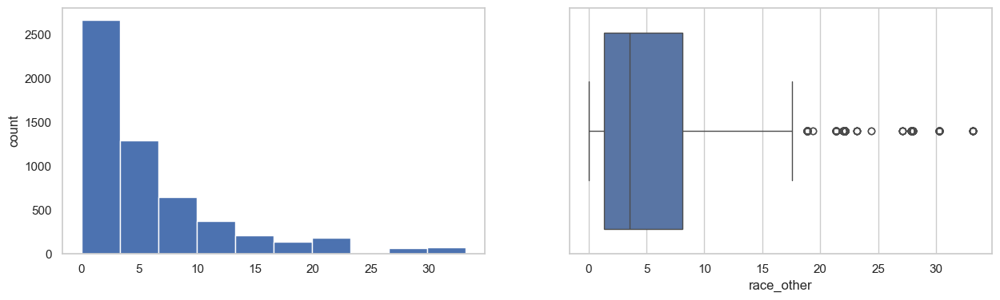

race_multiple
Skew : 1.16


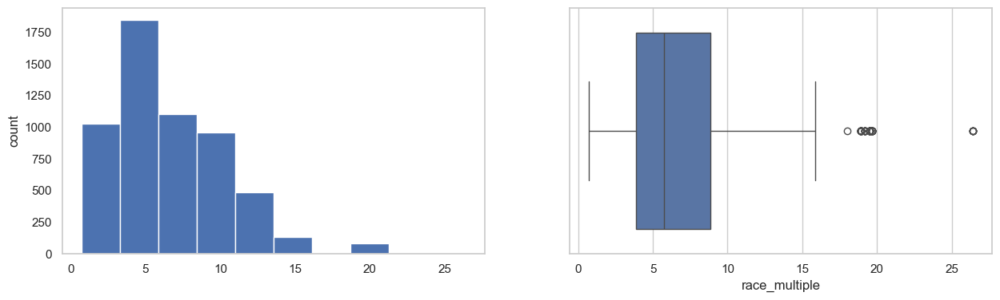

hispanic
Skew : 1.17


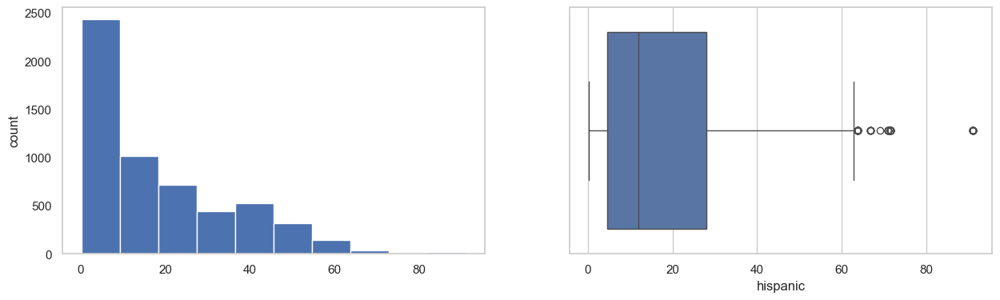

disabled
Skew : 1.03


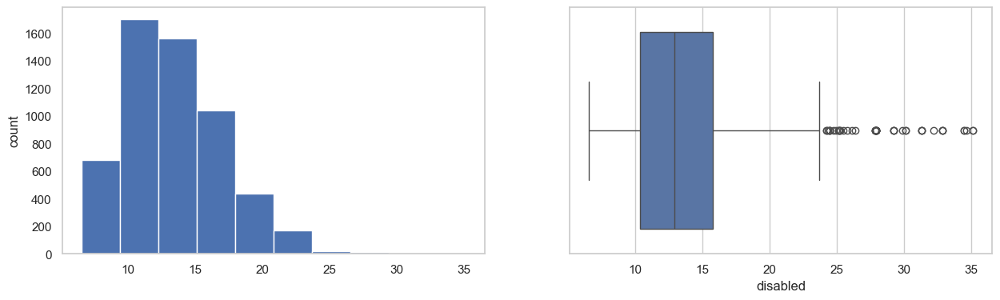

poverty
Skew : 0.93


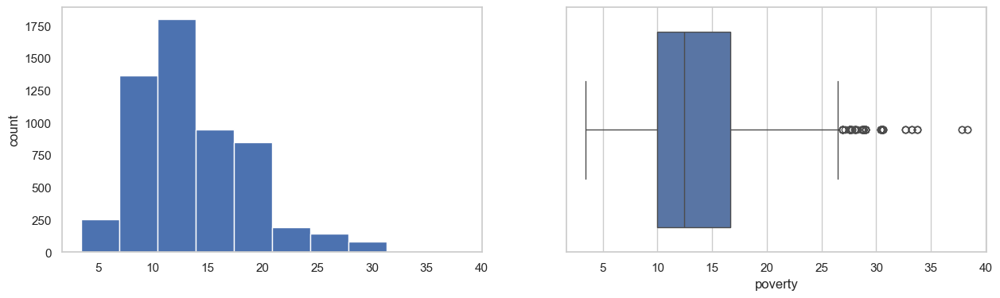

limited_english
Skew : 1.62


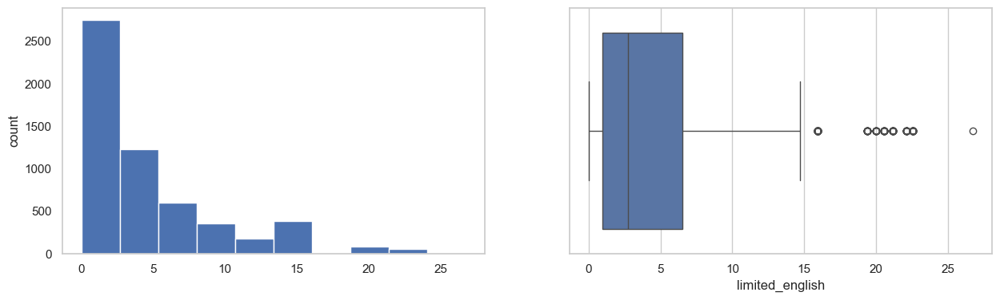

commute_time
Skew : 0.91


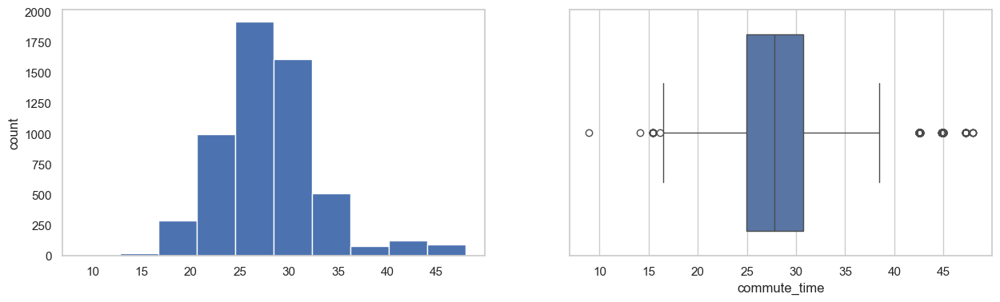

health_uninsured
Skew : 1.33


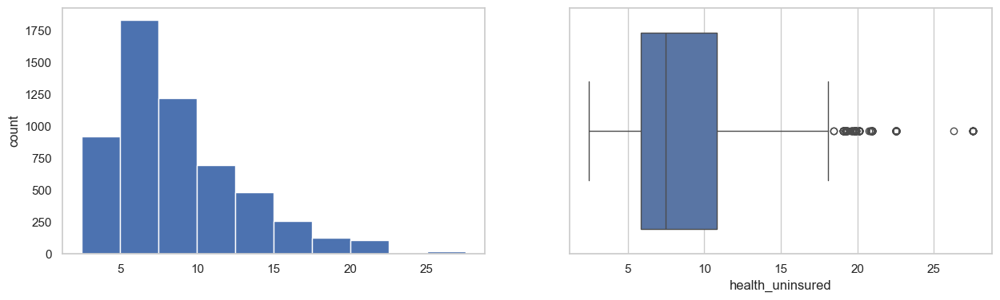

veteran
Skew : 1.1


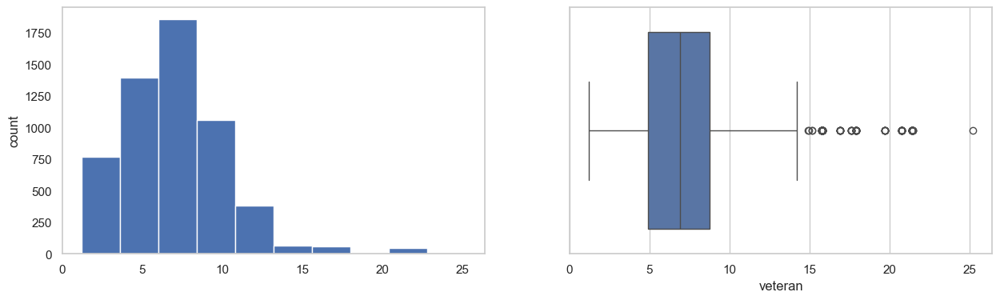

Average of Jan-13
Skew : 0.26


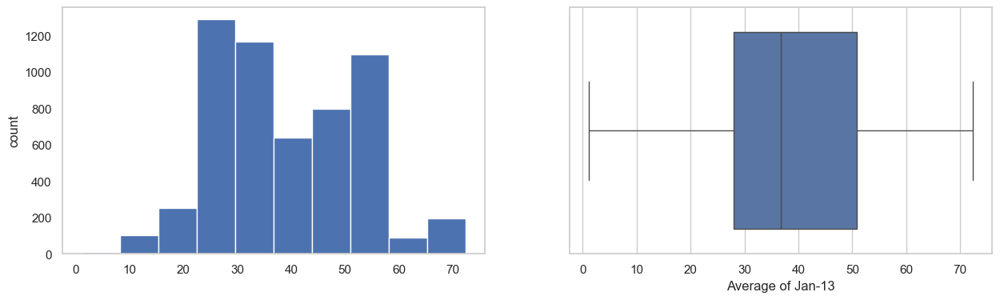

Average of Feb-13
Skew : 0.21


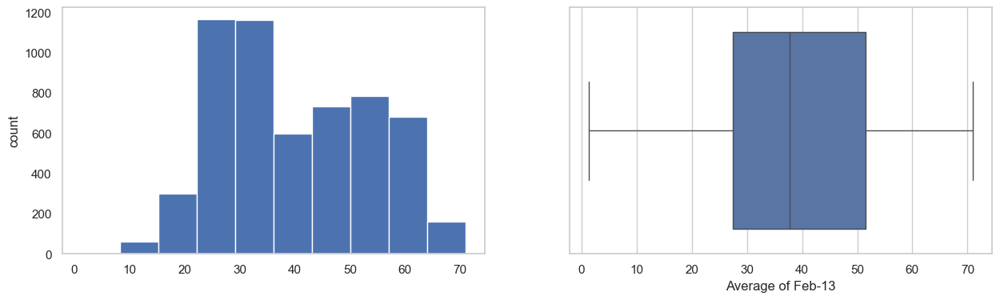

Average of Mar-13
Skew : 0.14


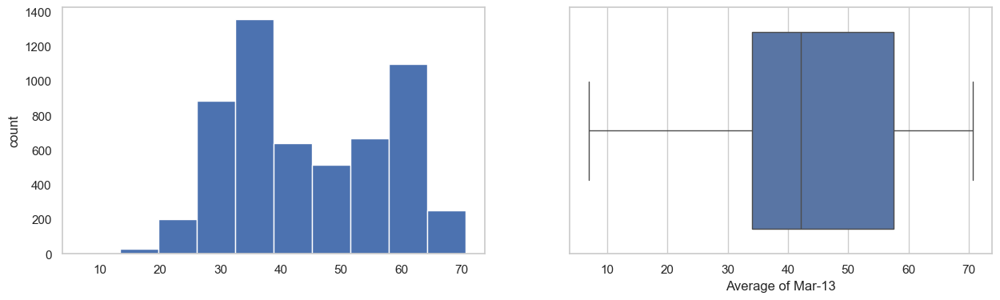

Average of Apr-13
Skew : 0.01


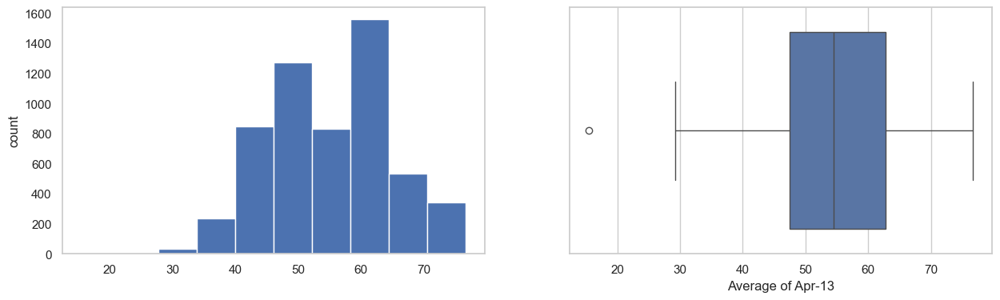

Average of May-13
Skew : 0.28


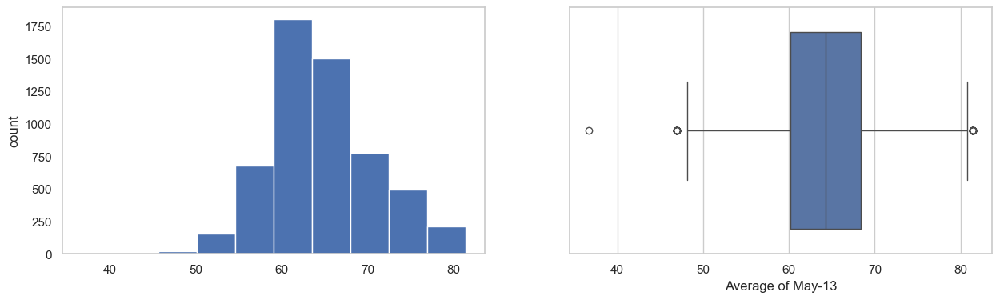

Average of Jun-13
Skew : 0.53


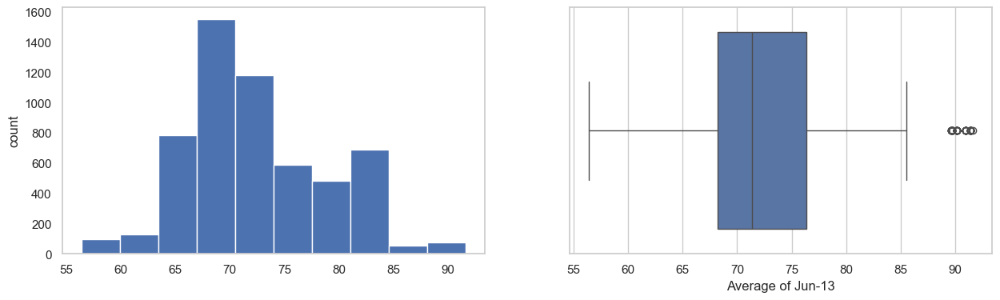

Average of Jul-13
Skew : 0.73


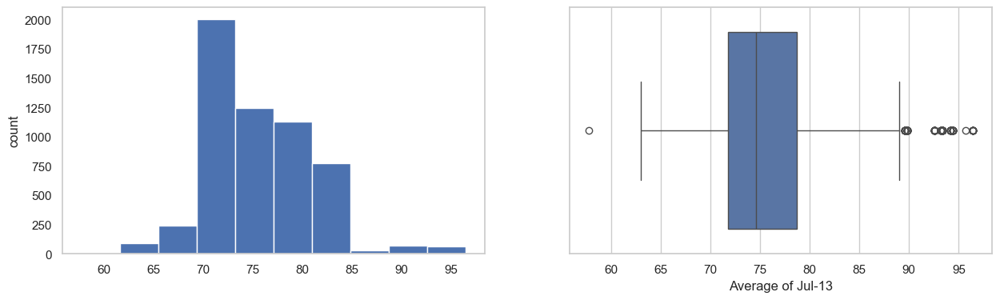

Average of Aug-13
Skew : 0.81


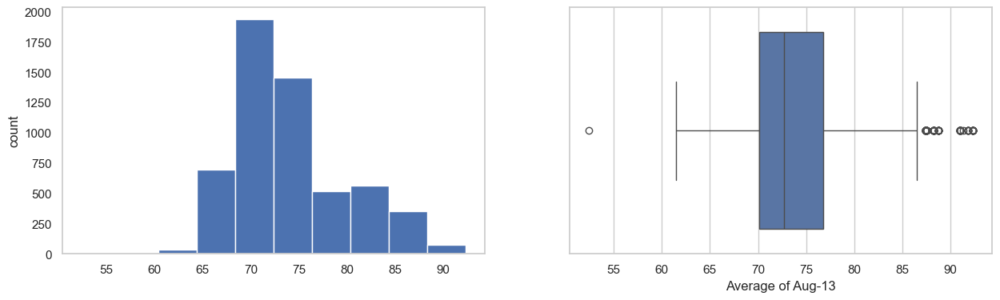

Average of Sep-13
Skew : 0.38


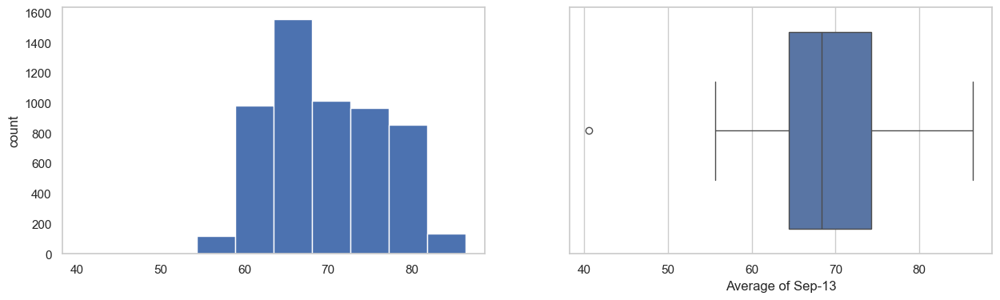

Average of Oct-13
Skew : 0.32


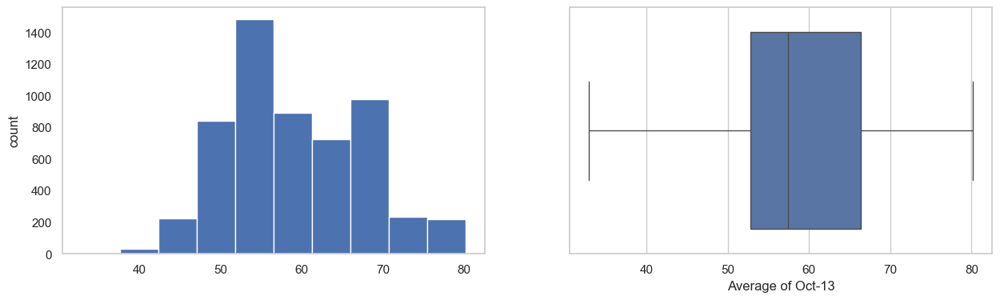

Average of Nov-13
Skew : 0.57


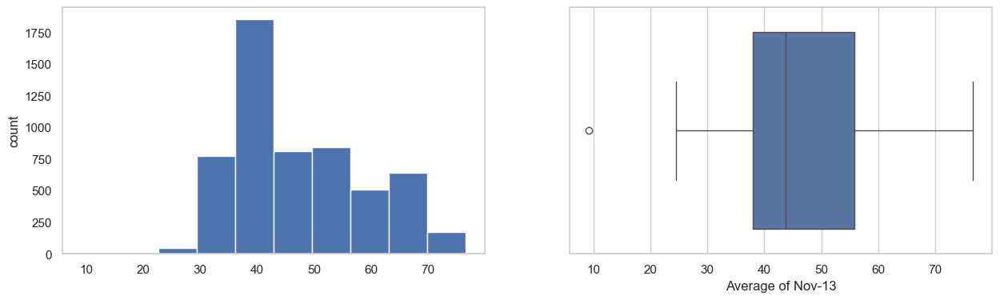

Average of Dec-13
Skew : 0.19


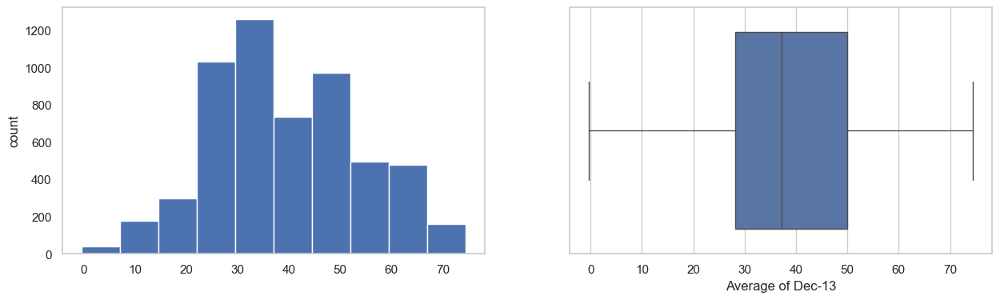

Average of Jan-14
Skew : 0.27


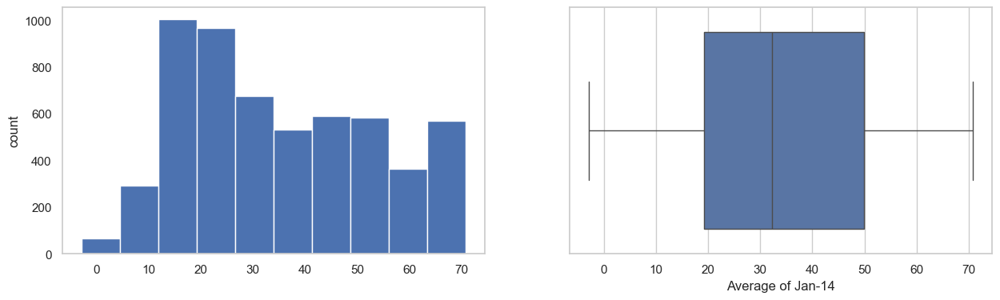

Average of Feb-14
Skew : 0.07


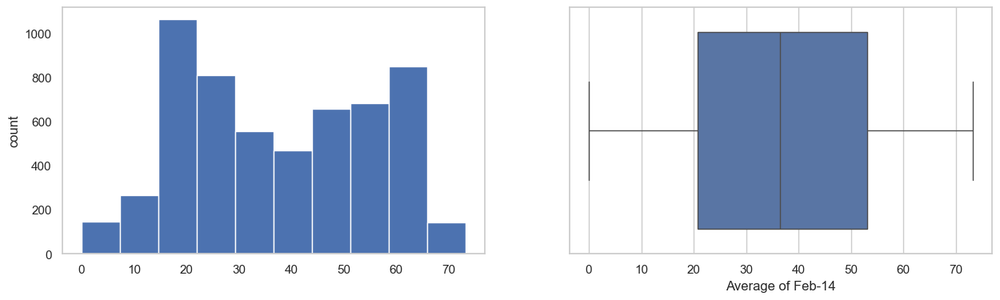

Average of Mar-14
Skew : 0.07


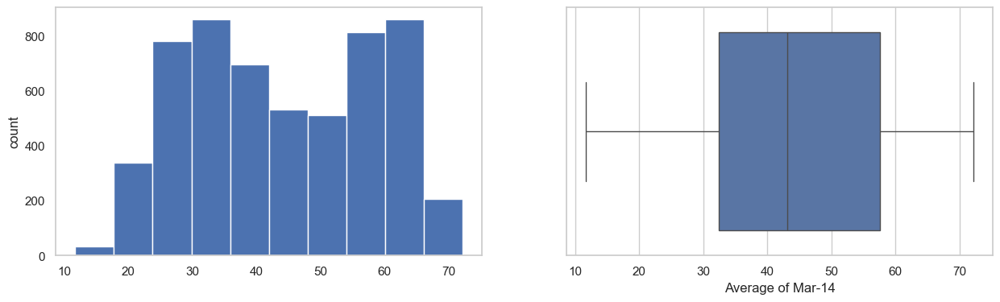

Average of Apr-14
Skew : 0.07


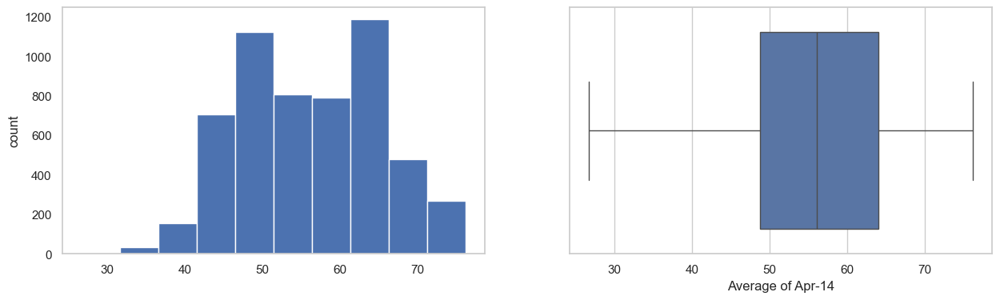

Average of May-14
Skew : 0.13


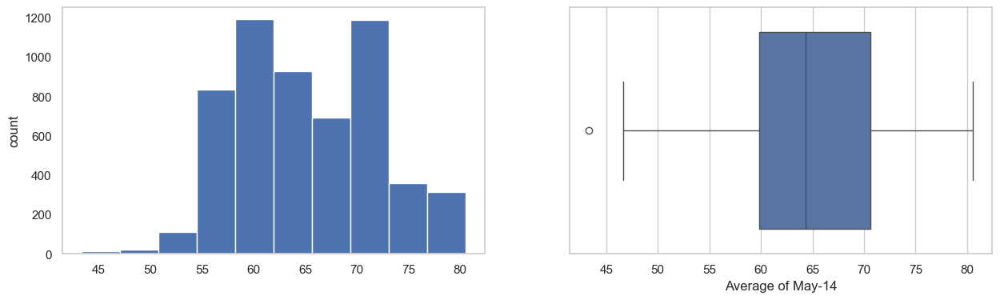

Average of Jun-14
Skew : 0.21


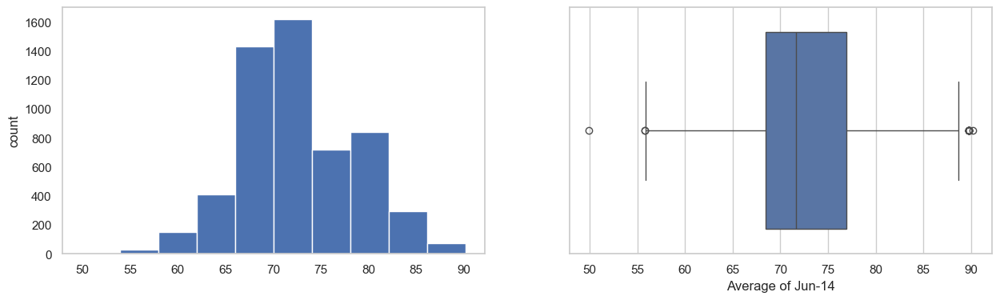

Average of Jul-14
Skew : 0.62


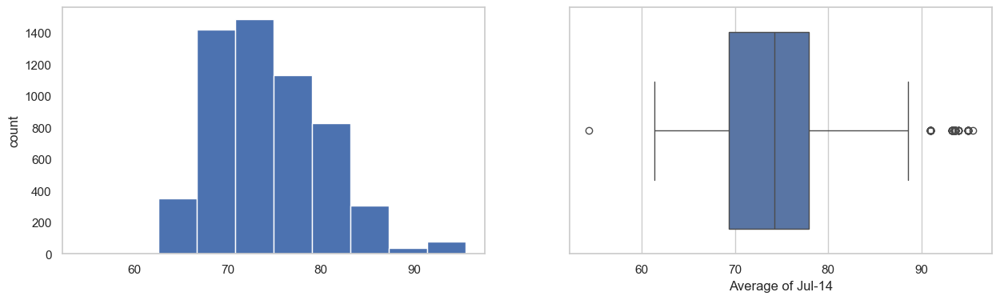

Average of Aug-14
Skew : 0.45


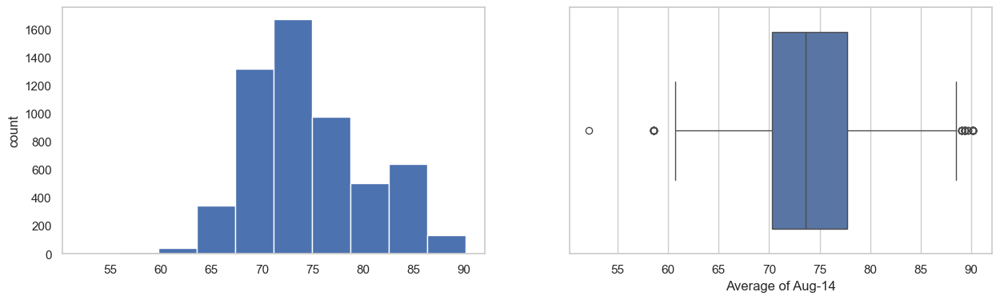

Average of Sep-14
Skew : 0.21


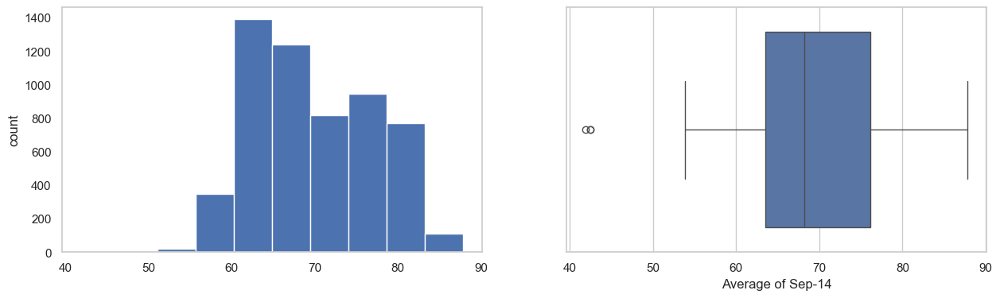

Average of Oct-14
Skew : 0.23


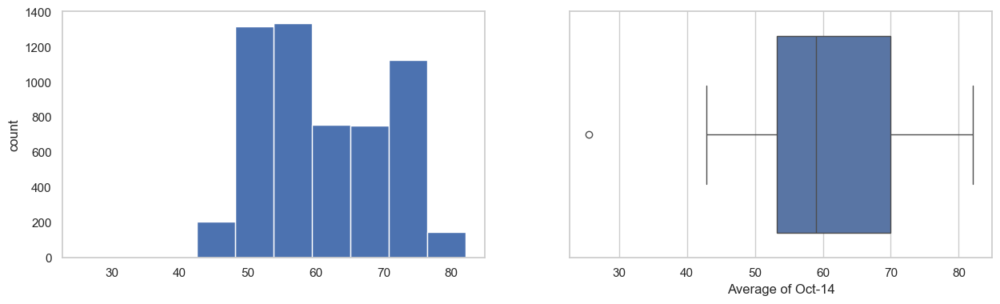

Average of Nov-14
Skew : 0.38


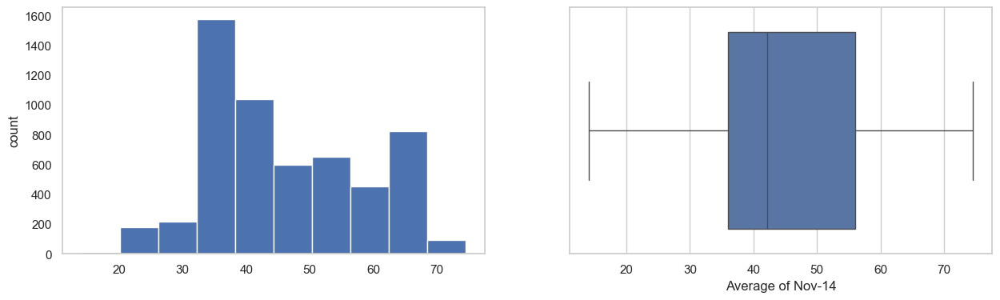

Average of Dec-14
Skew : 0.3


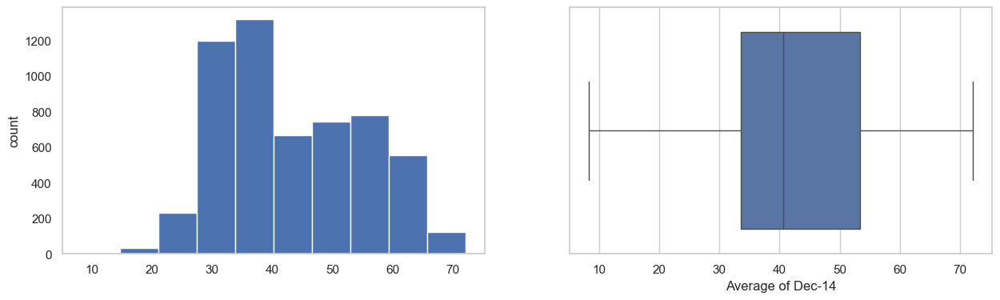

Average of Jan-15
Skew : 0.36


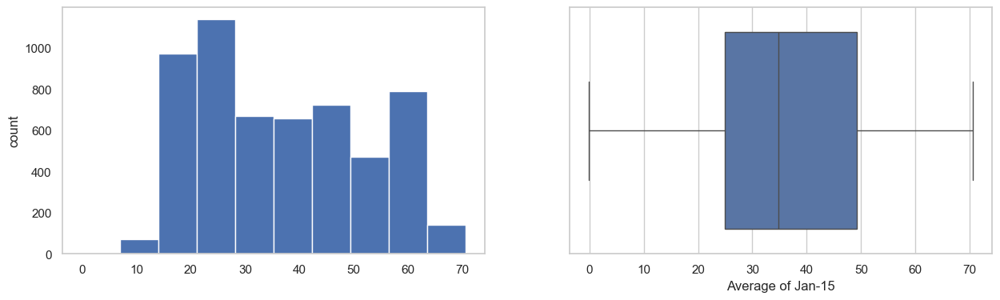

Average of Feb-15
Skew : 0.15


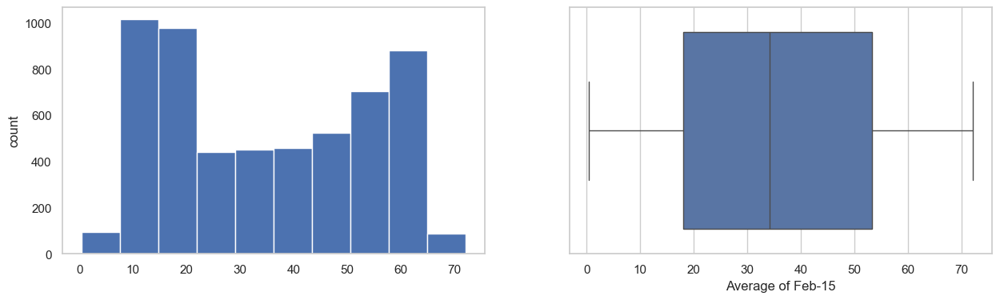

Average of Mar-15
Skew : 0.2


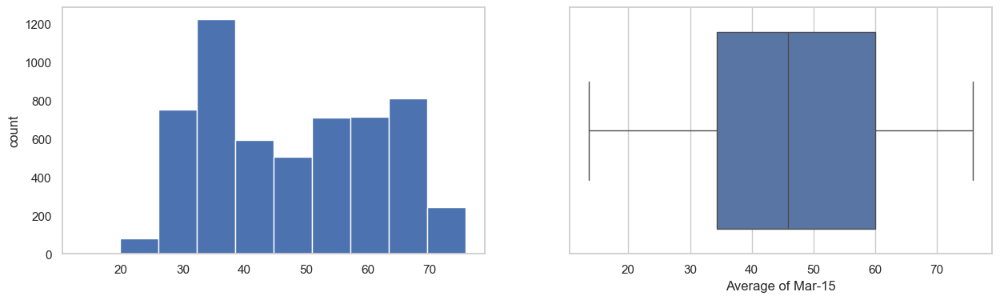

Average of Apr-15
Skew : 0.4


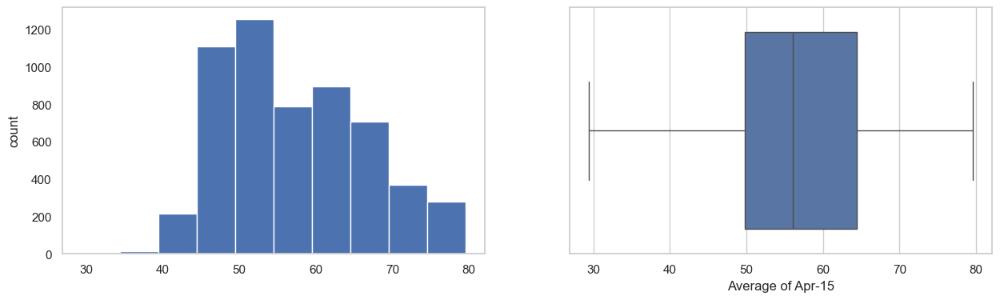

Average of May-15
Skew : 0.17


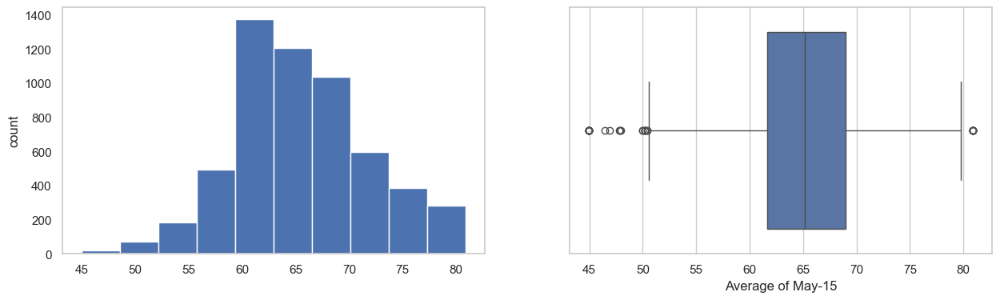

Average of Jun-15
Skew : 0.45


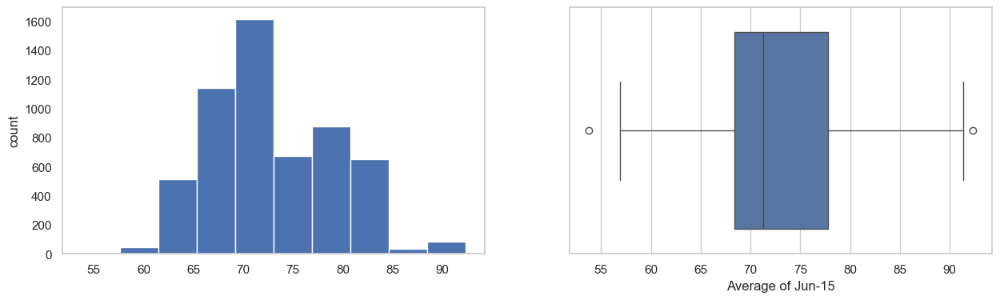

Average of Jul-15
Skew : 0.45


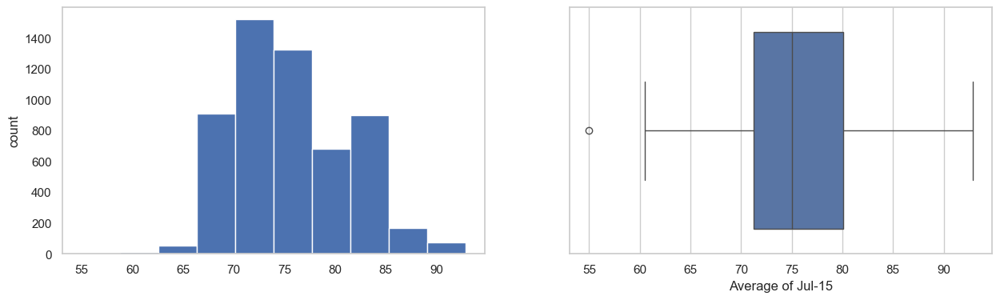

Average of Aug-15
Skew : 0.56


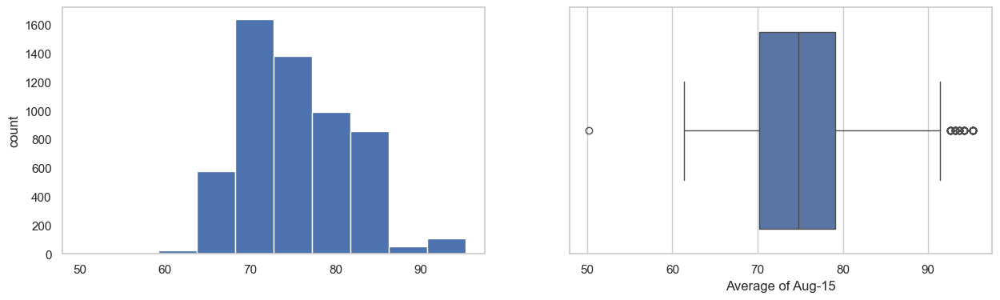

Average of Sep-15
Skew : 0.37


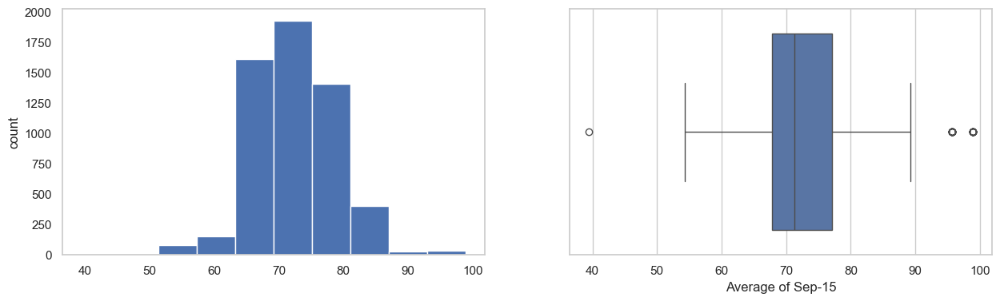

Average of Oct-15
Skew : 0.38


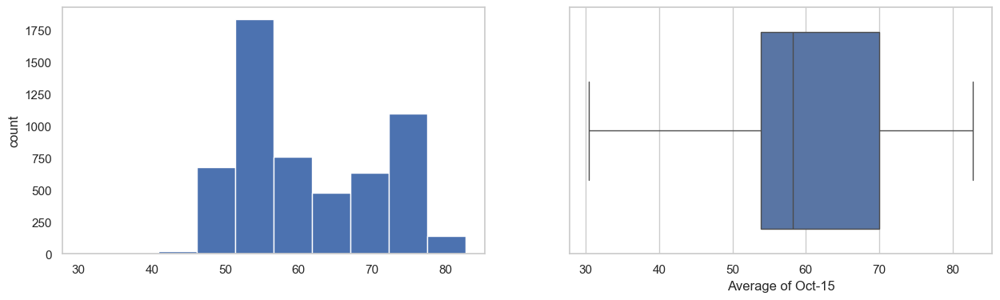

Average of Nov-15
Skew : 0.61


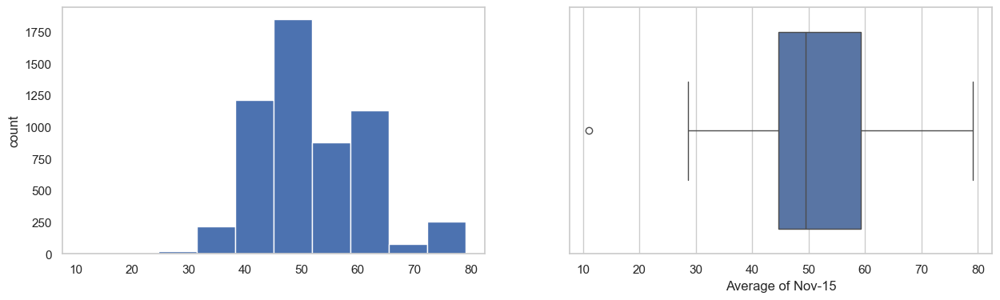

Average of Dec-15
Skew : 0.35


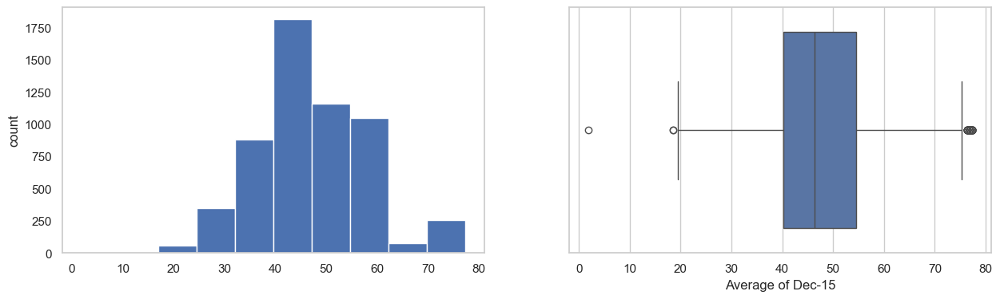

Average of Jan-16
Skew : 0.3


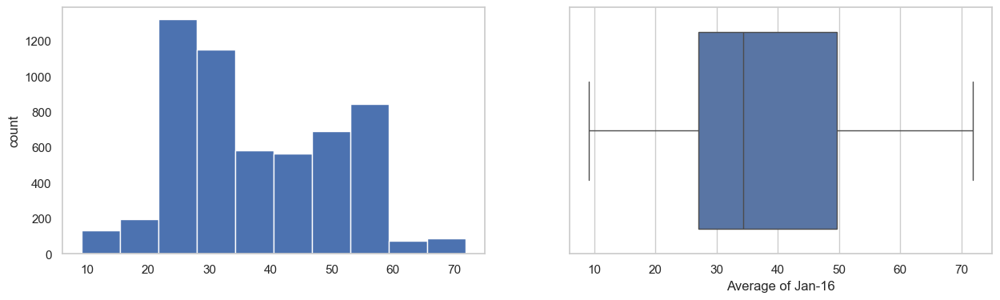

Average of Feb-16
Skew : 0.28


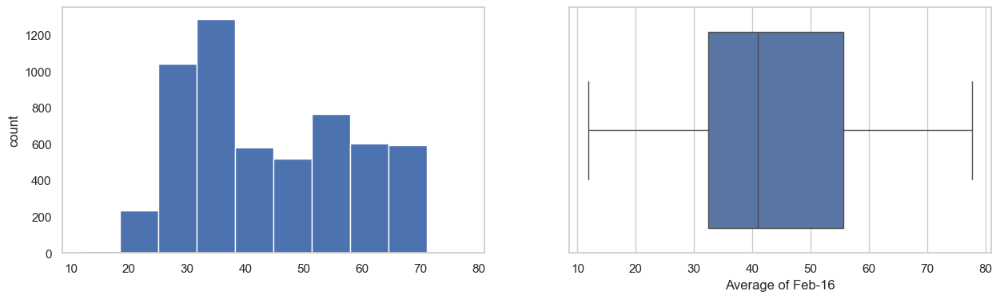

Average of Mar-16
Skew : 0.19


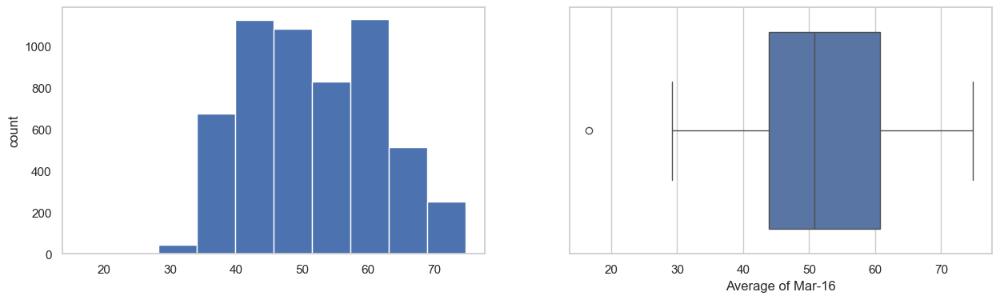

Average of Apr-16
Skew : 0.09


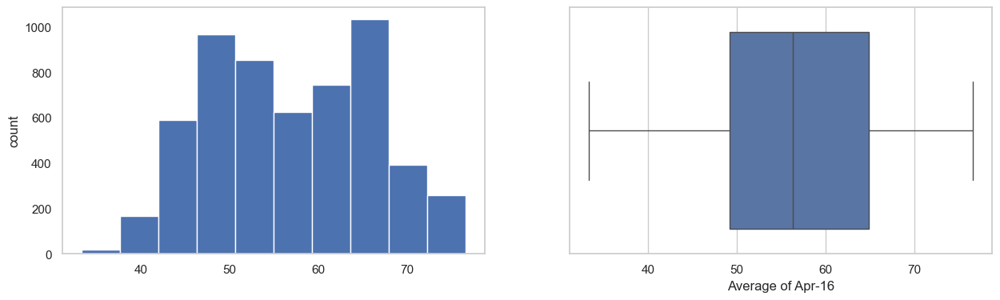

Average of May-16
Skew : 0.65


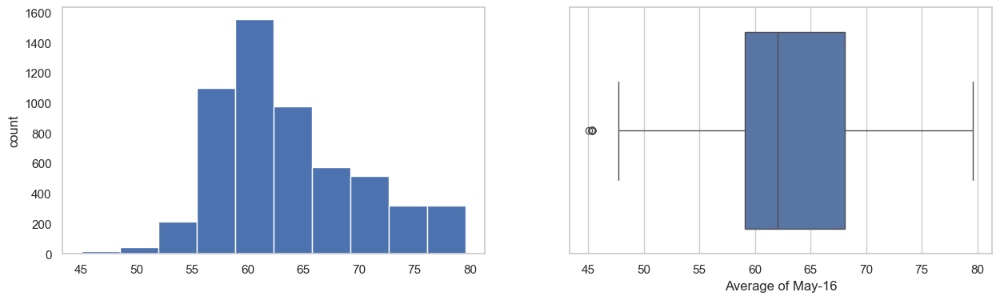

Average of Jun-16
Skew : 0.35


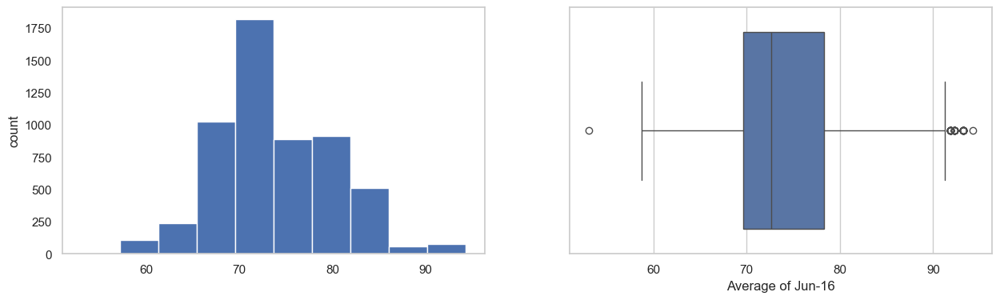

Average of Jul-16
Skew : 0.27


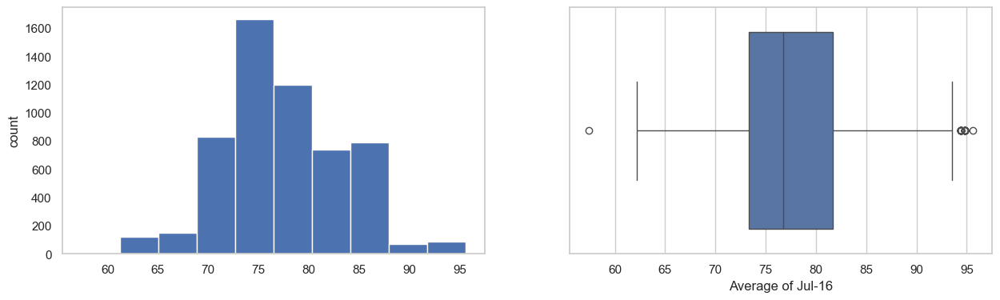

Average of Aug-16
Skew : 0.01


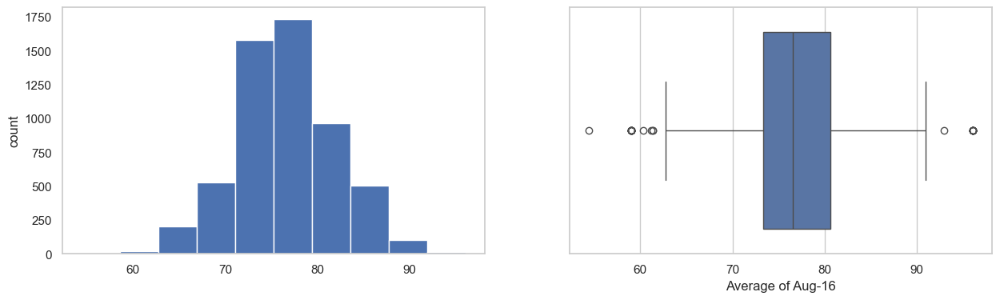

Average of Sep-16
Skew : -0.03


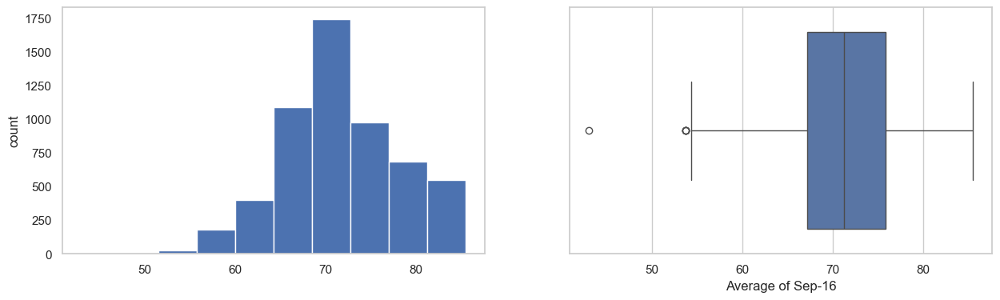

Average of Oct-16
Skew : 0.24


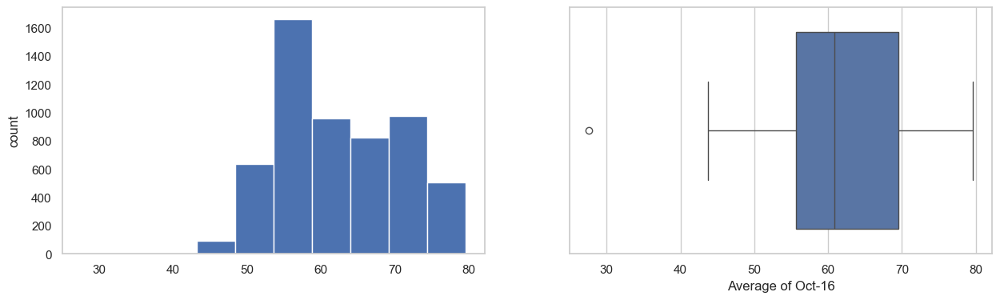

Average of Nov-16
Skew : 0.49


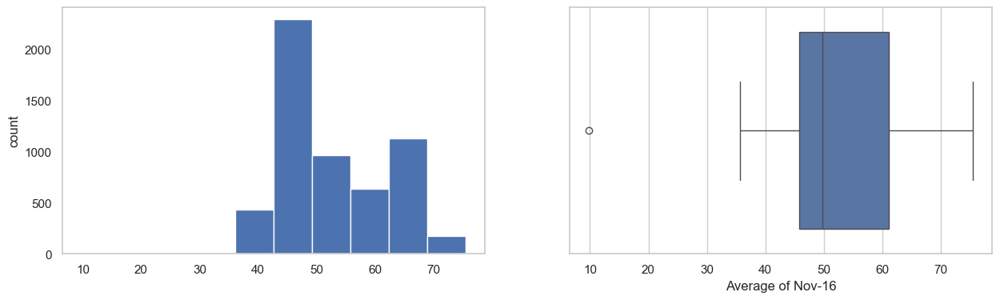

Average of Dec-16
Skew : 0.38


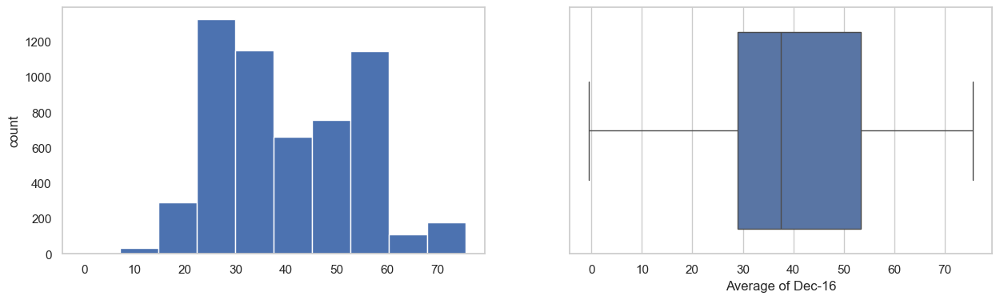

Average of Jan-17
Skew : 0.13


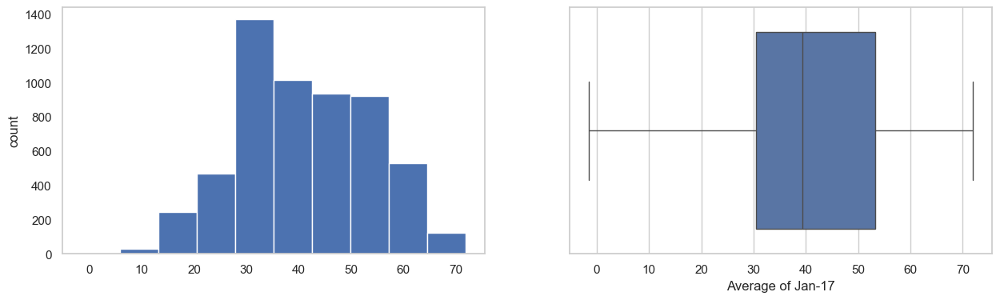

Average of Feb-17
Skew : 0.18


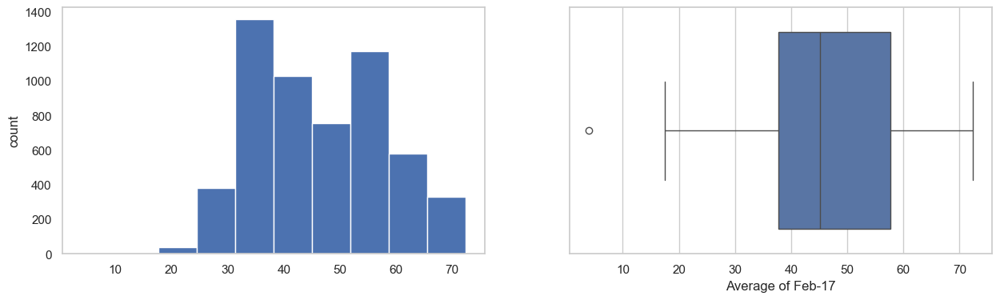

Average of Mar-17
Skew : 0.08


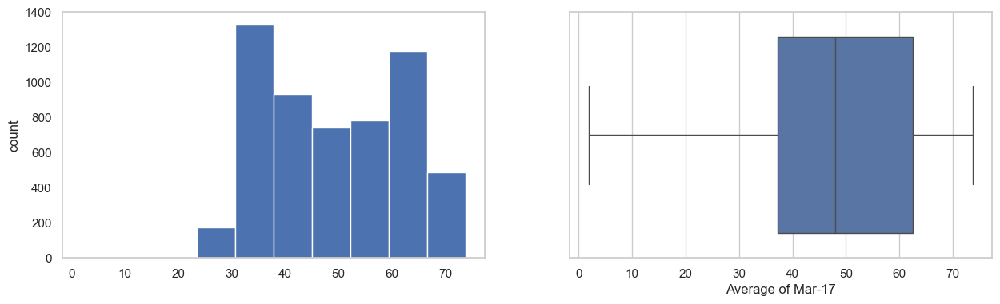

Average of Apr-17
Skew : 0.07


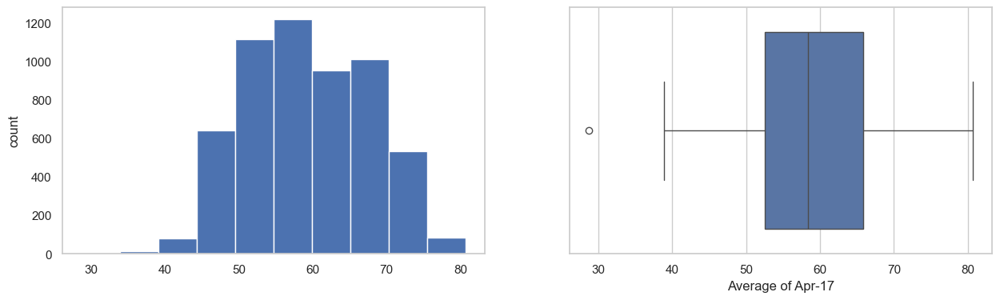

Average of May-17
Skew : 0.44


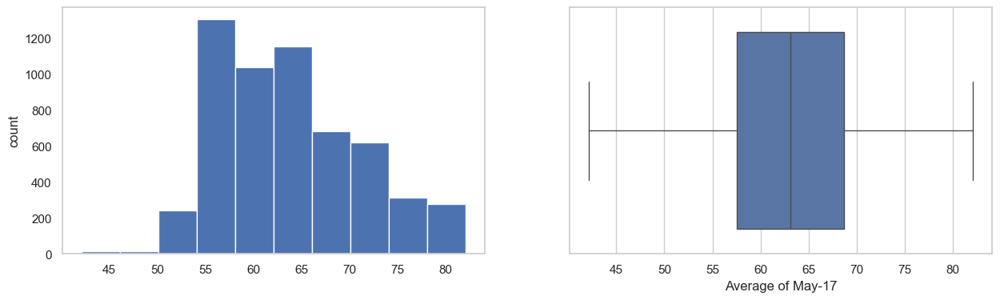

Average of Jun-17
Skew : 0.6


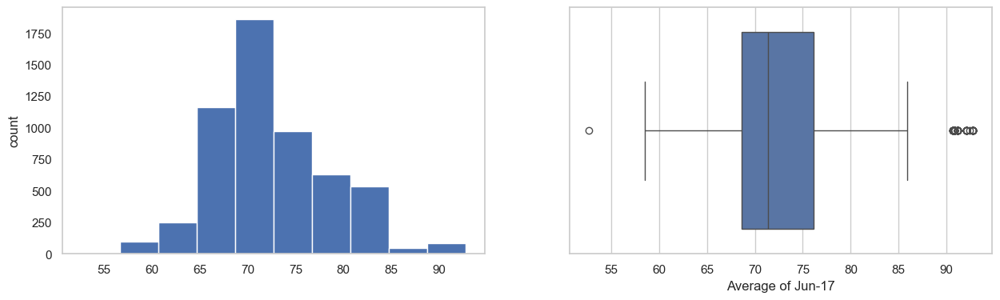

Average of Jul-17
Skew : 0.9


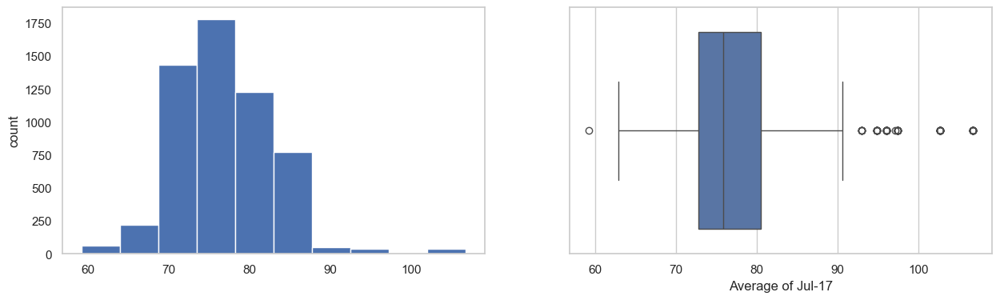

Average of Aug-17
Skew : 0.59


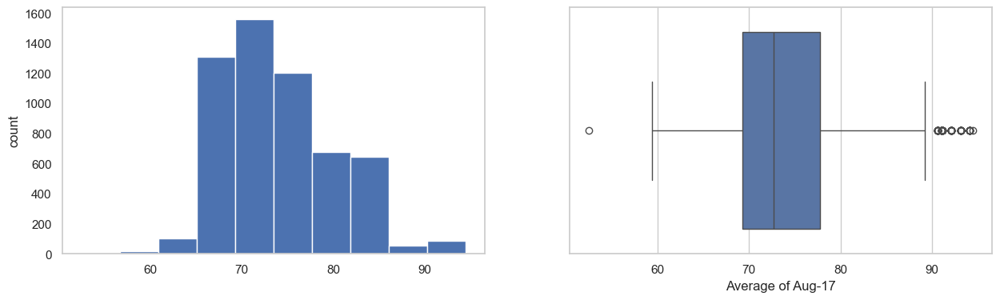

Average of Sep-17
Skew : 0.29


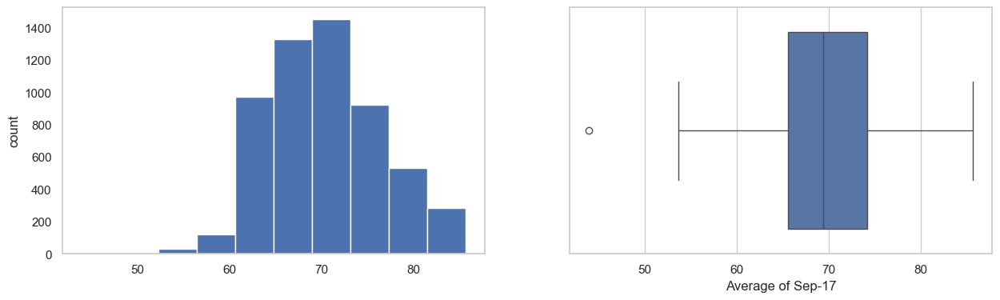

Average of Oct-17
Skew : 0.16


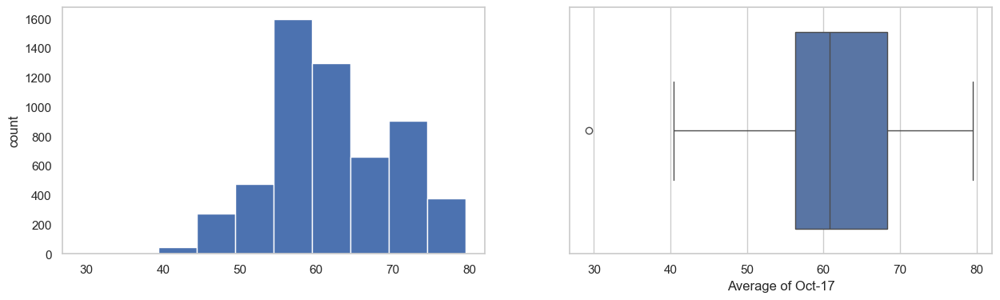

Average of Nov-17
Skew : 0.32


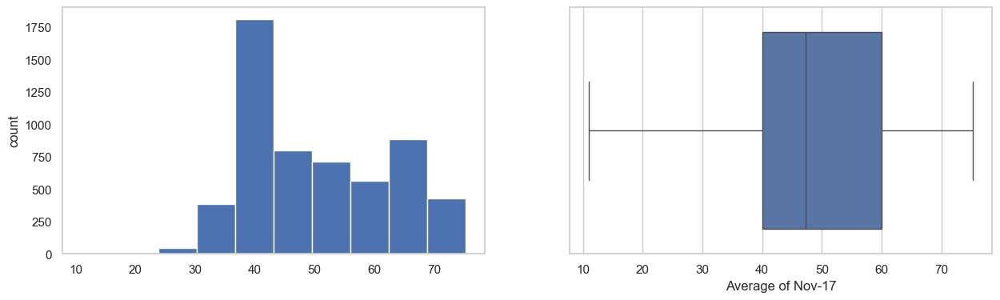

Average of Dec-17
Skew : 0.39


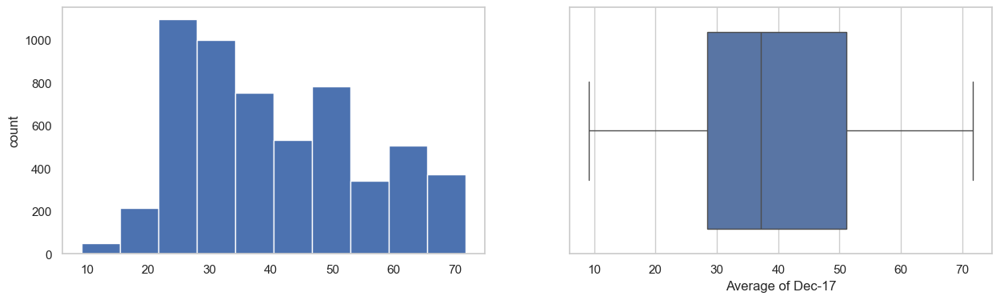

Average of Jan-18
Skew : 0.43


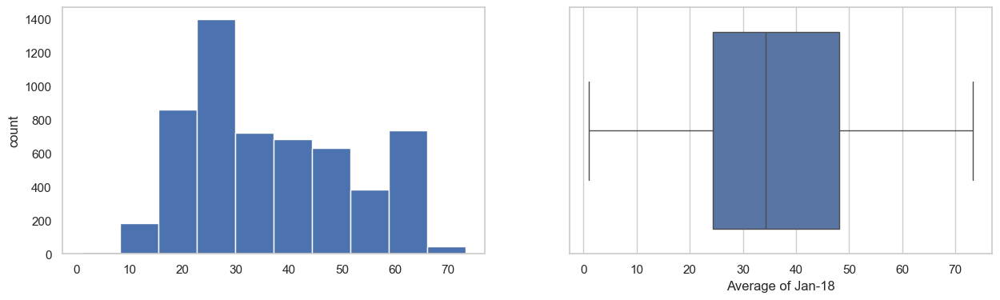

Average of Feb-18
Skew : -0.07


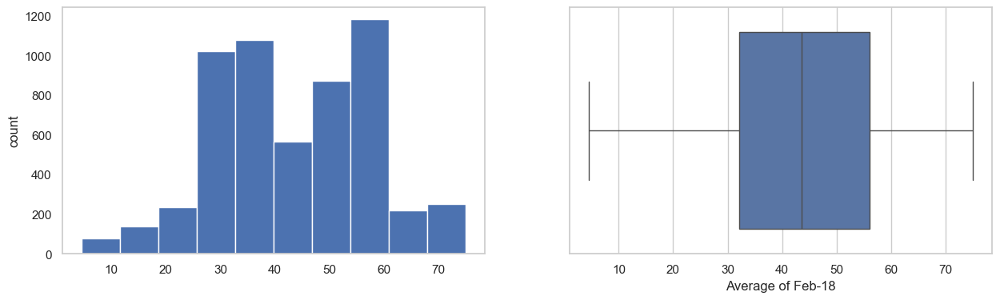

Average of Mar-18
Skew : 0.25


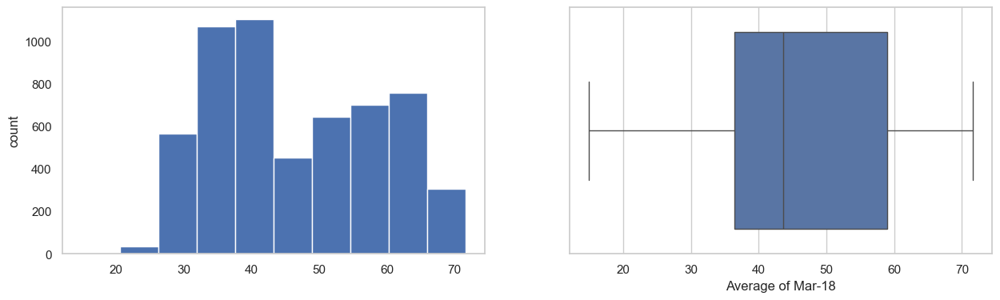

Average of Apr-18
Skew : 0.13


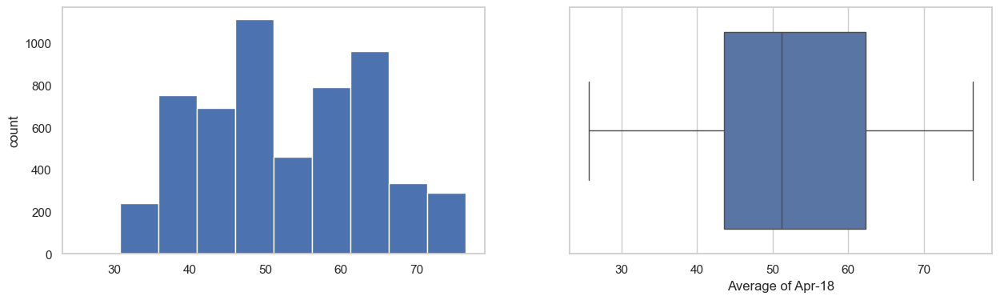

Average of May-18
Skew : 0.35


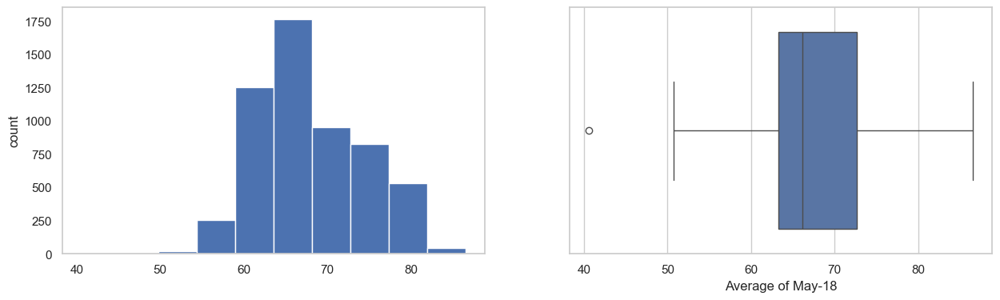

Average of Jun-18
Skew : 0.29


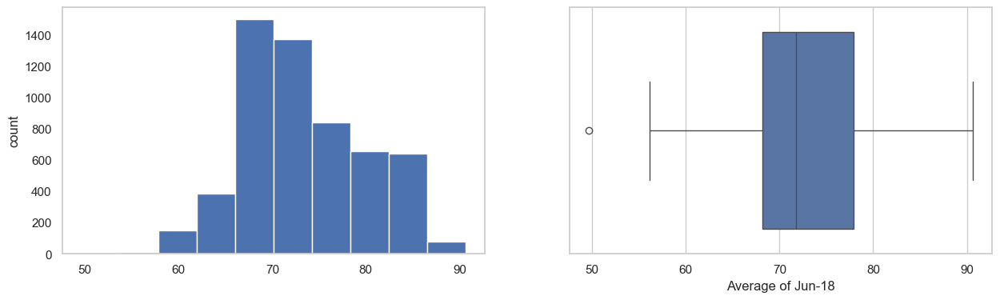

Average of Jul-18
Skew : 0.56


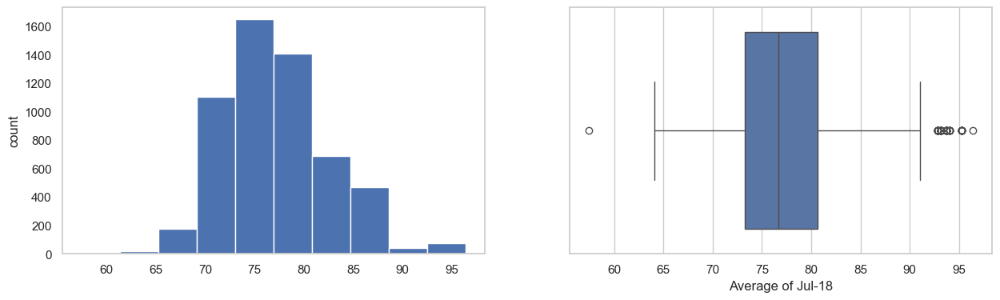

Average of Aug-18
Skew : 0.29


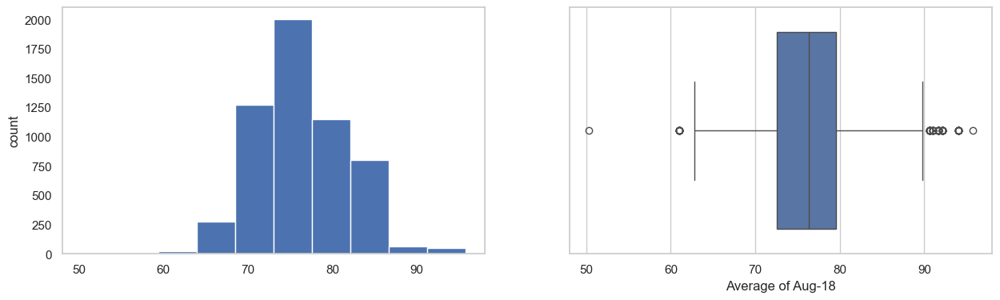

Average of Sep-18
Skew : 0.13


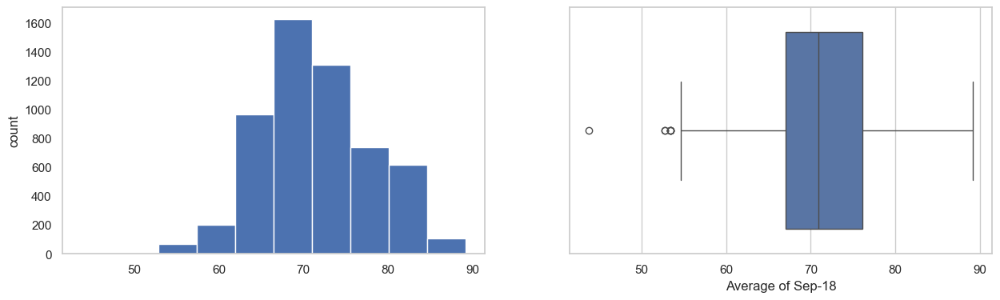

Average of Oct-18
Skew : 0.18


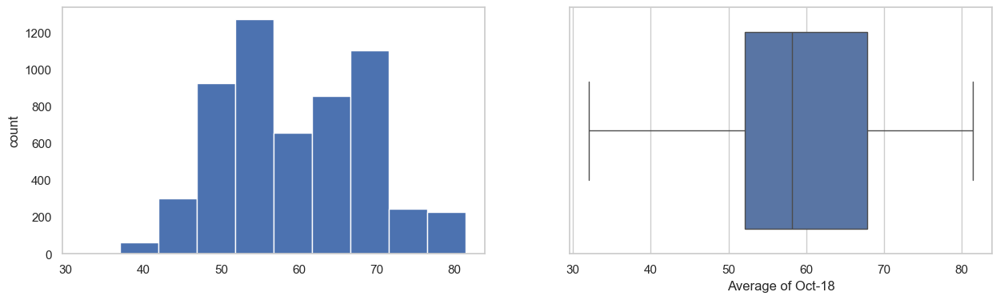

Average of Nov-18
Skew : 0.42


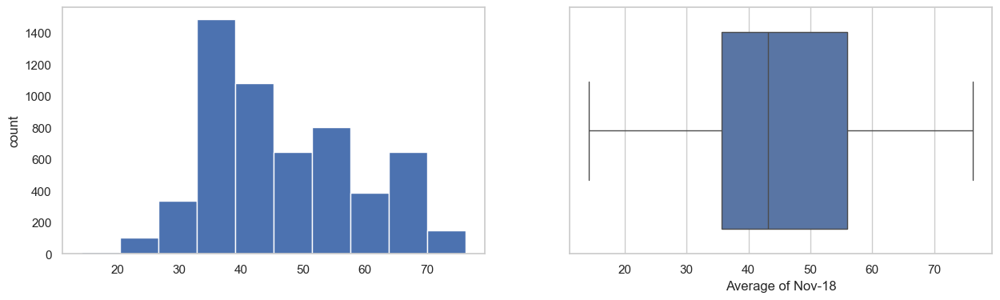

Average of Dec-18
Skew : 0.42


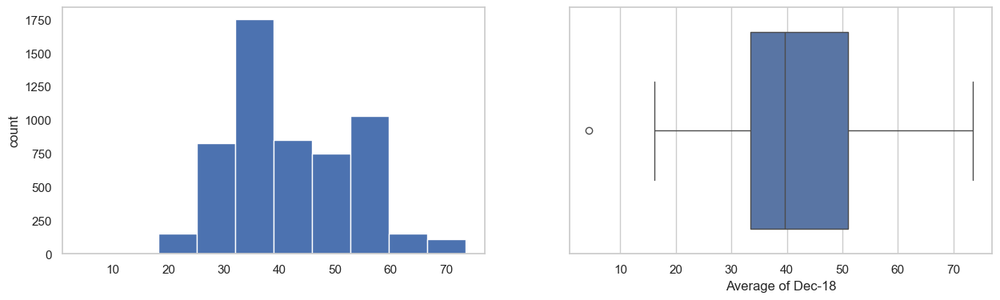

metastatic_diagnosis_period


KeyError: 'metastatic_diagnosis_period'

In [45]:
# Histogram and box plot of numerical data for df_test

for col in num_cols:
    print(col)
    print('Skew :', round(df_test[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_test[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_test[col])
    plt.show()

#### Observations of data

**bmi** 3 major outliers for train data, perhaps we drop those rows

**density** is quite skewed and has many outliers, but same for both data sets

**metastatic_diagnosis_period** Median is less than 50 days, has a right positive skew

**age_over_80** Out of proportion between the data sets based on histograms (box plots are very similar)


In [46]:
print(cat_cols)

Index(['patient_race', 'payer_type', 'patient_state', 'Region', 'Division',
       'breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc',
       'metastatic_cancer_diagnosis_code'],
      dtype='object')


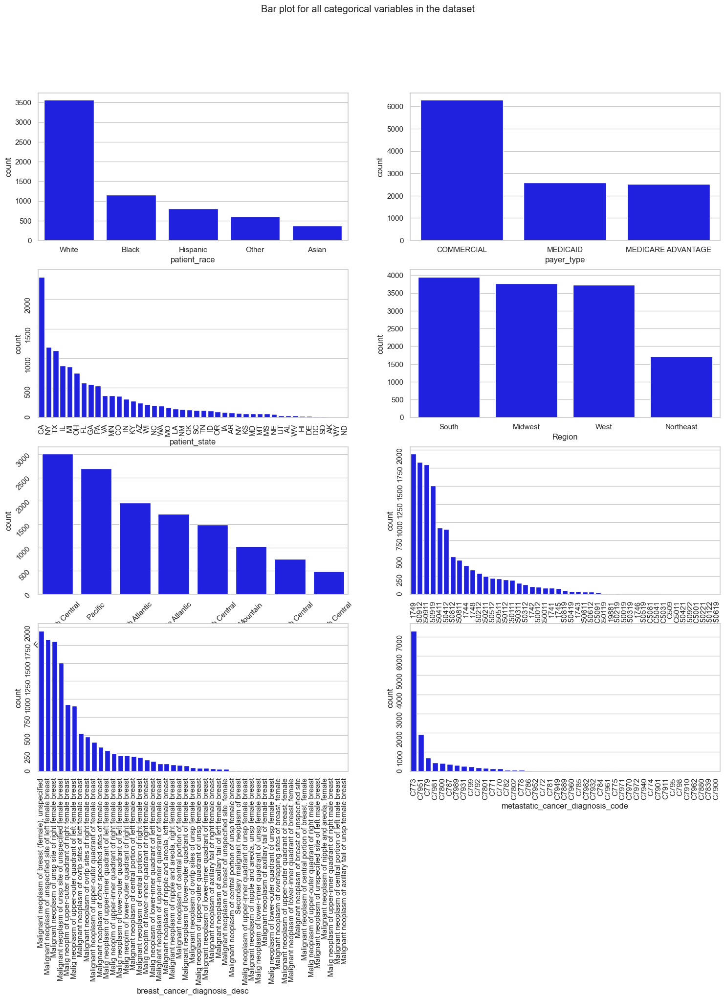

In [52]:
# Count plot of categorical data for df_train

fig, axes = plt.subplots(4, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'patient_race', data = df_train, color = 'blue', 
              order = df_train['patient_race'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'payer_type', data = df_train, color = 'blue', 
              order = df_train['payer_type'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'patient_state', data = df_train, color = 'blue', 
              order = df_train['patient_state'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Region', data = df_train, color = 'blue', 
              order = df_train['Region'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Division', data = df_train, color = 'blue', 
              order = df_train['Division'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'breast_cancer_diagnosis_code', data = df_train, color = 'blue', 
              order = df_train['breast_cancer_diagnosis_code'].value_counts().index);
sns.countplot(ax = axes[3, 0], x = 'breast_cancer_diagnosis_desc', data = df_train, color = 'blue', 
              order = df_train['breast_cancer_diagnosis_desc'].value_counts().index);
sns.countplot(ax = axes[3, 1], x = 'metastatic_cancer_diagnosis_code', data = df_train, color = 'blue', 
              order = df_train['metastatic_cancer_diagnosis_code'].value_counts().index);

axes[1][0].tick_params(labelrotation=90);
axes[2][0].tick_params(labelrotation=45);
axes[2][1].tick_params(labelrotation=90);
axes[3][0].tick_params(labelrotation=90);
axes[3][1].tick_params(labelrotation=90);

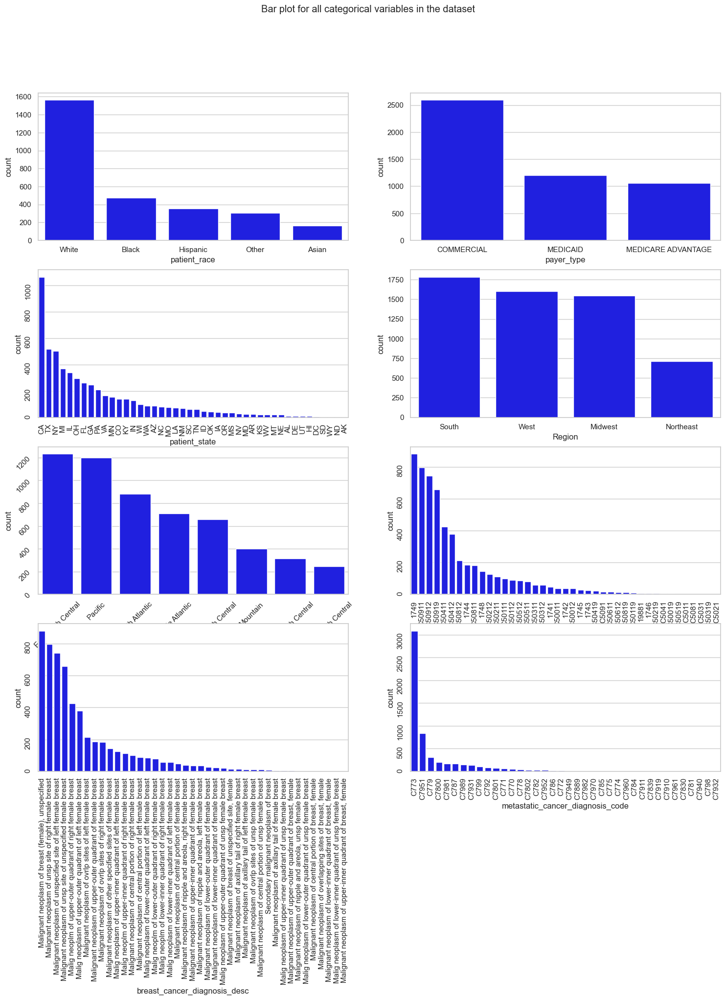

In [53]:
# Count plot of categorical data for df_test

fig, axes = plt.subplots(4, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'patient_race', data = df_test, color = 'blue', 
              order = df_test['patient_race'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'payer_type', data = df_test, color = 'blue', 
              order = df_test['payer_type'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'patient_state', data = df_test, color = 'blue', 
              order = df_test['patient_state'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Region', data = df_test, color = 'blue', 
              order = df_test['Region'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Division', data = df_test, color = 'blue', 
              order = df_test['Division'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'breast_cancer_diagnosis_code', data = df_test, color = 'blue', 
              order = df_test['breast_cancer_diagnosis_code'].value_counts().index);
sns.countplot(ax = axes[3, 0], x = 'breast_cancer_diagnosis_desc', data = df_test, color = 'blue', 
              order = df_test['breast_cancer_diagnosis_desc'].value_counts().index);
sns.countplot(ax = axes[3, 1], x = 'metastatic_cancer_diagnosis_code', data = df_test, color = 'blue', 
              order = df_test['metastatic_cancer_diagnosis_code'].value_counts().index);

axes[1][0].tick_params(labelrotation=90);
axes[2][0].tick_params(labelrotation=45);
axes[2][1].tick_params(labelrotation=90);
axes[3][0].tick_params(labelrotation=90);
axes[3][1].tick_params(labelrotation=90);


In [58]:
# Group the data by breast_cancer_diagnosis_code and calculate the mean metastatic_diagnosis_period

grouped_data = df_train.groupby("breast_cancer_diagnosis_code").mean()["metastatic_diagnosis_period"]
grouped_data.head()

/var/folders/8r/q9vf3mg157q2lngs76kpd_3w0000gn/T/ipykernel_79850/266940466.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = df_train.groupby("breast_cancer_diagnosis_code").mean()["metastatic_diagnosis_period"]


breast_cancer_diagnosis_code
1741    221.058140
1742    214.545455
1743    204.477273
1744    224.022388
1745    220.098765
Name: metastatic_diagnosis_period, dtype: float64

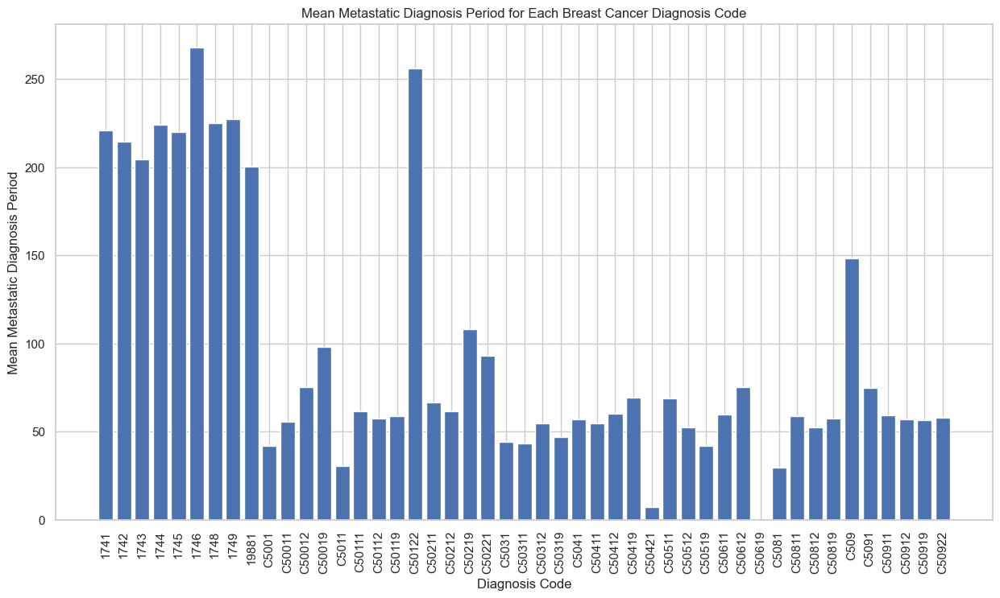

In [59]:
# Plot a bar chart of the mean metastatic_diagnosis_period for each breast_cancer_diagnosis_code

plt.figure(figsize=(15, 8))
plt.bar(range(len(grouped_data)), grouped_data)
plt.xticks(range(len(grouped_data)), grouped_data.index, rotation=90)
plt.xlabel("Diagnosis Code")
plt.ylabel("Mean Metastatic Diagnosis Period")
plt.title("Mean Metastatic Diagnosis Period for Each Breast Cancer Diagnosis Code")
plt.show()

In [60]:
# Group the data by metastatic_cancer_diagnosis_code and calculate the mean metastatic_diagnosis_period

grouped_data = df_train.groupby("metastatic_cancer_diagnosis_code").mean()["metastatic_diagnosis_period"]
grouped_data.head()

/var/folders/8r/q9vf3mg157q2lngs76kpd_3w0000gn/T/ipykernel_79850/3756577971.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = df_train.groupby("metastatic_cancer_diagnosis_code").mean()["metastatic_diagnosis_period"]


metastatic_cancer_diagnosis_code
C770    115.850000
C771     97.710345
C772     68.965517
C773     88.843806
C774    102.000000
Name: metastatic_diagnosis_period, dtype: float64

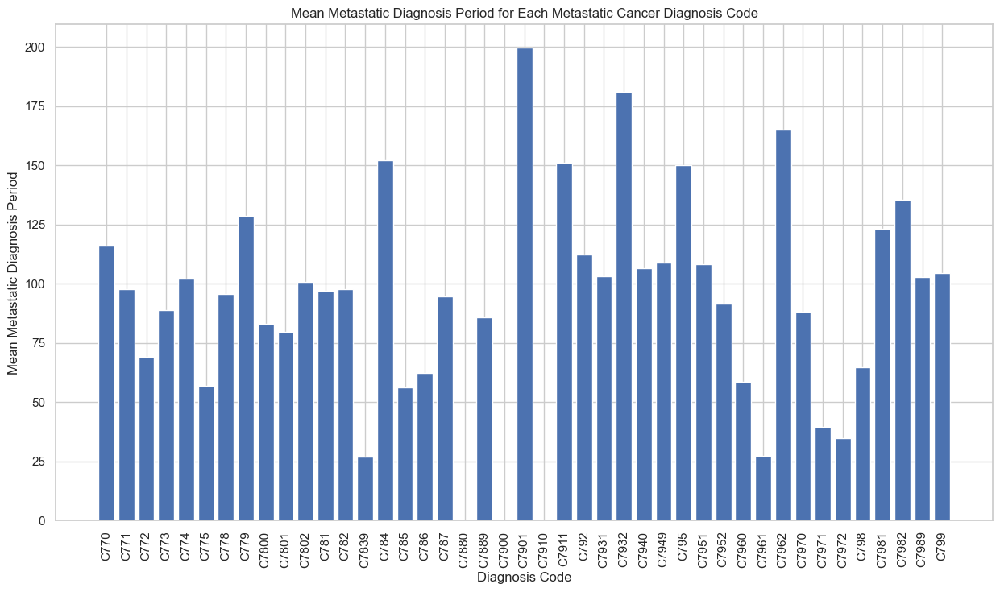

In [61]:
# Plot a bar chart of the mean metastatic_diagnosis_period for each metastatic_cancer_diagnosis_code

plt.figure(figsize=(15, 8))
plt.bar(range(len(grouped_data)), grouped_data)
plt.xticks(range(len(grouped_data)), grouped_data.index, rotation=90)
plt.xlabel("Diagnosis Code")
plt.ylabel("Mean Metastatic Diagnosis Period")
plt.title("Mean Metastatic Diagnosis Period for Each Metastatic Cancer Diagnosis Code")
plt.show()

## Visualizations - bivariate analysis

In [66]:
print(cat_cols)

Index(['patient_race', 'payer_type', 'patient_state', 'Region', 'Division',
       'breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc',
       'metastatic_cancer_diagnosis_code'],
      dtype='object')


In [70]:
print(df_train['breast_cancer_diagnosis_code'].unique())

['C50912' 'C50412' '1749' 'C50911' '1748' 'C50411' 'C50212' 'C50811'
 'C50919' 'C50211' '1744' 'C50012' 'C50112' 'C50812' 'C50311' 'C50011'
 'C50511' 'C50512' '1741' 'C50819' '1745' '1742' 'C50312' '19881' 'C50219'
 'C50111' 'C50611' '1743' 'C50612' 'C5091' 'C5011' 'C50519' 'C50421'
 'C50319' 'C50419' 'C5041' 'C5081' '1746' 'C5031' 'C50922' 'C50119'
 'C5001' 'C50221' 'C509' 'C50019' 'C50122' 'C50619']


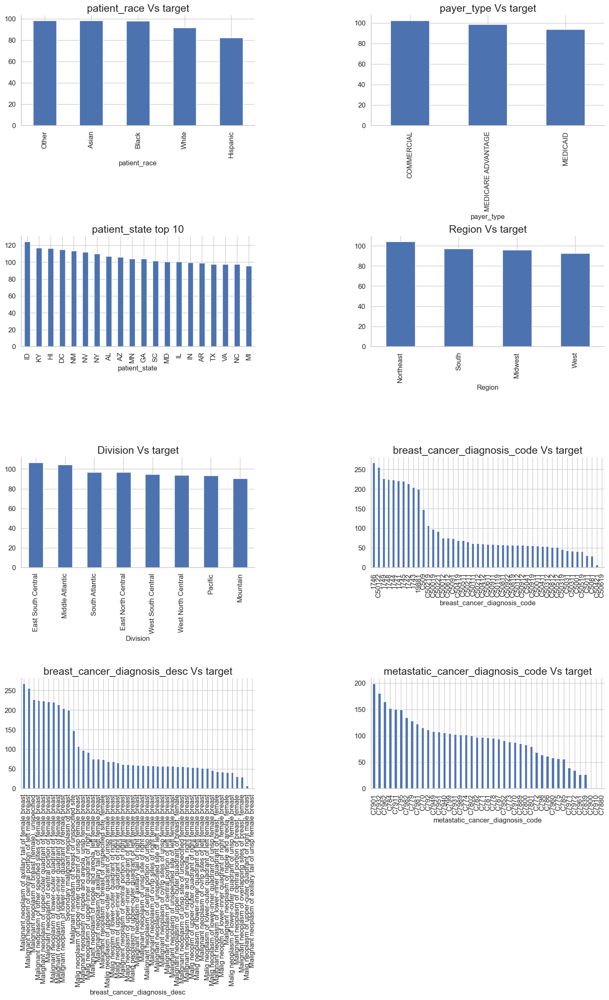

In [75]:
# Use bar plot to show the relationship between Categorical variables and the target continuous variables 

fig, axarr = plt.subplots(4, 2, figsize=(18, 24))
df_train.groupby('patient_race')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12)
axarr[0][0].set_title("patient_race Vs target", fontsize=18)
df_train.groupby('payer_type')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12)
axarr[0][1].set_title("payer_type Vs target", fontsize=18)
df_train.groupby('patient_state')[target_col].mean().sort_values(ascending=False).head(20).plot.bar(ax=axarr[1][0], fontsize=12)
axarr[1][0].set_title("patient_state top 10", fontsize=18)
df_train.groupby('Region')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][1], fontsize=12)
axarr[1][1].set_title("Region Vs target", fontsize=18)
df_train.groupby('Division')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[2][0], fontsize=12)
axarr[2][0].set_title("Division Vs target", fontsize=18)
df_train.groupby('breast_cancer_diagnosis_code')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[2][1], fontsize=12)
axarr[2][1].set_title("breast_cancer_diagnosis_code Vs target", fontsize=18)
df_train.groupby('breast_cancer_diagnosis_desc')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][0], fontsize=12)
axarr[3][0].set_title("breast_cancer_diagnosis_desc Vs target", fontsize=18)
df_train.groupby('metastatic_cancer_diagnosis_code')[target_col].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][1], fontsize=12)
axarr[3][1].set_title("metastatic_cancer_diagnosis_code Vs target", fontsize=18)
plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

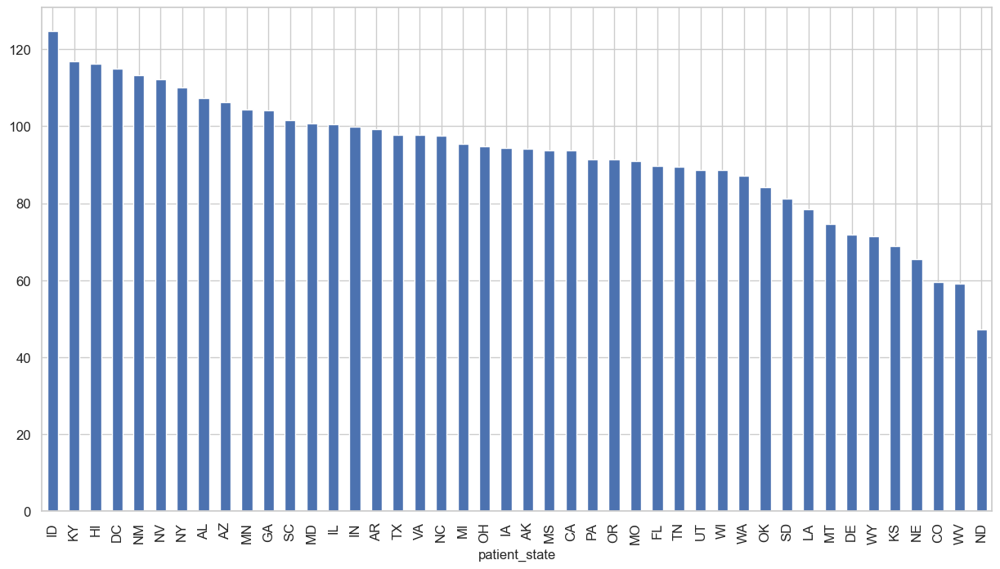

In [76]:


plt.figure(figsize=(15, 8))
df_train.groupby('patient_state')[target_col].mean().sort_values(ascending=False).plot.bar(fontsize=12)
plt.show()

## Clean data

In [25]:
# Data prep - replace categorical column nulls with 'unknown'

for column in cat_cols:
    df_train[column] = df_train[column].mask(df_train[column].isnull(), 'unknown')
    df_test[column] = df_test[column].mask(df_test[column].isnull(), 'unknown')

In [26]:
# Drop target from num_cols

num_cols.remove(target_col)

In [27]:
# Data prep - remaining nulls are in numeric columns - convert them to mean values from df_train
# (since df_train has more data and will likely have a more representative mean value than df_test)

for column in num_cols:
    mean_value = df_train[column].mean()
    df_train[column] = df_train[column].mask(df_train[column].isnull(), mean_value)
    df_test[column] = df_test[column].mask(df_test[column].isnull(), mean_value) 

df_train.head()

# Alternatively, assign large numbers to nulls in numeric columns
'''
for column in num_cols:
    replacement_value = 1000000
    df_train[column] = df_train[column].mask(df_train[column].isnull(), replacement_value)
    df_test[column] = df_test[column].mask(df_test[column].isnull(), replacement_value) 

df_train.head()
'''

,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
patient_id,,,,,,,,,,,,,,,,,,,,,
268700,unknown,COMMERCIAL,AR,724,South,West South Central,39,1000000.00,C50912,Malignant neoplasm of unspecified site of left...,...,52.55,74.77,79.96,81.69,78.30,74.56,59.98,42.98,41.18,191
484983,White,unknown,IL,629,Midwest,East North Central,55,35.36,C50412,Malig neoplasm of upper-outer quadrant of left...,...,49.30,72.87,77.40,77.43,75.83,72.64,58.36,39.68,39.71,33
277055,unknown,COMMERCIAL,CA,925,West,Pacific,59,1000000.00,1749,"Malignant neoplasm of breast (female), unspeci...",...,68.50,70.31,78.61,87.24,85.52,80.75,70.81,62.67,55.58,157
320055,Hispanic,MEDICAID,CA,900,West,Pacific,59,1000000.00,C50911,Malignant neoplasm of unsp site of right femal...,...,63.34,63.10,67.45,75.86,75.24,71.10,68.95,65.46,59.46,146
190386,unknown,COMMERCIAL,CA,934,West,Pacific,71,1000000.00,1748,Malignant neoplasm of other specified sites of...,...,59.45,60.24,64.77,69.81,70.13,68.10,65.38,60.72,54.08,286


In [28]:
# Convert categorical columns to numbers using LabelEncoder()

for column in cat_cols:
    df_combined = pd.concat([df_train, df_test], axis=0)
    le = LabelEncoder()
    le.fit(df_combined[column])
    df_train[column] = le.transform(df_train[column])
    df_test[column] = le.transform(df_test[column])

df_train.head()

,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
patient_id,,,,,,,,,,,,,,,,,,,,,
268700,5,0,2,724,2,7,39,1000000.00,45,41,...,52.55,74.77,79.96,81.69,78.30,74.56,59.98,42.98,41.18,191
484983,4,3,13,629,0,0,55,35.36,29,7,...,49.30,72.87,77.40,77.43,75.83,72.64,58.36,39.68,39.71,33
277055,5,0,4,925,3,4,59,1000000.00,7,18,...,68.50,70.31,78.61,87.24,85.52,80.75,70.81,62.67,55.58,157
320055,2,1,4,900,3,4,59,1000000.00,44,39,...,63.34,63.10,67.45,75.86,75.24,71.10,68.95,65.46,59.46,146
190386,5,0,4,934,3,4,71,1000000.00,6,34,...,59.45,60.24,64.77,69.81,70.13,68.10,65.38,60.72,54.08,286


In [17]:
df_train.isnull().sum()

patient_race                        0
payer_type                          0
patient_state                       0
patient_zip3                        0
Region                              0
Division                            0
patient_age                         0
bmi                                 0
breast_cancer_diagnosis_code        0
breast_cancer_diagnosis_desc        0
metastatic_cancer_diagnosis_code    0
population                          0
density                             0
age_median                          0
age_under_10                        0
age_10_to_19                        0
age_20s                             0
age_30s                             0
age_40s                             0
age_50s                             0
age_60s                             0
age_70s                             0
age_over_80                         0
male                                0
female                              0
married                             0
divorced    

In [19]:
df_test.isnull().sum()

patient_race                        0
payer_type                          0
patient_state                       0
patient_zip3                        0
Region                              0
Division                            0
patient_age                         0
bmi                                 0
breast_cancer_diagnosis_code        0
breast_cancer_diagnosis_desc        0
metastatic_cancer_diagnosis_code    0
population                          0
density                             0
age_median                          0
age_under_10                        0
age_10_to_19                        0
age_20s                             0
age_30s                             0
age_40s                             0
age_50s                             0
age_60s                             0
age_70s                             0
age_over_80                         0
male                                0
female                              0
married                             0
divorced    

In [20]:
df_test.head()

,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
patient_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
730681,5,0,17,713,2,7,55,29.168134,5,14,41,4639.07,72.66,41.50,11.40,13.44,11.42,11.45,12.56,13.08,14.26,7.71,4.73,50.02,49.98,42.37,14.70,34.76,8.18,3.30,38.83,40643.61,6.77,5.02,9.93,7.53,6.36,11.54,12.60,12.70,11.60,9.53,6.43,15.97,22663.32,74.78,1698.43,113973.9,671.07,37.23,21.30,36.81,26.95,9.74,5.21,14.94,38.47,49.41,8.08,12.89,4.88,66.51,29.06,0.40,0.37,0.10,0.66,2.91,2.52,20.33,27.62,0.55,29.71,8.18,5.79,51.34,53.19,54.23,64.00,72.08,81.10,80.89,82.15,79.95,68.38,53.90,48.64,42.32,48.58,54.30,64.82,71.66,80.19,80.20,81.40,77.97,68.84,52.59,52.09,46.08,46.21,58.97,69.57,74.68,80.54,84.27,86.11,78.99,69.81,62.72,58.46,47.79,54.72,63.75,72.19,73.58,80.75,86.61,83.09,80.58,71.67,62.00,52.89,56.28,60.76,63.94,69.87,71.66,78.19,82.68,80.93,76.97,68.88,61.15,49.82,42.66,58.12,62.21,62.23,78.34,81.96,83.58,82.22,80.20,69.73,53.14,51.34
334212,1,3,24,283,2,5,60,40.000000,45,41,3,10875.30,217.91,39.64,11.23,13.72,15.01,12.02,11.58,11.77,12.77,8.52,3.41,51.33,48.67,44.14,13.28,34.62,7.96,3.33,42.57,49924.38,4.59,3.83,6.58,5.27,5.90,13.16,13.99,18.14,10.65,11.39,6.49,17.88,26495.64,67.09,4034.71,119537.2,806.92,31.42,15.22,31.24,34.65,12.87,6.00,18.88,36.55,56.90,8.38,10.64,1.40,54.08,26.66,0.80,8.35,0.13,4.83,5.14,10.76,17.82,19.78,2.10,25.95,13.60,12.58,45.78,43.22,45.83,61.17,67.66,76.35,78.99,76.54,75.13,62.32,49.83,47.81,37.63,44.48,46

### Correlations

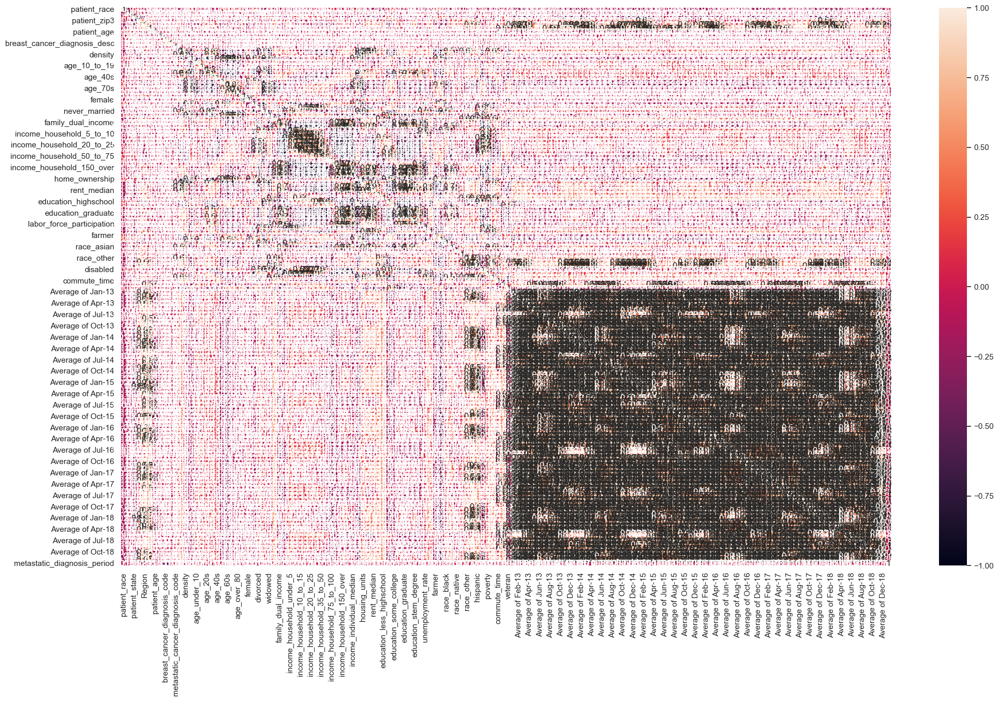

In [33]:
# Multivariate analysis using a heat map

plt.figure(figsize=(24, 14))
sns.heatmap(df_train.corr(), annot = True, vmin = -1, vmax = 1)
plt.show()


In [11]:
# Look at feature correlations to the target column

df_train.corr()[target_col].abs().sort_values()

veteran                             0.000035
Average of Nov-16                   0.000059
home_ownership                      0.000192
rent_burden                         0.000201
Average of Sep-13                   0.000225
Average of Jan-13                   0.000390
health_uninsured                    0.000402
age_50s                             0.000442
Average of Dec-15                   0.000578
Average of Mar-16                   0.000599
Average of Jul-18                   0.000706
farmer                              0.000757
Average of Apr-16                   0.000912
Average of Apr-18                   0.001252
Average of Oct-16                   0.001442
Average of Jun-13                   0.001921
race_pacific                        0.002337
Average of Sep-14                   0.002724
Average of Dec-14                   0.002734
race_native                         0.002987
Average of Dec-16                   0.002997
race_asian                          0.003023
divorced  

In [12]:
# Use features with threshold > X

#threshold = 0.0285
threshold = 0.025

hot_cols_series = df_train.corr()[target_col].abs() > threshold
cols_series = pd.Series(index=df_train.columns)
hot_cols = cols_series[hot_cols_series].index.tolist()

print(hot_cols)

['payer_type', 'patient_zip3', 'patient_age', 'bmi', 'breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc', 'metastatic_cancer_diagnosis_code', 'density', 'age_40s', 'widowed', 'family_size', 'family_dual_income', 'income_household_under_5', 'income_household_5_to_10', 'income_household_10_to_15', 'income_household_15_to_20', 'income_household_75_to_100', 'income_individual_median', 'education_less_highschool', 'education_bachelors', 'education_college_or_above', 'labor_force_participation', 'unemployment_rate', 'race_black', 'poverty', 'Average of May-15', 'Average of Aug-16', 'metastatic_diagnosis_period']


/var/folders/8r/q9vf3mg157q2lngs76kpd_3w0000gn/T/ipykernel_13976/3346380618.py:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  cols_series = pd.Series(index=df_train.columns)


In [13]:
len(hot_cols)

28

In [14]:
hot_cols_xy = hot_cols.copy()
hot_cols.remove(target_col)
print(f'hot columns: {len(hot_cols)}')
for c in hot_cols:
    print('  ' + c)

hot columns: 27
  payer_type
  patient_zip3
  patient_age
  bmi
  breast_cancer_diagnosis_code
  breast_cancer_diagnosis_desc
  metastatic_cancer_diagnosis_code
  density
  age_40s
  widowed
  family_size
  family_dual_income
  income_household_under_5
  income_household_5_to_10
  income_household_10_to_15
  income_household_15_to_20
  income_household_75_to_100
  income_individual_median
  education_less_highschool
  education_bachelors
  education_college_or_above
  labor_force_participation
  unemployment_rate
  race_black
  poverty
  Average of May-15
  Average of Aug-16


In [15]:
# Create new dataframes with the most correlated features

df_train_hot = df_train[hot_cols_xy]
#f_train_hot_X = df_train[hot_cols]
df_test_hot = df_test[hot_cols]

In [16]:
df_train_hot.shape

(13168, 28)

In [17]:
df_test_hot.shape

(5646, 27)

In [31]:
df_train_hot.head()

,payer_type,patient_zip3,patient_age,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,family_dual_income,income_household_10_to_15,education_bachelors,labor_force_participation,poverty,Average of May-15,metastatic_diagnosis_period
patient_id,,,,,,,,,,,,,
268700,0,724,39,45,41,3,43.99,8.52,9.21,53.60,19.27,68.49,191
484983,3,629,55,29,7,3,41.41,6.58,12.46,52.51,16.94,66.81,33
277055,0,925,59,7,18,3,52.89,3.16,13.92,59.47,12.72,68.06,157
320055,1,900,59,44,39,3,55.53,6.81,23.89,64.39,20.76,62.56,146
190386,0,934,71,6,34,32,51.88,2.56,19.14,55.20,10.34,58.19,286


In [18]:
# Save dataframes to csv

df_train_hot.to_csv("data/train_hot_27.csv", index=False)
df_test_hot.to_csv("data/test_hot_27.csv", index=False)

In [19]:
# Save dataframes to csv with index

df_train_hot.to_csv("data/train_hot_27_idx.csv")
df_test_hot.to_csv("data/test_hot_27_idx.csv")

In [30]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [31]:
# Look at feature correlations to the target column

df_train.corr()['breast_cancer_diagnosis_code'].abs().sort_values()

race_native                         0.000171
Average of Jul-14                   0.000386
Average of Feb-18                   0.000738
Average of Nov-17                   0.000740
Average of Jan-16                   0.000787
Average of Feb-16                   0.000788
Average of Oct-15                   0.000794
Average of Nov-15                   0.000796
Average of Jul-16                   0.000803
Average of Feb-14                   0.000845
Average of Jan-15                   0.001023
unemployment_rate                   0.001259
Average of May-14                   0.001464
metastatic_cancer_diagnosis_code    0.001593
Average of Apr-17                   0.001746
Average of Nov-14                   0.001954
Average of Aug-18                   0.002042
Average of Mar-18                   0.002557
Average of May-16                   0.003202
Average of Mar-14                   0.003205
education_less_highschool           0.003309
Average of Jul-17                   0.003369
Average of

### Feature engineering

Let's do something clever with the weather data

In [11]:
# Create a new dataframe with just zip and avg temps

# Define the prefix for the columns to be kept
prefix = "Average of"

# Define the columns to be kept
keep_columns = [col for col in df_train.columns if col.startswith(prefix)]

# Create a new DataFrame with only the selected columns
df_temps = df_train[keep_columns]
df_temps_test = df_test[keep_columns]

df_temps.head()

,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,...,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
patient_id,,,,,,,,,,,,,,,,,,,,,
268700,38.55,39.88,42.75,55.16,65.17,75.98,76.75,76.45,73.67,59.73,...,50.22,52.55,74.77,79.96,81.69,78.30,74.56,59.98,42.98,41.18
484983,34.85,36.15,39.41,54.63,65.41,73.89,74.07,74.37,70.44,57.37,...,44.18,49.30,72.87,77.40,77.43,75.83,72.64,58.36,39.68,39.71
277055,53.14,55.28,64.75,67.38,73.31,79.49,84.01,83.28,79.88,67.84,...,60.97,68.50,70.31,78.61,87.24,85.52,80.75,70.81,62.67,55.58
320055,57.88,57.65,60.86,62.77,67.07,68.41,70.69,71.19,72.74,66.41,...,59.35,63.34,63.10,67.45,75.86,75.24,71.10,68.95,65.46,59.46
190386,51.08,52.29,58.31,60.43,63.65,67.41,68.21,67.95,67.95,61.73,...,55.78,59.45,60.24,64.77,69.81,70.13,68.10,65.38,60.72,54.08


In [12]:
df_temps['zip'] = df_train['patient_zip3']

/var/folders/8r/q9vf3mg157q2lngs76kpd_3w0000gn/T/ipykernel_33350/3856125468.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temps['zip'] = df_train['patient_zip3']


In [13]:
df_temps.shape

(13173, 73)

In [26]:
df_temps_test = df_temps_test.groupby(lambda x: x.split("-")[0], axis=1).mean()

df_temps_test.head()

,Average of Apr,Average of Aug,Average of Dec,Average of Feb,Average of Jan,Average of Jul,Average of Jun,Average of Mar,Average of May,Average of Nov,Average of Oct,Average of Sep
patient_id,,,,,,,,,,,,
730681,67.113333,82.650000,52.206667,53.596667,47.745000,83.038333,80.455000,59.566667,73.666667,57.583333,69.551667,79.110000
334212,62.328333,79.666667,48.251667,46.295000,41.746667,81.061667,78.636667,51.373333,71.628333,52.125000,63.793333,75.656667
571362,61.848333,79.631667,43.313333,47.345000,42.236667,81.463333,79.495000,56.010000,70.583333,51.406667,63.871667,73.578333
907331,58.625000,75.475000,43.456667,41.880000,36.988333,76.373333,74.506667,48.431667,67.013333,48.051667,60.878333,71.570000
208382,47.836667,65.273333,36.296667,39.448333,37.375000,64.638333,59.628333,43.456667,55.488333,42.451667,50.620000,58.225000


In [27]:
df_temps_test.shape

(5646, 12)

In [15]:
# Drop the selected columns from the original DataFrame
df_train.drop(keep_columns, axis=1, inplace=True)
df_train.shape

(13168, 76)

In [28]:
# Drop the selected columns from the original DataFrame
df_test.drop(keep_columns, axis=1, inplace=True)
df_test.shape

(5646, 75)

In [18]:
df_new = pd.concat([df_train,df_temps], axis = 1)

df_new.shape

(13168, 88)

In [29]:
df_new_test = pd.concat([df_test,df_temps_test], axis = 1)

df_new_test.shape

(5646, 87)

In [22]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [23]:
df_new.corr()[target_col].abs().sort_values()

veteran                             0.000035
Average of Oct                      0.000163
home_ownership                      0.000192
rent_burden                         0.000201
health_uninsured                    0.000402
age_50s                             0.000442
farmer                              0.000757
Average of Apr                      0.002323
race_pacific                        0.002337
race_native                         0.002987
race_asian                          0.003023
divorced                            0.003520
hispanic                            0.003750
age_median                          0.004343
Average of Dec                      0.004430
income_household_50_to_75           0.004559
female                              0.005132
male                                0.005133
never_married                       0.005271
Average of Nov                      0.006334
race_multiple                       0.006555
Average of Sep                      0.006955
education_

In [30]:
# Save dataframes to csv with index

df_new.to_csv("data/train_avg_tmps.csv")
df_new_test.to_csv("data/test_avg_tmps.csv")